# PROYECTO INTEGRADOR

## Avance 01 - Carga y transformación de los datos

##### Importo las librerías necesarias y leo el archivo original

In [ ]:
# 1/48 - Importación de Librerías - NumPy, Pandas, matplotlib, seaborn - OK
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [ ]:
# 2/48 - Lectura del archivo original y creacion del DF
df_data = pd.read_csv(r"F:\Desktop\PI-M3 FLOR NO BORRAR\PYTHON\M4 python\PIDA\data_latinoamerica.csv")

#####  Obtengo información de la data cargada para verificar.

In [ ]:
# 3/48 -   Obtengo información del DataFrame creado  - OK
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12216057 entries, 0 to 12216056
Data columns (total 50 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   location_key                           object 
 1   date                                   object 
 2   country_code                           object 
 3   country_name                           object 
 4   new_confirmed                          float64
 5   new_deceased                           float64
 6   cumulative_confirmed                   float64
 7   cumulative_deceased                    float64
 8   cumulative_vaccine_doses_administered  float64
 9   population                             float64
 10  population_male                        float64
 11  population_female                      float64
 12  population_rural                       float64
 13  population_urban                       float64
 14  population_density                     float64
 

In [ ]:
# 4/48 -   Se visualizan de las primeras filas del DataFrame para verificar que se haya cargado correctamente  - OK
df_data.head()

,location_key,date,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
0,AR,2020-01-01,AR,Argentina,3.0,0.0,3.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
1,AR,2020-01-02,AR,Argentina,14.0,0.0,17.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
2,AR,2020-01-03,AR,Argentina,3.0,0.0,20.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
3,AR,2020-01-04,AR,Argentina,7.0,0.0,27.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
4,AR,2020-01-05,AR,Argentina,5.0,0.0,32.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN


In [ ]:
# 5/48 - Se comprueba la cantidad de registros y columnas - El dataset tiene 12216057 registros y 50 columnas. OK
num_filas, num_columnas = df_data.shape
print(f"El dataset tiene {num_filas} registros y {num_columnas} columnas.")

El dataset tiene 12216057 registros y 50 columnas.


##### Filtro por Países - 'Argentina','Chile','Colombia','Mexico','Peru','Brazil'.
Lo hago por código para evitar inconvenientes con la ortografía

In [ ]:
# 6/55 - se realiza el FILTRO de países en que se expandirá la empresa

# Lista de países donde se expandirán OK
paises_code = ['AR','CL','CO','MX','PE','BR']

# Filtro el DataFrame para obtener solo los registros de los países especificados - 
# El dataset filtrado tiene 2045424 registros y 50 columnas.

df_data_expansion = df_data[df_data['country_code'].isin(paises_code)]

# Mostrar las primeras filas del DataFrame filtrado para verificar
print(df_data_expansion.head())

# Comprobar la cantidad de registros y columnas en el DataFrame filtrado
num_filas, num_columnas = df_data_expansion.shape
print(f"El dataset filtrado tiene {num_filas} registros y {num_columnas} columnas.")

  location_key        date country_code country_name  new_confirmed  \
0           AR  2020-01-01           AR    Argentina            3.0   
1           AR  2020-01-02           AR    Argentina           14.0   
2           AR  2020-01-03           AR    Argentina            3.0   
3           AR  2020-01-04           AR    Argentina            7.0   
4           AR  2020-01-05           AR    Argentina            5.0   

   new_deceased  cumulative_confirmed  cumulative_deceased  \
0           0.0                   3.0                  0.0   
1           0.0                  17.0                  0.0   
2           0.0                  20.0                  0.0   
3           0.0                  27.0                  0.0   
4           0.0                  32.0                  0.0   

   cumulative_vaccine_doses_administered  population  ...  \
0                                    NaN  44938712.0  ...   
1                                    NaN  44938712.0  ...   
2                

In [ ]:
# 7/55 - Verifico las dimensiones del array OK
np.shape(df_data_expansion)

(11970289, 50)

In [ ]:
# 8/55 -  Identifico y cuento las columnas del DataFrame que contienen más de 4,000,000 valores nulos (NaN).  - OK
df_data_expansion.isnull().sum()[df_data_expansion.isnull().sum()>4000000]

new_confirmed                             5620283
new_deceased                              5661788
cumulative_confirmed                      5619937
cumulative_deceased                       5661426
cumulative_vaccine_doses_administered    11706131
population_rural                         11964343
population_urban                         11964343
population_density                       11964343
human_development_index                   6472221
gdp_usd                                  11963352
gdp_per_capita_usd                       11962361
smoking_prevalence                       11964343
diabetes_prevalence                      11964343
infant_mortality_rate                    11964343
nurses_per_1000                          11964343
physicians_per_1000                      11964343
population_largest_city                  11964343
area_rural_sq_km                         11964343
area_urban_sq_km                         11964343
life_expectancy                          11964343


In [ ]:
# 9/55 - cuento la frecuencia de aparición de cada valor en la columna location_key OK
df_data_expansion.location_key.value_counts()

location_key
AR              991
MX_GRO_12040    991
MX_GRO_12031    991
MX_GRO_12032    991
MX_GRO_12033    991
               ... 
BR_PR_411880    991
BR_PR_411885    991
BR_PR_411890    991
BR_PR_411900    991
PE_UCA_0401     991
Name: count, Length: 12079, dtype: int64

In [ ]:
# 10/55 - obtengo el número de filas y columnas - OK
df_data_expansion_paises = df_data_expansion[df_data_expansion['location_key'].isin(['AR','CL','CO','MX','PE','BR'])]
df_data_expansion_paises.shape

(5946, 50)

##### Filtro por fechas mayore a 01-01-2021 y  verifico data filtrada

In [ ]:
# 11/48 - FILTRADO de los datos en fechas mayores a 2021-01-01. _ OK

# Convierto la columna 'Fecha' a tipo datetime 
df_data_expansion_paises['date'] = pd.to_datetime(df_data_expansion_paises['date'])

# Filtro los datos en fechas mayores a 2021-01-01 - 
fecha_limite = pd.to_datetime("2021-01-01")
df_data_expansion_paises_fecha = df_data_expansion_paises[df_data_expansion_paises['date'] > fecha_limite]

# Muestro las primeras filas del DataFrame filtrado para verificar
print(df_data_expansion_paises_fecha.head())

# Compruebo la cantidad de registros y columnas en el DataFrame filtrado
num_filas, num_columnas = df_data_expansion_paises_fecha.shape
print(f"El dataset filtrado tiene {num_filas} registros y {num_columnas} columnas.")


# filtrado debería tener 3744, 50

C:\Users\Personal Computer\AppData\Local\Temp\ipykernel_6264\2966656673.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data_expansion_paises['date'] = pd.to_datetime(df_data_expansion_paises['date'])


    location_key       date country_code country_name  new_confirmed  \
367           AR 2021-01-02           AR    Argentina         7767.0   
368           AR 2021-01-03           AR    Argentina         4934.0   
369           AR 2021-01-04           AR    Argentina        13953.0   
370           AR 2021-01-05           AR    Argentina        14085.0   
371           AR 2021-01-06           AR    Argentina        14496.0   

     new_deceased  cumulative_confirmed  cumulative_deceased  \
367         166.0             1670634.0              46688.0   
368         157.0             1675568.0              46845.0   
369         157.0             1689521.0              47002.0   
370         160.0             1703606.0              47162.0   
371         131.0             1718102.0              47293.0   

     cumulative_vaccine_doses_administered  population  ...  \
367                                20334.0  44938712.0  ...   
368                                20529.0  44938712.0  

In [ ]:
# 11-1/48 -   Obtengo información del DataFrame creado  - OK
df_data_expansion_paises_fecha.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3744 entries, 367 to 10253876
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   location_key                           3744 non-null   object        
 1   date                                   3744 non-null   datetime64[ns]
 2   country_code                           3744 non-null   object        
 3   country_name                           3744 non-null   object        
 4   new_confirmed                          3723 non-null   float64       
 5   new_deceased                           3723 non-null   float64       
 6   cumulative_confirmed                   3723 non-null   float64       
 7   cumulative_deceased                    3723 non-null   float64       
 8   cumulative_vaccine_doses_administered  3160 non-null   float64       
 9   population                             3744 non-null   float64

In [ ]:
# 12/55 - obtengo el número de filas y columnas - OK
df_data_expansion_paises_fecha = df_data_expansion_paises_fecha[df_data_expansion_paises_fecha['location_key'].isin(['AR','CL','CO','MX','PE','BR'])]
df_data_expansion_paises_fecha.shape

(3744, 50)

##### Grabo en un archivo csv para seguir trabajando con los nulos y  leo el archivo filtrado en un nuevo df= df_data_filtrada1

In [ ]:
# 13/48 - GRABO ARCHIVO MAS CHICO para poder seguir trabajando -
df_data_expansion_paises_fecha.to_csv('DatosFiltrados1.csv', index=False)

In [ ]:
# 14/55 - Leo el archivo CSV (mas chico) y lo cargo en un DataFrame de pandas OK

df_data_filtrada1 = pd.read_csv("F:\Desktop\PI-M3 FLOR NO BORRAR\PYTHON\M4 python\PIDA\DatosFiltrados1.csv")

<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
C:\Users\Personal Computer\AppData\Local\Temp\ipykernel_6264\2137822742.py:3: SyntaxWarning: invalid escape sequence '\D'
  df_data_filtrada1 = pd.read_csv("F:\Desktop\PI-M3 FLOR NO BORRAR\PYTHON\M4 python\PIDA\DatosFiltrados1.csv")


#####  Obtengo información de la data cargada para verificar.

In [ ]:
# 15/55 - obtengo el número de filas y columnas - OK
df_data_filtrada1 = df_data_filtrada1[df_data_filtrada1['location_key'].isin(['AR','CL','CO','MX','PE','BR'])]
df_data_filtrada1.shape

(3744, 50)

In [ ]:
# listar los nombres de las columnas con valores nulos

# Identificar columnas con valores nulos
columnas_con_nulos = df_data_filtrada1.columns[df.isnull().any()]

# Listar los nombres de las columnas con valores nulos
print("Columnas con valores nulos:")
for columna in columnas_con_nulos:
    print(columna)

# Si necesitas almacenar estos nombres en una lista
lista_columnas_con_nulos = columnas_con_nulos.tolist()

# Opcional: Crear un DataFrame con el conteo de valores nulos por columna
valores_nulos_fecha = df_data_filtrada1.isnull().sum()
valores_nulos_fecha = valores_nulos[valores_nulos > 0]

# Mostrar el DataFrame de valores nulos
print(valores_nulos)


Columnas con valores nulos:
new_confirmed
new_deceased
cumulative_confirmed
cumulative_deceased
cumulative_vaccine_doses_administered
average_temperature_celsius
minimum_temperature_celsius
maximum_temperature_celsius
rainfall_mm
relative_humidity
new_recovered
cumulative_recovered
new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     584
average_temperature_celsius                42
minimum_temperature_celsius                41
maximum_temperature_celsius                41
rainfall_mm                                90
relative_humidity                          42
new_recovered                            2116
cumulative_recovered                     2736
dtype: int64


In [ ]:
# 16/55 -  Listo los nombres de las columnas con valores nulos - OK
valores_nulos_fecha.index

Index(['new_confirmed', 'new_deceased', 'cumulative_confirmed',
       'cumulative_deceased', 'cumulative_vaccine_doses_administered',
       'average_temperature_celsius', 'minimum_temperature_celsius',
       'maximum_temperature_celsius', 'rainfall_mm', 'relative_humidity',
       'new_recovered', 'cumulative_recovered'],
      dtype='object')

In [ ]:
# 17/55 -  Comparo a nivel de país los nulos - OK
valores_nulos_fecha=df_data_filtrada1.isnull().sum()[df_data_filtrada1.isnull().sum()>0]
print(valores_nulos_fecha)
print(np.shape(df_data_filtrada1)) # Verifico las dimensiones del array

new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     584
average_temperature_celsius                42
minimum_temperature_celsius                41
maximum_temperature_celsius                41
rainfall_mm                                90
relative_humidity                          42
new_recovered                            2116
cumulative_recovered                     2736
dtype: int64
(3744, 50)


In [ ]:
# 18/55 - Verificar los nombres de las columnas
print(df_data_filtrada1.columns)

Index(['location_key', 'date', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_

In [ ]:
# 19/55 - Lista de países donde se expandirán - por codigo - OK
paises = ['AR','CL','CO','MX','PE','BR']

In [ ]:
# 20/55 - Cuento los valores nulos en cada columna
valores_nulos = df_data_filtrada1.isnull().sum()
print(valores_nulos)


location_key                                0
date                                        0
country_code                                0
country_name                                0
new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     584
population                                  0
population_male                             0
population_female                           0
population_rural                            0
population_urban                            0
population_density                          0
human_development_index                     0
population_age_00_09                        0
population_age_10_19                        0
population_age_20_29                        0
population_age_30_39                        0
population_age_40_49                        0
population_age_50_59              

#####  Elimino Nulos con MEDIA y 0s - Convierto algunos valores negativos en positivo, ya que los considero un error de escritura. 

In [ ]:
# 21/55 - Se completo con MEDIA los nulos de new_confirmed - OK
# usar el for para completar con la media los valores nulos de cada pais - profe 01:26:08 / 1.28.18
# ver explicación 1:34:00 del ciclo for para todos los campos con null for i
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'new_confirmed'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'new_confirmed'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'new_confirmed'].mean())


In [ ]:
# 22/55 - Se completo con MEDIA los nulos de new_deceased - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'new_deceased'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'new_deceased'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'new_deceased'].mean())


In [ ]:
# 23/55 - Se completo con MEDIA los nulos de average_temperature_celsius - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'average_temperature_celsius'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'average_temperature_celsius'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'average_temperature_celsius'].mean())


In [ ]:
# 24/55 - Se completo con MEDIA los nulos de minimum_temperature_celsius - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'minimum_temperature_celsius'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'minimum_temperature_celsius'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'minimum_temperature_celsius'].mean())


In [ ]:
# 25/55 - Se completo con MEDIA los nulos de maximum_temperature_celsius - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'maximum_temperature_celsius'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'maximum_temperature_celsius'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'maximum_temperature_celsius'].mean())


In [ ]:
# 26/55 - Se completo con MEDIA los nulos de rainfall_mm - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'rainfall_mm'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'rainfall_mm'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'rainfall_mm'].mean())


In [ ]:
# 27/55 - Se completo con MEDIA los nulos de relative_humidity - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'relative_humidity'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'relative_humidity'
    ].fillna(df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'relative_humidity'].mean())



In [ ]:
# 28 - Se completaron los nulos basándome en el valor anterior de cumulative_confirmed - OK

# Llenar valores iniciales si es necesario (por ejemplo, con 0)
if pd.isnull(df_data_filtrada1['cumulative_confirmed'].iloc[0]):
    df_data_filtrada1['cumulative_confirmed'].iloc[0] = 0

# Llenar valores nulos utilizando un enfoque iterativo
for i in range(1, len(df_data_filtrada1)):
    if pd.isnull(df_data_filtrada1['cumulative_confirmed'].iloc[i]):
        df_data_filtrada1['cumulative_confirmed'].iloc[i] = round(
            df_data_filtrada1['cumulative_confirmed'].iloc[i-1] + df_data_filtrada1['new_confirmed'].iloc[i], 2
        )


C:\Users\Personal Computer\AppData\Local\Temp\ipykernel_6264\776959007.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_data_filtrada1['cumulative_confirmed'].iloc[i] = round(
C:\Users\Personal Computer\AppData\Local\Temp\ipykernel_62

In [ ]:
# 29 - Me Aseguro de que la columna de fecha esté en el tipo de datos correcto
df_data_filtrada1['date'] = pd.to_datetime(df_data_filtrada1['date'])

# Ordeno el DataFrame por país y fecha
df_data_filtrada1 = df_data_filtrada1.sort_values(by=['country_name', 'date'])


In [ ]:
# 30/55 - Se completaron los nulos basándome en el valor anterior de cumulative_deceased - OK

# Bucle para rellenar los valores nulos en cumulative_deceased
while df_data_filtrada1['cumulative_deceased'].isnull().sum() > 0:
    df_data_filtrada1['cumulative_deceased'] = round(
        df_data_filtrada1['cumulative_deceased'].fillna(
            df_data_filtrada1['cumulative_deceased'].shift(1) + df_data_filtrada1['new_deceased']
        ), 2
    )


In [ ]:
# 31/55 - Convertir valores negativos en valores absolutos en las columnas new_recovered y new_confirmed
df_data_filtrada1['new_recovered'] = df_data_filtrada1['new_recovered'].abs()
df_data_filtrada1['new_confirmed'] = df_data_filtrada1['new_confirmed'].abs()

# Verificar si las conversiones fueron exitosas
print("Valores negativos en new_recovered:", (df_data_filtrada1['new_recovered'] < 0).sum())
print("Valores negativos en new_confirmed:", (df_data_filtrada1['new_confirmed'] < 0).sum())


Valores negativos en new_recovered: 0
Valores negativos en new_confirmed: 0


In [ ]:
# 32/55 - Se completo con 0 los nulos de new_recovered  - OK
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'new_recovered'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'new_recovered'
    ].fillna(0)


In [ ]:
# 33/55 - Se completó con 0 los nulos de cumulative_recovered 
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'cumulative_recovered'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'cumulative_recovered'
    ].fillna(0)

In [ ]:
# 34/55 - Se completó con 0 los nulos de cumulative_vaccine_doses_administered
for pais in paises:
    df_data_filtrada1.loc[df_data_filtrada1['country_code'] == pais, 'cumulative_vaccine_doses_administered'] = df_data_filtrada1.loc[
        df_data_filtrada1['country_code'] == pais, 'cumulative_vaccine_doses_administered'
    ].fillna(0)


#####  Obtengo información de la data cargada para verificar.

In [ ]:
# 35/55 - Verifico nuevamente valores nulos - OK

valores_nulos_fecha=df_data_filtrada1.isnull().sum()[df_data_filtrada1.isnull().sum()>0]
print(valores_nulos_fecha)
print(np.shape(df_data_filtrada1))


Series([], dtype: int64)
(3744, 50)


In [ ]:
# 35-1/48 - verifico datos nulos y negativos, luego de las modificaciones. - OK
import pandas as pd

# Identificar columnas con valores negativos y contar esos valores
columnas_con_negativos = {}  # Diccionario para almacenar columnas con valores negativos y su conteo
for columna in df_data_filtrada1.select_dtypes(include=[float, int]).columns:
    # Contar los valores negativos en cada columna
    count_negativos = (df_data_filtrada1[columna] < 0).sum()
    # Si hay valores negativos, añadir la columna al diccionario
    if count_negativos > 0:
        columnas_con_negativos[columna] = count_negativos

# Listar los nombres de las columnas con valores negativos y la cantidad de valores negativos
print("Columnas con valores negativos:")
for columna, count in columnas_con_negativos.items():
    print(f"{columna}: {count}")

# Identificar columnas con valores nulos
columnas_con_nulos = df_data_filtrada1.columns[df_data_filtrada1.isnull().any()]

# Listar los nombres de las columnas con valores nulos
print("\nColumnas con valores nulos:")
for columna in columnas_con_nulos:
    print(columna)


Columnas con valores negativos:
latitude: 2496
longitude: 3744
minimum_temperature_celsius: 57

Columnas con valores nulos:


In [ ]:
# 36/48- Verificar los nombres de las columnas
print(df_data_filtrada1.columns)

Index(['location_key', 'date', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_

In [ ]:
# 36-1/48 - Listo la info antes de grabar el archivo final - OK
df_data_filtrada1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3744 entries, 0 to 3743
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   location_key                           3744 non-null   object        
 1   date                                   3744 non-null   datetime64[ns]
 2   country_code                           3744 non-null   object        
 3   country_name                           3744 non-null   object        
 4   new_confirmed                          3744 non-null   float64       
 5   new_deceased                           3744 non-null   float64       
 6   cumulative_confirmed                   3744 non-null   float64       
 7   cumulative_deceased                    3744 non-null   float64       
 8   cumulative_vaccine_doses_administered  3744 non-null   float64       
 9   population                             3744 non-null   float64 

In [ ]:
# Verificar valores faltantes en cada columna
valores_faltantes_por_columna = df_data_filtrada1.isnull().sum()

# Mostrar el resumen de valores faltantes por columna
print("Resumen de valores faltantes por columna:")
print(valores_faltantes_por_columna)


Resumen de valores faltantes por columna:
location_key                             0
date                                     0
country_code                             0
country_name                             0
new_confirmed                            0
new_deceased                             0
cumulative_confirmed                     0
cumulative_deceased                      0
cumulative_vaccine_doses_administered    0
population                               0
population_male                          0
population_female                        0
population_rural                         0
population_urban                         0
population_density                       0
human_development_index                  0
population_age_00_09                     0
population_age_10_19                     0
population_age_20_29                     0
population_age_30_39                     0
population_age_40_49                     0
population_age_50_59                     0
population_a

##### Grabo en un archivo csv para seguir trabajando con el análisis y  leo el archivo filtrado en un nuevo df= data_lista

In [ ]:
# 37/48 - GRABO la data en el archivo final para analizar y lo cargo en mi df data_lista
df_data_filtrada1.to_csv('DatosFinalesFiltrado.csv', index=False)

In [ ]:
# 38/48 - Reinicio el Notebook (data_lista) para liberar memoria y continuar con el análisis con el archivo final del filtrado
# Desde ac usar data_lista
data_lista=pd.read_csv('DatosFinalesFiltrado.csv')


#####  Obtengo información de la data cargada para verificar.

In [ ]:
# 39/48 - Verificar los nombres de las columnas
print(data_lista.columns)

Index(['location_key', 'date', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_

In [ ]:
# 39-1/48 - Listo la info antes de grabar el archivo final - OK
data_lista.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3744 entries, 0 to 3743
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3744 non-null   object 
 1   date                                   3744 non-null   object 
 2   country_code                           3744 non-null   object 
 3   country_name                           3744 non-null   object 
 4   new_confirmed                          3744 non-null   float64
 5   new_deceased                           3744 non-null   float64
 6   cumulative_confirmed                   3744 non-null   float64
 7   cumulative_deceased                    3744 non-null   float64
 8   cumulative_vaccine_doses_administered  3744 non-null   float64
 9   population                             3744 non-null   float64
 10  population_male                        3744 non-null   float64
 11  popu

In [ ]:
# 40/48 - Listar las columnas con valores negativos y la cantidad de estos valores en cada columna
columnas_con_negativos = {}
for column in data_lista.select_dtypes(include=[float, int]).columns:
    negativos = (data_lista[column] < 0).sum()
    if negativos > 0:
        columnas_con_negativos[column] = negativos

# Imprimir el resultado
for columna, cantidad in columnas_con_negativos.items():
    print(f"Columna '{columna}' tiene {cantidad} valores negativos.")


Columna 'latitude' tiene 2496 valores negativos.
Columna 'longitude' tiene 3744 valores negativos.
Columna 'minimum_temperature_celsius' tiene 57 valores negativos.


#####   Comienzo con el análisis de los datos. haciendo un pequeño resumen estadístico

In [ ]:
# 43/48 - Resumen estadístico de los datos OK
for i in data_lista.columns:
    print(i)
    print(data_lista[i].describe())
    print('--------------------------------')

location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
--------------------------------
date
count           3744
unique           624
top       2021-01-02
freq               6
Name: date, dtype: object
--------------------------------
country_code
count     3744
unique       6
top         AR
freq       624
Name: country_code, dtype: object
--------------------------------
country_name
count          3744
unique            6
top       Argentina
freq            624
Name: country_name, dtype: object
--------------------------------
new_confirmed
count      3744.000000
mean      13922.215021
std       24219.185381
min           0.000000
25%        1536.750000
50%        5214.000000
75%       14834.000000
max      298408.000000
Name: new_confirmed, dtype: float64
--------------------------------
new_deceased
count     3744.000000
mean       276.887411
std        507.240028
min          0.000000
25%         26.000000
50%        100.500000


In [ ]:
# 44/48 - Convertir la columna 'date' a tipo fecha
data_lista['date'] = pd.to_datetime(data_lista['date'])

# Verificar la conversión
print(data_lista['date'].dtype)


datetime64[ns]


In [ ]:
# 45/48 - Función para la estadística descriptiva y función que calcula Mediana, Varianza y Rango - OK
# Inicializo un diccionario para almacenar las estadísticas
stats = {}

# Calculo estadísticas descriptivas básicas
for column in data_lista.select_dtypes(include=[np.number]).columns:
    col_stats = {
        'mean': data_lista[column].mean(),
        'std': data_lista[column].std(),
        'min': data_lista[column].min(),
        '25%': data_lista[column].quantile(0.25),
        '50%': data_lista[column].median(),
        '75%': data_lista[column].quantile(0.75),
        'max': data_lista[column].max(),
    }
    stats[column] = col_stats
# Calcular mediana, varianza y rango
def calcular_estadisticas(columna):
    mediana = columna.median()
    varianza = columna.var()
    rango = columna.max() - columna.min()
    return mediana, varianza, rango

In [ ]:
# 46 - Imprimir las estadísticas calculadas con descripciones OK
for column in data_lista.select_dtypes(include=[np.number]).columns:
    col_stats = stats[column]
    mediana, varianza, rango = calcular_estadisticas(data_lista[column])
    print(f"Estadísticas para {column}:")
    print(f"  Media: {col_stats['mean']}")
    print(f"  Desviación estándar: {col_stats['std']}")
    print(f"  Valor mínimo: {col_stats['min']}")
    print(f"  Percentil 25%: {col_stats['25%']}")
    print(f"  Mediana (Percentil 50%): {mediana}")
    print(f"  Percentil 75%: {col_stats['75%']}")
    print(f"  Valor máximo: {col_stats['max']}")
    print(f"  Varianza: {varianza}")
    print(f"  Rango: {rango}")
    print()

Estadísticas para new_confirmed:
  Media: 13922.215020925905
  Desviación estándar: 24219.185380692754
  Valor mínimo: 0.0
  Percentil 25%: 1536.75
  Mediana (Percentil 50%): 5214.0
  Percentil 75%: 14834.0
  Valor máximo: 298408.0
  Varianza: 586568940.5043616
  Rango: 298408.0

Estadísticas para new_deceased:
  Media: 276.8874105647718
  Desviación estándar: 507.2400282885278
  Valor mínimo: 0.0
  Percentil 25%: 26.0
  Mediana (Percentil 50%): 100.5
  Percentil 75%: 312.0
  Valor máximo: 11447.0
  Varianza: 257292.4462981465
  Rango: 11447.0

Estadísticas para cumulative_confirmed:
  Media: 6793701.445504808
  Desviación estándar: 8005182.557144361
  Valor mínimo: 971.0
  Percentil 25%: 2132215.75
  Mediana (Percentil 50%): 3643377.0
  Percentil 75%: 6247634.0
  Valor máximo: 34655226.1
  Varianza: 64082947773208.33
  Rango: 34654255.1

Estadísticas para cumulative_deceased:
  Media: 193027.4298584402
  Desviación estándar: 182997.98527001383
  Valor mínimo: 1.0
  Percentil 25%: 5929

In [ ]:
# 47/48 -  cuento cuántas veces aparece cada valor único en la columna location_key y los guardo en una var - OK
valores_nulos_fecha=data_lista.location_key.value_counts()
valores_nulos_fecha

location_key
AR    624
BR    624
CL    624
CO    624
MX    624
PE    624
Name: count, dtype: int64

In [ ]:
# 48/48 - Imprimo un resumen de la info. (índices, columnas, valores no nulos y el tipo de datos de cada columna) OK
data_lista.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3744 entries, 0 to 3743
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   location_key                           3744 non-null   object        
 1   date                                   3744 non-null   datetime64[ns]
 2   country_code                           3744 non-null   object        
 3   country_name                           3744 non-null   object        
 4   new_confirmed                          3744 non-null   float64       
 5   new_deceased                           3744 non-null   float64       
 6   cumulative_confirmed                   3744 non-null   float64       
 7   cumulative_deceased                    3744 non-null   float64       
 8   cumulative_vaccine_doses_administered  3744 non-null   float64       
 9   population                             3744 non-null   float64 

## Avance 02 - Análisis Exploratorio – Visualización

##### Importo las librerías necesarias y leo el archivo listo

In [ ]:
# 1 - Importación de Librerías - NumPy, Pandas, matplotlib, seaborn - OK
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [ ]:
# 2 - Reinicio el Notebook para liberar memoria y continuar con el análisis con el archivo final del filtrado
# Desde ac usar data_lista
data_lista=pd.read_csv('DatosFinalesFiltrado.csv')

##### Declaro "date" como índice, para poder trabajar con los gráficos a nivel temporal 

In [ ]:
# 3 - Solucionar el problema de las fechas 
# Convertir la columna 'date' a tipo fecha
# Pongo como índice la columna DATE pra hacer análisis a los largo del tiempo

# Asegurarse de que la columna 'date' esté en formato datetime
data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')

# Comprobar si hay valores NaT (errores en la conversión)
errores_fecha = data_lista[data_lista['date'].isna()]
print(f"Errores en la conversión de fecha:\n{errores_fecha}")

# Asignar la columna 'date' como índice del DataFrame
data_lista.set_index('date', inplace=True)

# Verificar el tipo de índice
print(f"Tipo del índice: {type(data_lista.index)}")

# Verificar las primeras filas del DataFrame
print(f"Primeras filas del DataFrame con el índice de fecha:\n{data_lista.head()}")

# Ahora, el DataFrame debería tener un índice de fecha correcto y puedes continuar con tu análisis.

Errores en la conversión de fecha:
Empty DataFrame
Columns: [location_key, date, country_code, country_name, new_confirmed, new_deceased, cumulative_confirmed, cumulative_deceased, cumulative_vaccine_doses_administered, population, population_male, population_female, population_rural, population_urban, population_density, human_development_index, population_age_00_09, population_age_10_19, population_age_20_29, population_age_30_39, population_age_40_49, population_age_50_59, population_age_60_69, population_age_70_79, population_age_80_and_older, gdp_usd, gdp_per_capita_usd, latitude, longitude, area_sq_km, smoking_prevalence, diabetes_prevalence, infant_mortality_rate, nurses_per_1000, physicians_per_1000, average_temperature_celsius, minimum_temperature_celsius, maximum_temperature_celsius, rainfall_mm, relative_humidity, population_largest_city, area_rural_sq_km, area_urban_sq_km, life_expectancy, adult_male_mortality_rate, adult_female_mortality_rate, pollution_mortality_rate, com

##### Declaro la lista de países para usar en los gráficos

In [ ]:
# Lista de países donde se expandirán OK
paises_seleccionados = ['Argentina','Chile','Colombia','Mexico','Peru','Brazil']
# Lista de países  OK
paises_seleccionados_cod = ['AR','CL','CO','MX','PE','BR']

#####  Obtengo información de la data cargada para verificar.

In [ ]:
# 4 - imprimo la información estadística sobre cada columna
# Este bucle itera sobre cada columna en el DataFrame 'data_lista'
for i in data_lista.columns:
    # Imprime el nombre de la columna actual en el bucle
    print(i)
    # Utiliza el método 'describe()' para calcular estadísticas descriptivas para la columna actual 'data_lista[i]'
    # e imprime el resultado
    print(data_lista[i].describe())
    print('--------------------------------')


location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
--------------------------------
country_code
count     3744
unique       6
top         AR
freq       624
Name: country_code, dtype: object
--------------------------------
country_name
count          3744
unique            6
top       Argentina
freq            624
Name: country_name, dtype: object
--------------------------------
new_confirmed
count      3744.000000
mean      13922.215021
std       24219.185381
min           0.000000
25%        1536.750000
50%        5214.000000
75%       14834.000000
max      298408.000000
Name: new_confirmed, dtype: float64
--------------------------------
new_deceased
count     3744.000000
mean       276.887411
std        507.240028
min          0.000000
25%         26.000000
50%        100.500000
75%        312.000000
max      11447.000000
Name: new_deceased, dtype: float64
--------------------------------
cumulative_confirmed
count    3.7440

In [ ]:
data_lista.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3744 entries, 2021-01-02 to 2022-09-17
Data columns (total 49 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3744 non-null   object 
 1   country_code                           3744 non-null   object 
 2   country_name                           3744 non-null   object 
 3   new_confirmed                          3744 non-null   float64
 4   new_deceased                           3744 non-null   float64
 5   cumulative_confirmed                   3744 non-null   float64
 6   cumulative_deceased                    3744 non-null   float64
 7   cumulative_vaccine_doses_administered  3744 non-null   float64
 8   population                             3744 non-null   float64
 9   population_male                        3744 non-null   float64
 10  population_female                      3744 non-null  

In [ ]:
# Imprimir el nombre de las columnas
print(data_lista.columns)


Index(['location_key', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_sq_km', 

####   Comienzo a graficar para entender la data y analizarla. - voy sacando conclusiones para facilitar mi análisis

##### Realizo una matriz de correlación para ver si existe alguna relación entre las variables

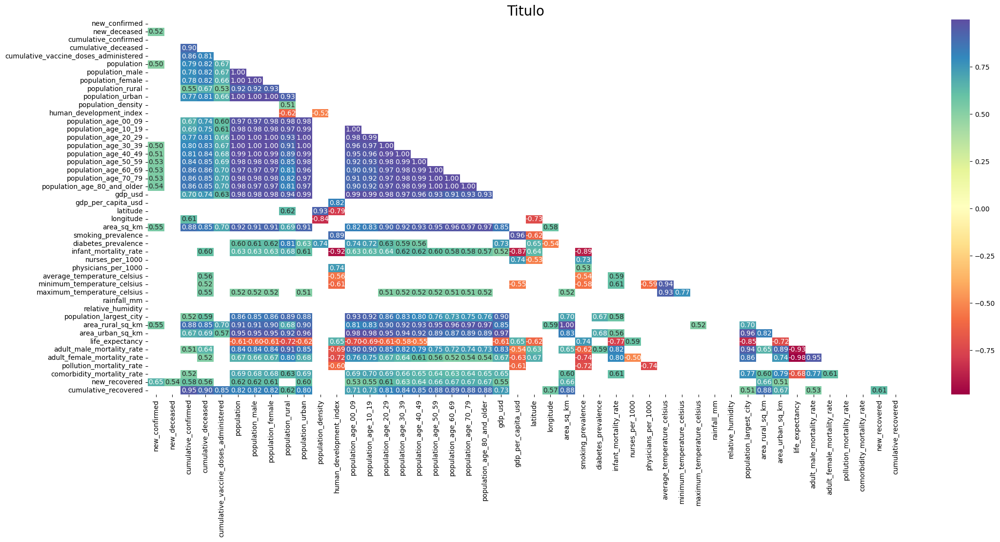

In [ ]:
# Matriz de correlación
numeric_columns = data_lista.select_dtypes(include=['float','int64']).columns
correlacion_matriz = data_lista[numeric_columns].corr()

# mascara para el triangulo superior
mask = np.triu(np.ones_like(correlacion_matriz, dtype=bool))
correlacion_matriz = correlacion_matriz[abs(correlacion_matriz)>abs(0.5)]

# figura grafica
plt.figure(figsize=(25, 10))
heatmap = sns.heatmap(correlacion_matriz, mask=mask, annot= True, cmap='Spectral', fmt='.2f')
plt.title('Titulo',fontsize=20)
plt.show()


Analisis de la matriz:

Relaciones Fuertes Positivas:

- population_female y population_total: La correlación es casi perfecta (1.00), indicando que la población femenina es una gran parte del total de la población.
- population_urban y population_total: Alta correlación (0.99), sugiriendo que a medida que aumenta la población total, también lo hace la población urbana.

Relaciones Fuertes Negativas:

- median_age y birth_rate_per_1000: Fuerte correlación negativa (-0.82), sugiriendo que en países con una mayor edad media, la tasa de natalidad es menor.
- median_age y smoking_rate_male: Correlación negativa (-0.44), indicando que en países con una mayor edad media, la tasa de hombres que fuman es menor.

Correlaciones Interesantes:

- gdp_per_capita y hdi(Human Development Index ): Alta correlación (0.77), sugiriendo que los países con un mayor PIB per cápita tienden a tener un mayor índice de desarrollo humano.
- new_confirmed y new_deaths: Alta correlación (0.82), lo cual es esperado ya que a medida que aumentan los casos confirmados de una enfermedad, también aumentan las muertes relacionadas.
- gdp_per_capita y smoking_rate_female: Correlación positiva (0.68), lo que podría sugerir que en países con un mayor PIB per cápita, las mujeres tienden a fumar más.

Relaciones entre Variables de Salud y Demográficas:

- diabetes_prevalence y cardiovasc_death_rate: Correlación positiva (0.41), sugiriendo una relación entre la prevalencia de diabetes y la tasa de muertes cardiovasculares.
- population_age_65_plus y median_age: Alta correlación (0.86), indicando que una mayor proporción de población mayor de 65 años está asociada con una mayor edad media.

Variables Económicas y Sociales:

- health_exp_pct_gdp y hdi(Human Development Index ): Correlación positiva (0.55), sugiriendo que un mayor gasto en salud como porcentaje del PIB está asociado con un mayor índice de desarrollo humano.
- military_exp_pct_gdp y gdp_per_capita: Correlación negativa (-0.41), lo que sugiere que un mayor gasto militar como porcentaje del PIB puede estar asociado con un menor PIB per cápita.

##### Gráficos de barras de países contra el resto de variables

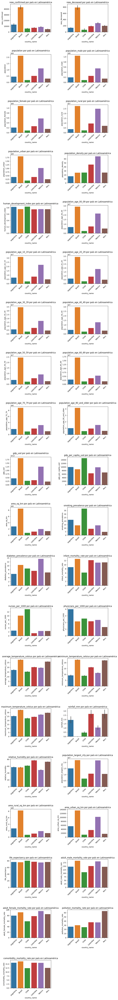

In [ ]:
# se excluyeron algunas columnas que no son relevantes para este tipo de gráficos.
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

# Lista de columnas a excluir
excluir_columnas = [
    'location_key', 'date', 'country_code', 'country_name', 'latitude', 'longitude',
    'cumulative_confirmed', 'cumulative_deceased', 'cumulative_recovered', 
    'cumulative_vaccine_doses_administered', 'new_recovered'
]

# Filtrar las columnas que no están en excluir_columnas
columnas_incluidas = [col for col in data_lista.columns if col not in excluir_columnas]

# Crear una figura
fig = plt.figure(figsize=(10, 5 * ((len(columnas_incluidas) + 1) // 2)))
gs = gridspec.GridSpec((len(columnas_incluidas) + 1) // 2, 2, width_ratios=[1, 1], wspace=0.4, hspace=0.8)

# Iterar sobre las columnas incluidas y los ejes para crear los gráficos
for idx, col in enumerate(columnas_incluidas):
    ax = fig.add_subplot(gs[idx // 2, idx % 2])
    sns.barplot(x='country_name', y=col, data=data_lista, ax=ax, hue='country_name')
    ax.set_title(f'{col} por país en Latinoamérica')
    ax.tick_params(axis='x', rotation=45)

# Ajustar manualmente los márgenes y el espaciado
fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.8)

plt.show()


Análisis de los gráficos:

* Brasil
Casos nuevos confirmados: El más alto de la región. / Nuevas muertes: También el más alto. / Población total: La mayor población en Latinoamérica. / Población urbana: Alta, lo que puede contribuir a la propagación del virus. / Índice de Desarrollo Humano (HDI): Moderado, lo que puede influir en la capacidad de respuesta al COVID-19.

* México
Casos nuevos confirmados: Segundo más alto./ 
Nuevas muertes: Segundo más alto. / 
Población total: Segunda mayor en la región. / 
Población urbana y rural: Alta población rural y urbana, influenciando la dinámica de transmisión. / 
Densidad de Población: Alta, contribuyendo a la propagación. / 
Índice de Desarrollo Humano (HDI): Moderado.
* Argentina
Casos nuevos confirmados: Relativamente bajos. / 
Nuevas muertes: Relativamente bajas. / 
Población total: Menor que Brasil y México. / 
Población urbana: Menor, lo que puede influir en una menor propagación. / 
Índice de Desarrollo Humano (HDI): Alto, lo que puede mejorar la capacidad de respuesta.
* Colombia
Casos nuevos confirmados: Relativamente bajos. / 
Nuevas muertes: Relativamente bajas. / 
Población total: Moderada. / 
Densidad de Población: Alta, influenciando la propagación. / 
Índice de Desarrollo Humano (HDI): Moderado.
* Chile
Casos nuevos confirmados: Relativamente bajos. / 
Nuevas muertes: Relativamente bajas. / 
Población total: Relativamente baja. / 
Población urbana: Menor, influenciando una menor propagación. / 
Índice de Desarrollo Humano (HDI): Alto, lo que puede mejorar la capacidad de respuesta.
* Perú
Casos nuevos confirmados: Relativamente bajos. / 
Nuevas muertes: Relativamente bajas. / 
Población total: Relativamente baja. / 
Población urbana y rural: Relativamente baja. / 
Densidad de Población: Moderada. / 
Índice de Desarrollo Humano (HDI): Moderado.
* Resumen General:
Brasil y México son los países más afectados en términos de casos nuevos y muertes, lo cual está relacionado con sus grandes poblaciones y altas densidades urbanas.
Argentina y Chile presentan menos casos y muertes, lo que puede estar influenciado por sus menores poblaciones urbanas y altos índices de desarrollo humano.
Colombia y Perú tienen una situación intermedia, con moderada densidad de población y desarrollo humano, lo que puede afectar tanto la propagación como la respuesta al COVID-19.


In [ ]:
# Listo las columnas que gratifiqué para el analisis...
import pandas as pd

# Suponiendo que tienes un DataFrame llamado data_lista y una lista de columnas a excluir llamada excluir_columnas
excluir_columnas = [
    'location_key', 'date', 'country_code', 'country_name', 'latitude', 'longitude',
    'cumulative_confirmed', 'cumulative_deceased', 'cumulative_recovered', 
    'cumulative_vaccine_doses_administered', 'new_recovered'
]

# Lista las columnas excluyendo las que se encuentran en excluir_columnas
columnas_restantes = [col for col in data_lista.columns if col not in excluir_columnas]

# Muestra las columnas restantes
print(columnas_restantes)


['new_confirmed', 'new_deceased', 'population', 'population_male', 'population_female', 'population_rural', 'population_urban', 'population_density', 'human_development_index', 'population_age_00_09', 'population_age_10_19', 'population_age_20_29', 'population_age_30_39', 'population_age_40_49', 'population_age_50_59', 'population_age_60_69', 'population_age_70_79', 'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd', 'area_sq_km', 'smoking_prevalence', 'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000', 'physicians_per_1000', 'average_temperature_celsius', 'minimum_temperature_celsius', 'maximum_temperature_celsius', 'rainfall_mm', 'relative_humidity', 'population_largest_city', 'area_rural_sq_km', 'area_urban_sq_km', 'life_expectancy', 'adult_male_mortality_rate', 'adult_female_mortality_rate', 'pollution_mortality_rate', 'comorbidity_mortality_rate']


##### Histogramas de las variables que “Sí” tenga cambios de valores.

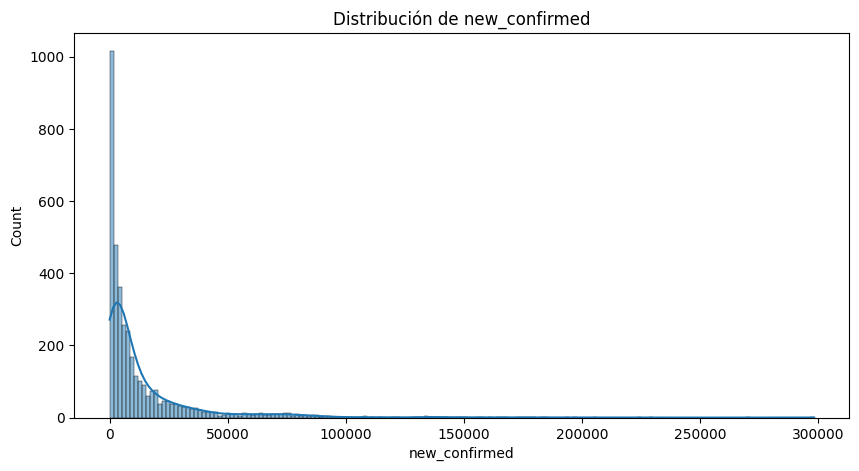

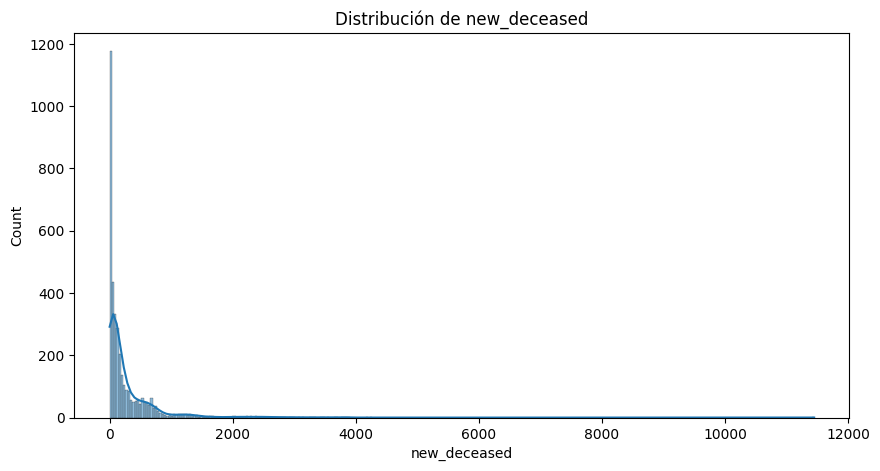

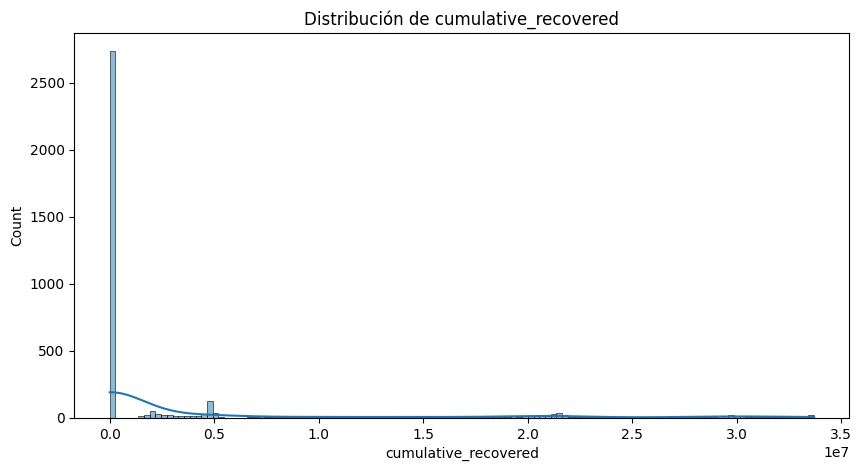

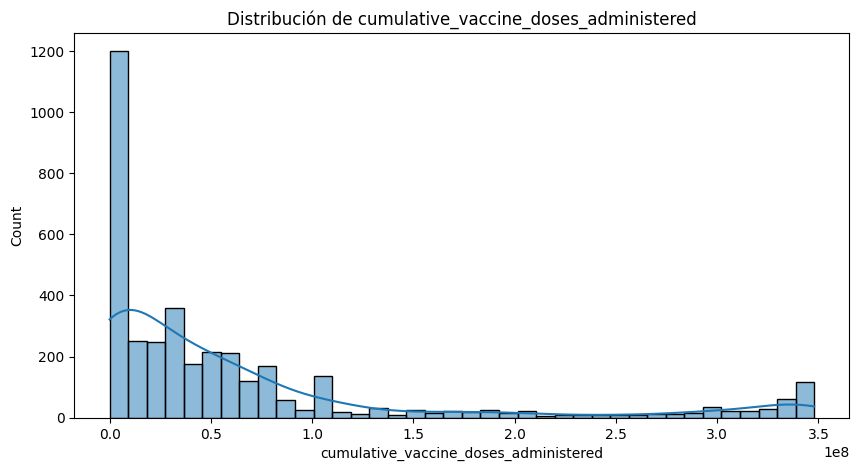

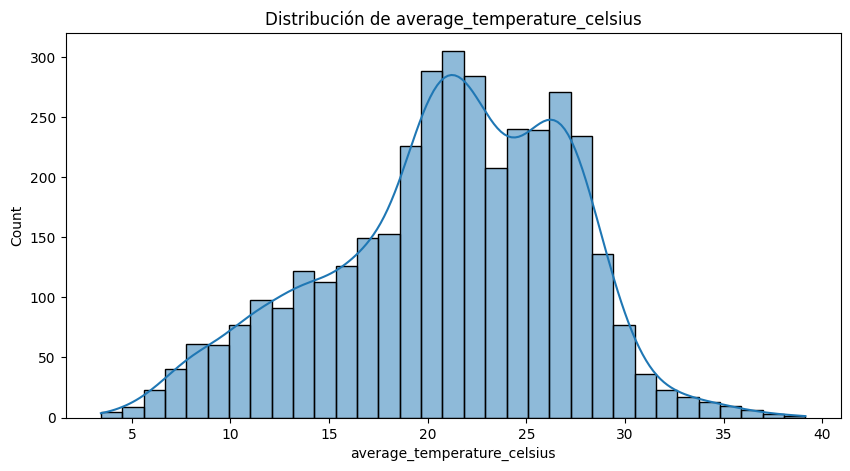

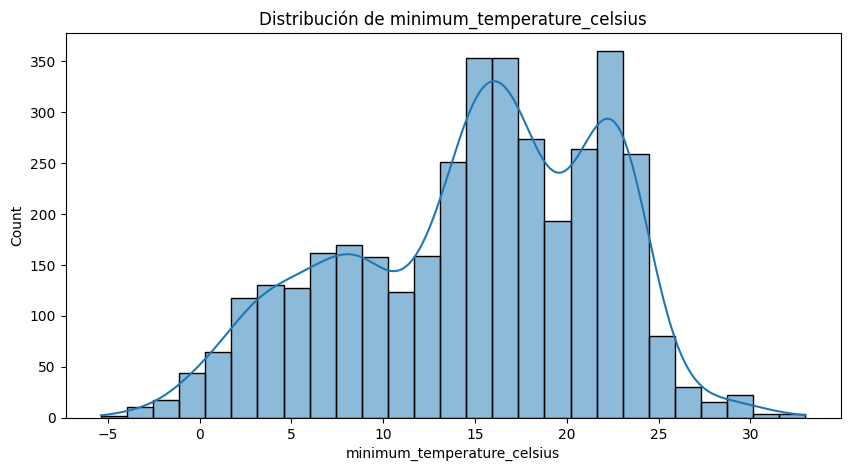

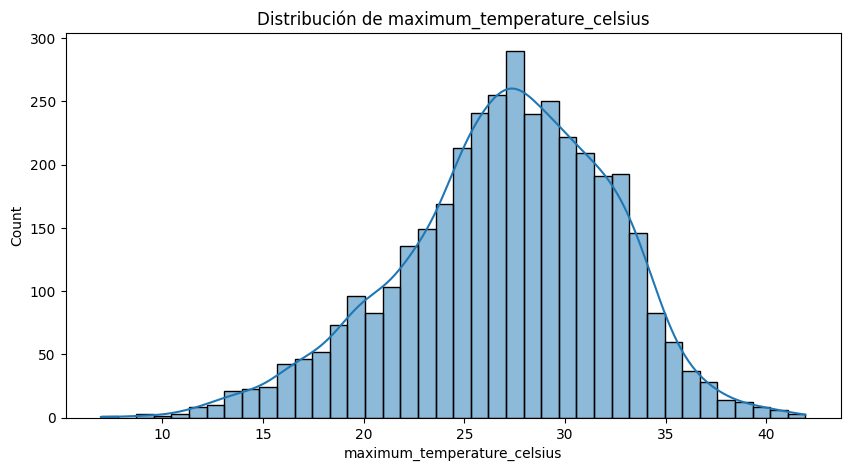

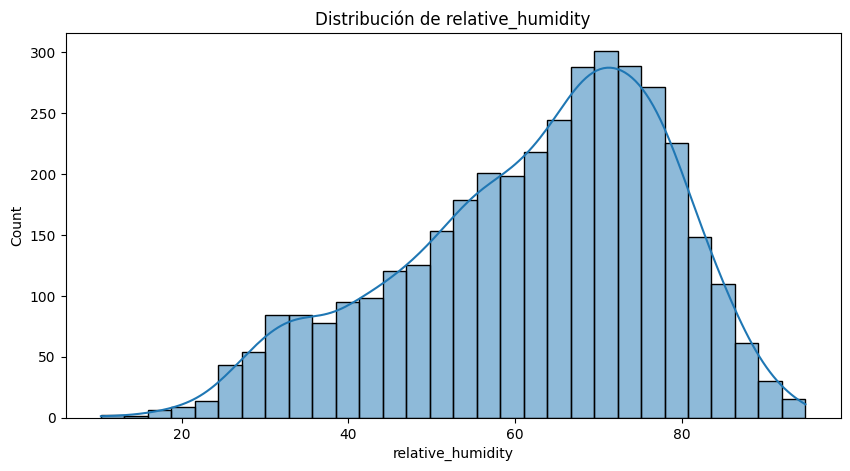

In [ ]:
# Histogramas de las variables que “Sí” tenga cambios de valores.
# Lista de columnas a graficar
lista_columnas_6 = [
    'new_confirmed', 'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
    'cumulative_recovered', 'cumulative_vaccine_doses_administered',
    'average_temperature_celsius', 'minimum_temperature_celsius', 
    'maximum_temperature_celsius', 'relative_humidity'
]

# Crear histogramas de las variables en lista_columnas_6
for i in lista_columnas_6:
    if i not in ['location_key', 'date', 'country_code', 'country_name', 'latitude', 'longitude', 'cumulative_confirmed', 'cumulative_deceased']:
        fig, ax = plt.subplots(figsize=(10, 5))
        sns.histplot(data_lista[i], ax=ax, kde=True)
        plt.title(f'Distribución de {i}')
        plt.show()


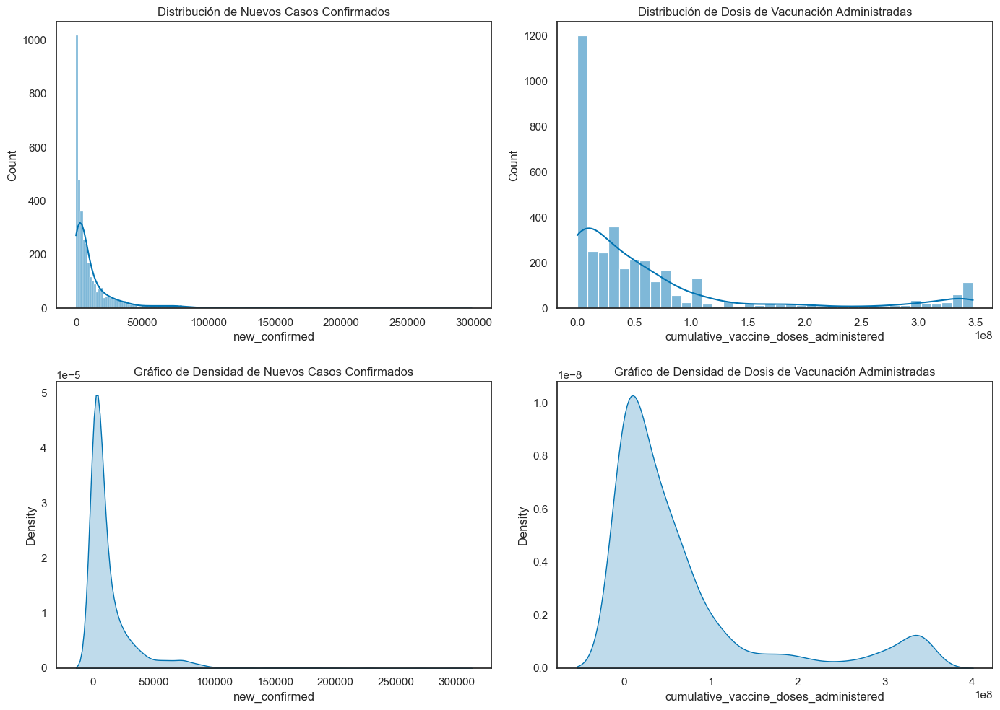

In [ ]:
# Histogramas y gráficos de densidad
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración de estilo de Seaborn - whitegrid - darkgrid - white - dark - ticks
# sns.set_theme(style="darkgrid")
# deep muted bright pastel dark colorblind 
sns.set_theme(style="white", palette="colorblind")


# Histogramas y gráficos de densidad
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

sns.histplot(data_lista['new_confirmed'], kde=True, ax=ax[0, 0])
ax[0, 0].set_title('Distribución de Nuevos Casos Confirmados')

sns.histplot(data_lista['cumulative_vaccine_doses_administered'], kde=True, ax=ax[0, 1])
ax[0, 1].set_title('Distribución de Dosis de Vacunación Administradas')

sns.kdeplot(data_lista['new_confirmed'], ax=ax[1, 0], fill=True)
ax[1, 0].set_title('Gráfico de Densidad de Nuevos Casos Confirmados')

sns.kdeplot(data_lista['cumulative_vaccine_doses_administered'], ax=ax[1, 1], fill=True)
ax[1, 1].set_title('Gráfico de Densidad de Dosis de Vacunación Administradas')

plt.tight_layout()
plt.show()




##### Analizo con el siguiente gráfico como las temperaturas pueden influir en los casos confirmados y  en los fallecimientos

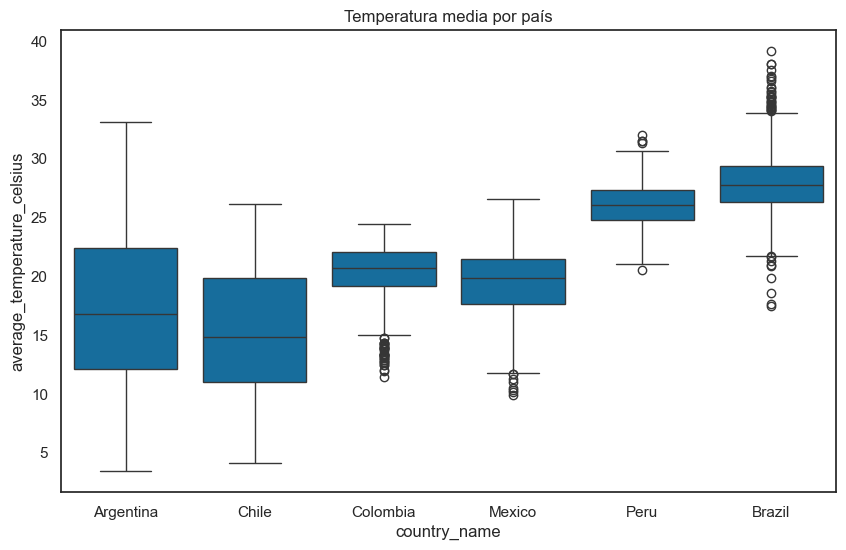

In [ ]:
# Temperatura media por país -- OK
fig, ax = plt.subplots(figsize=(10, 6))

for pais in paises_seleccionados:
    sns.boxplot(x='country_name', y='average_temperature_celsius', data=data_lista[data_lista['country_name'] == pais], hue='country_name')

plt.title('Temperatura media por país')
plt.show()


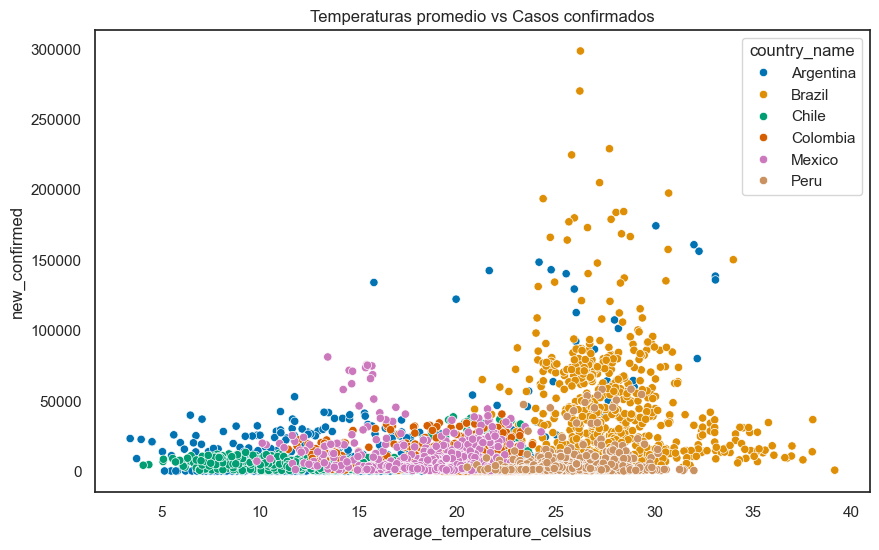

In [ ]:
# Diagrama de dispersión de la temperatura media contra los Casos confirmadas.
# Importar las bibliotecas necesarias
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el tamaño de la figura para la gráfica
fig, ax = plt.subplots(figsize=(10, 6))

# Crear un gráfico de dispersión (scatter plot)
# Usamos average_temperature_celsius en el eje X y new_confirmed en el eje Y
# Hue se usa para diferenciar por el nombre del país
sns.scatterplot(x='average_temperature_celsius', y='new_confirmed', 
                data=data_lista, hue='country_name')

# Añadir un título al gráfico
plt.title('Temperaturas promedio vs Casos confirmados')

# Mostrar el gráfico
plt.show()


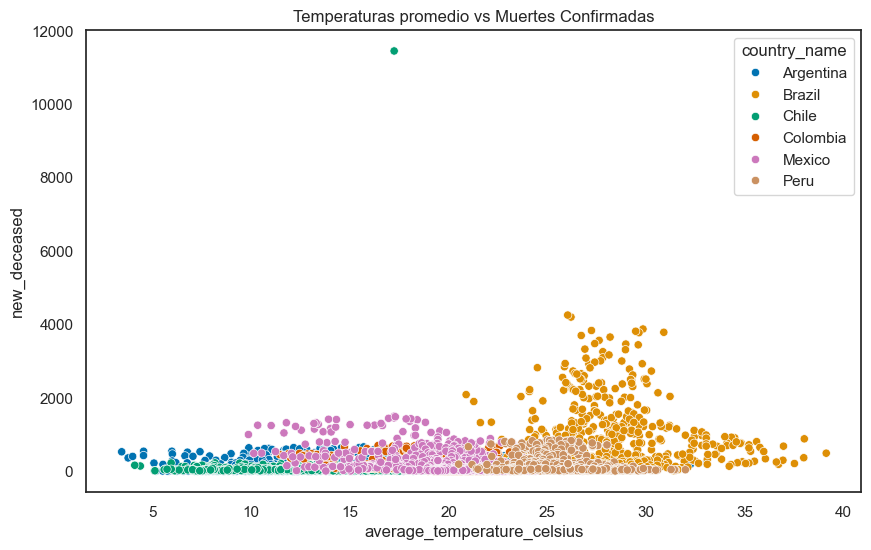

In [ ]:
# Diagrama de dispersión de la temperatura media contra las muertes confirmadas.
# Importar las bibliotecas necesarias
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el tamaño de la figura para la gráfica
fig, ax = plt.subplots(figsize=(10, 6))

# Crear un gráfico de dispersión (scatter plot)
# Usamos average_temperature_celsius en el eje X y new_confirmed en el eje Y
# Hue se usa para diferenciar por el nombre del país
sns.scatterplot(x='average_temperature_celsius', y='new_deceased', 
                data=data_lista, hue='country_name')

# Añadir un título al gráfico
plt.title('Temperaturas promedio vs Muertes Confirmadas')

# Mostrar el gráfico
plt.show()

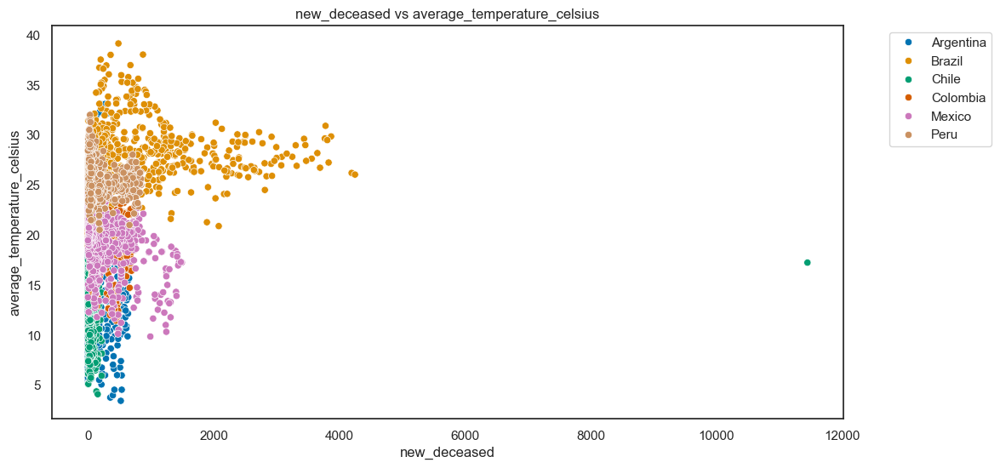

In [ ]:
# igual que arriba pero otra forma de verlo
# Configurar el tamaño de la figura para la gráfica
fig, ax = plt.subplots(figsize=(12, 6))

# Crear un gráfico de dispersión (scatter plot)
# Usamos new_deceased en el eje X y average_temperature_celsius en el eje Y
# Hue se usa para diferenciar por el nombre del país
sns.scatterplot(x='new_deceased', y='average_temperature_celsius', 
                data=data_lista, hue='country_name')

# Añadir un título al gráfico
plt.title('new_deceased vs average_temperature_celsius')

# Añadir la leyenda
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.show()

Insights Clave:
Concentración de Datos por País:
* Brasil (naranja) parece tener una alta concentración de casos confirmados a lo largo de todo el rango de temperaturas, con un notable pico en el rango de 20°C a 30°C.
* Argentina (azul) y Chile (rosa) muestran una mayor dispersión en el número de casos confirmados, con menores valores en comparación con Brasil.
* México (verde) muestra un número significativo de casos confirmados en temperaturas más altas (20°C a 35°C).
* Colombia muestra una distribución de casos confirmados bastante amplia en el rango de temperaturas de aproximadamente 15°C a 30°C, con un pico entre los 20°C a 25°C.
* Peru (Marrón claro) los datos están concentrados principalmente en el rango de temperaturas de 15°C a 25°C.

Relación Temperatura-Casos Confirmados:
* No parece haber una relación directa y simple entre la temperatura promedio y el número de casos confirmados. 

Pico de Casos:
* El gráfico muestra un pico notable de casos confirmados en el rango de 25°C a 30°C. Esto podría sugerir que en estas temperaturas, la transmisión del virus fue más eficiente o las condiciones fueron más propicias para la propagación.

Variabilidad:
* La gran variabilidad de casos confirmados en diferentes rangos de temperatura sugiere que otros factores, además de la temperatura, juegan un papel significativo en la propagación del virus. Esto puede incluir factores como la densidad de población, medidas de salud pública, comportamiento social, etc.

Conclusión:
* El gráfico sugiere que mientras la temperatura puede tener algún efecto en la propagación de los casos confirmados de COVID-19, no es el único factor determinante. Brasil destaca con un número desproporcionadamente alto de casos en comparación con otros países, lo que indica que factores adicionales, como las políticas de salud pública y el cumplimiento de las medidas preventivas, son cruciales para entender la variabilidad en los casos confirmados.
* Voy a realizar, en el siguiente análisis, un análisis multivariable que incluya otros factores como la densidad de población, las medidas de cuarentena, la capacidad hospitalaria, y el cumplimiento de las medidas de salud pública para obtener un panorama más completo.

##### Comportamiento de las dosis administradas de todos los países (Valor medio).

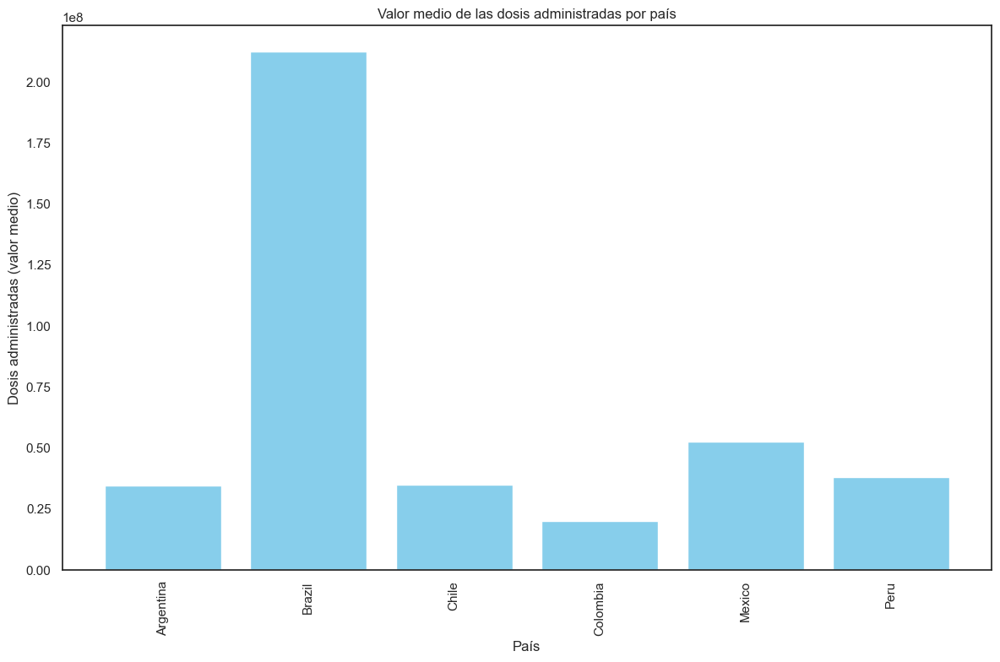

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calcula el valor medio de las dosis administradas por país
mean_doses_by_country = data_lista.groupby('country_name')['cumulative_vaccine_doses_administered'].mean().reset_index()

# Crea el gráfico de barras
plt.figure(figsize=(12, 8))
plt.bar(mean_doses_by_country['country_name'], mean_doses_by_country['cumulative_vaccine_doses_administered'], color='skyblue')
plt.xlabel('País')
plt.ylabel('Dosis administradas (valor medio)')
plt.title('Valor medio de las dosis administradas por país')
plt.xticks(rotation=90)  # Rotamos los nombres de los países para mejor visualización
plt.tight_layout()
plt.show()


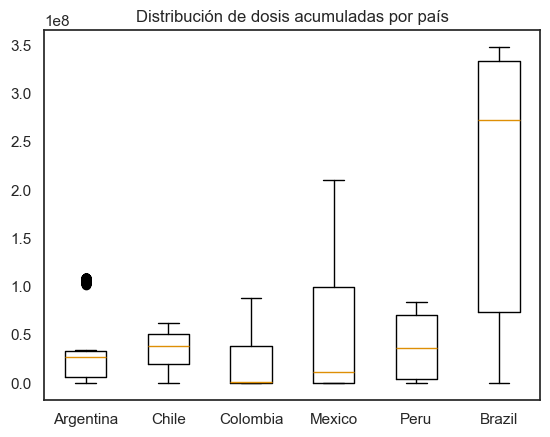

In [ ]:
# Distribución de dosis acumuladas por país -- OK
data_box = [data_lista[data_lista['country_name'] == pais]['cumulative_vaccine_doses_administered'] for pais in paises_seleccionados]
plt.boxplot(data_box, tick_labels=paises_seleccionados)

plt.title('Distribución de dosis acumuladas por país')
plt.show()


##### Evolución de dosis administradas por mes de cada país.

El gráfico muestra una tendencia ascendente en la cantidad acumulada de dosis de vacunas administradas desde enero de 2021 hasta febrero de 2022. Esto indica un esfuerzo continuo de vacunación en los países seleccionados.

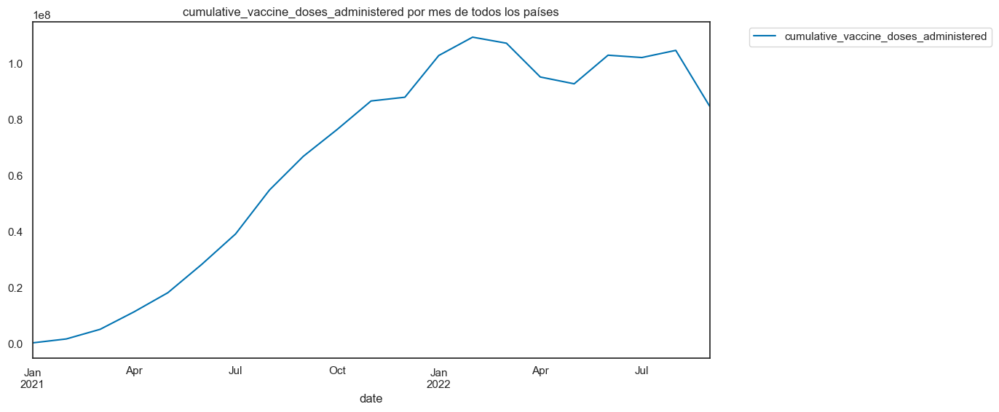

In [ ]:

# Configurar el tamaño de la figura para la gráfica
fig, ax = plt.subplots(figsize=(12, 6))

# Calcular el promedio mensual de las dosis de vacunas administradas acumuladas
data_lista.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(ax=ax)

# Añadir título y leyenda al gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('cumulative_vaccine_doses_administered por mes de todos los países')

# Mostrar el gráfico
plt.show()


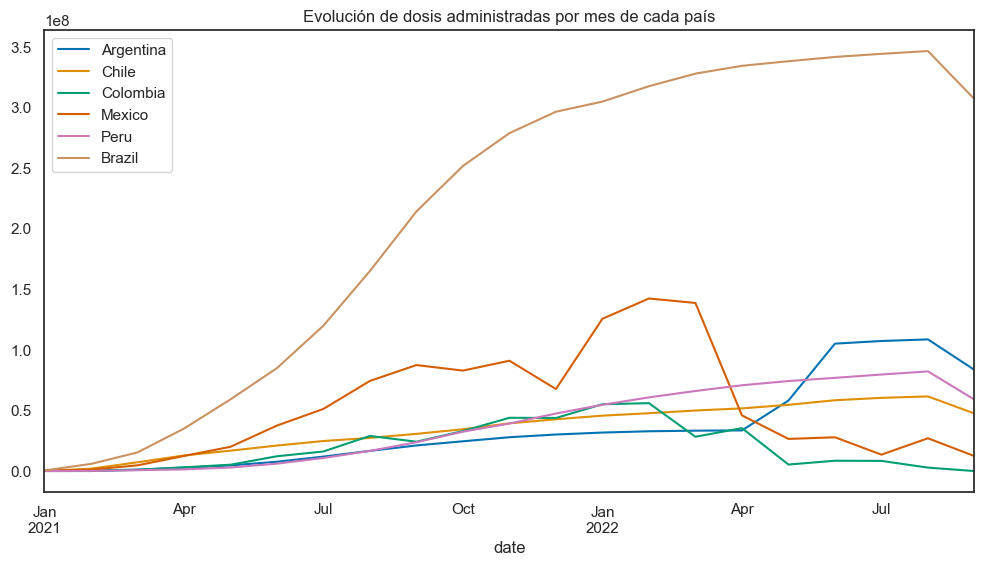

In [ ]:
# Evolución de dosis administradas por mes de cada país
# Configurar el tamaño de la figura para la gráfica
fig, ax = plt.subplots(figsize=(12, 6))
for pais in paises_seleccionados:
    data_lista[data_lista["country_name"]==pais].resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(ax=ax)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(paises_seleccionados)
plt.title('Evolución de dosis administradas por mes de cada país')

# Mostrar el gráfico
plt.show()

##### Casos confirmados y muertes por mes de cada país.

Casos Confirmados por mes de cada país:

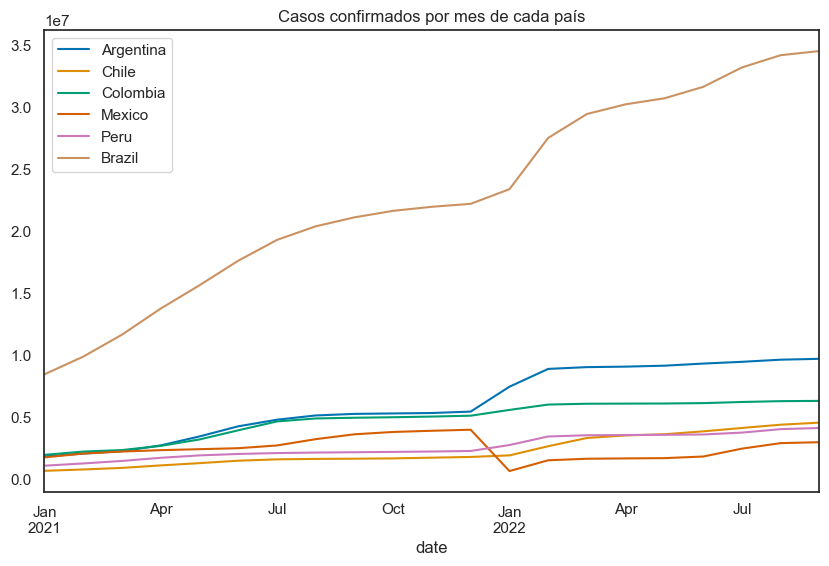

In [ ]:
# Casos confirmados por mes de cada país
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

for pais in paises_seleccionados:
    data_lista[data_lista['country_name'] == pais].resample('ME').mean(numeric_only=True)['cumulative_confirmed'].plot()

plt.title('Casos confirmados por mes de cada país')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()


Muertes por mes de cada país:

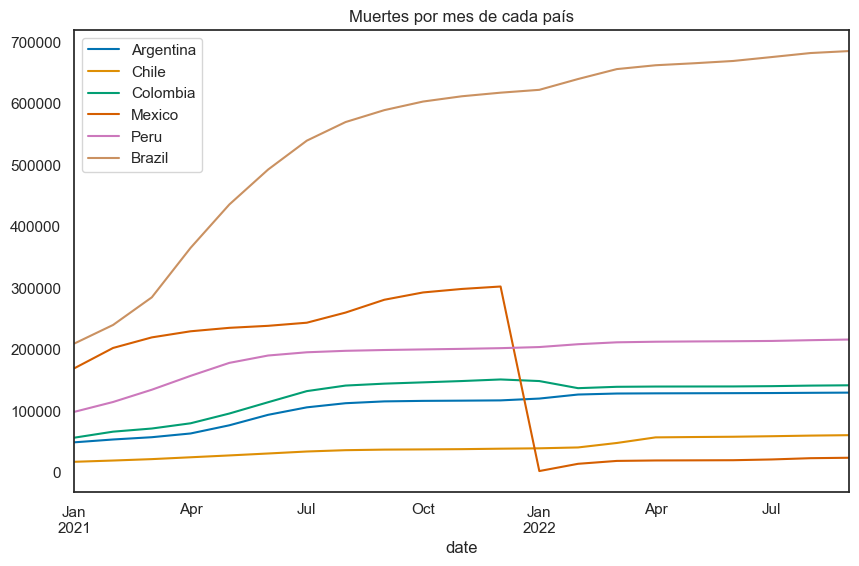

In [ ]:
# Muertes por mes de cada país
fig, ax = plt.subplots(figsize=(10, 6))

for pais in paises_seleccionados:
    data_lista[data_lista['country_name'] == pais].resample('ME').mean(numeric_only=True)['cumulative_deceased'].plot()

plt.title('Muertes por mes de cada país')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()

##### comportamiento de las Variables por país  

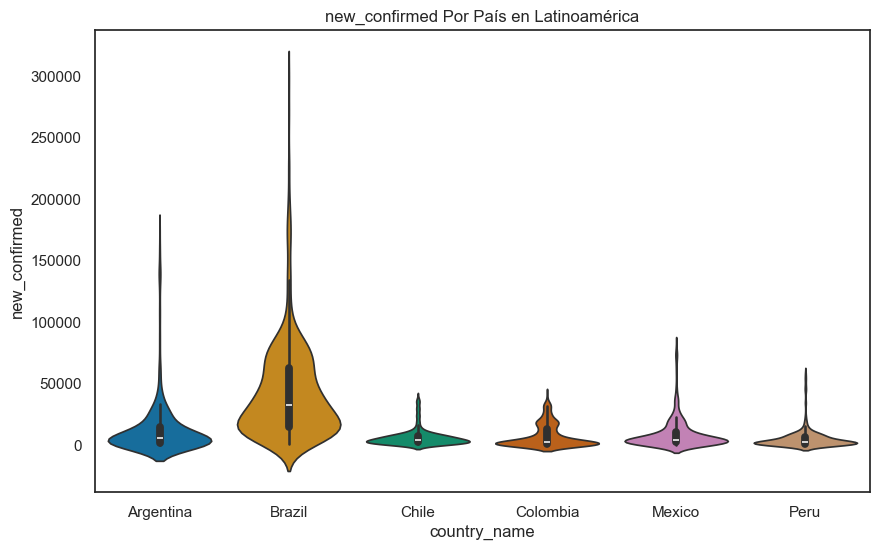

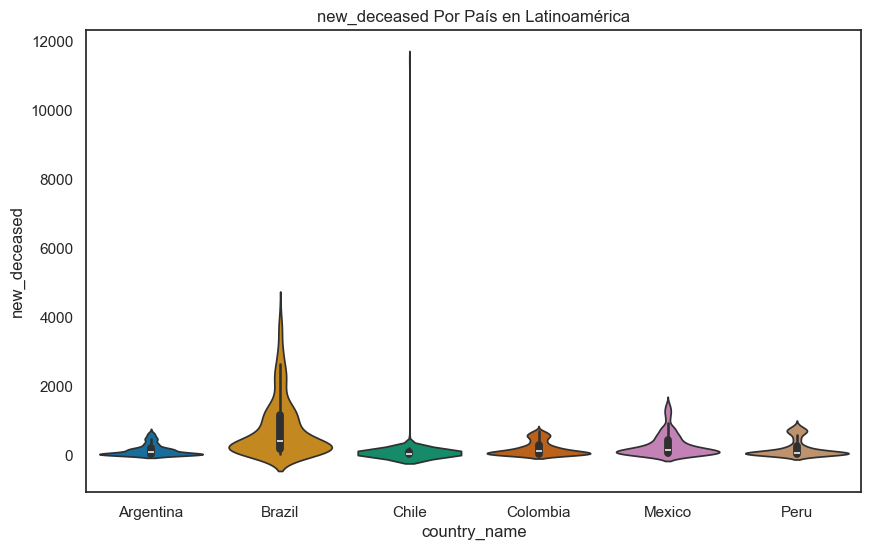

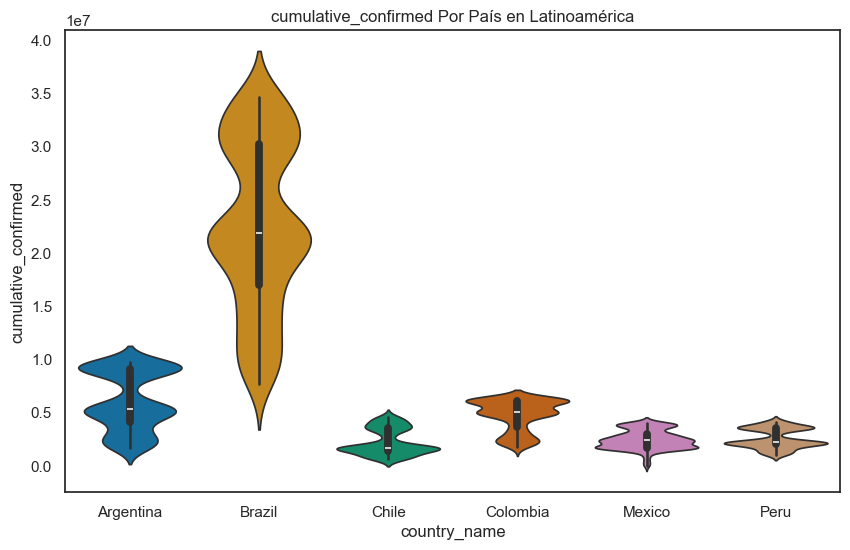

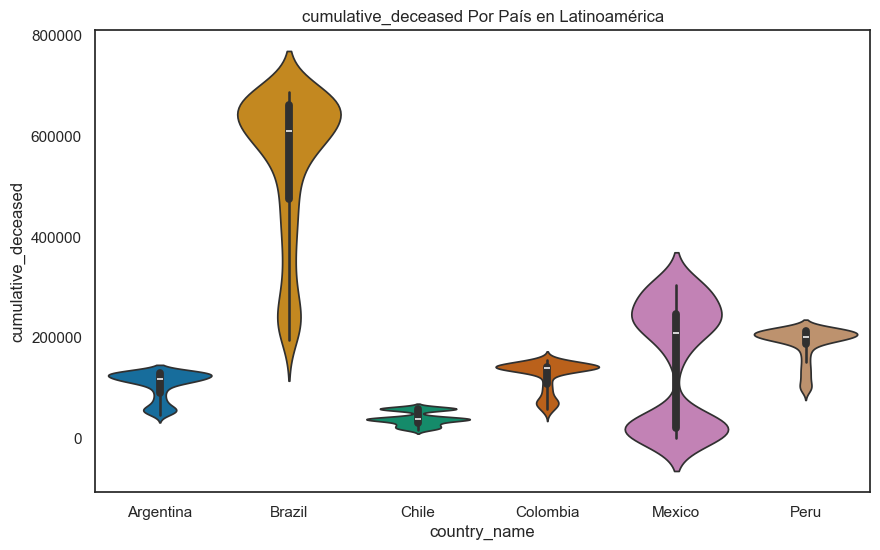

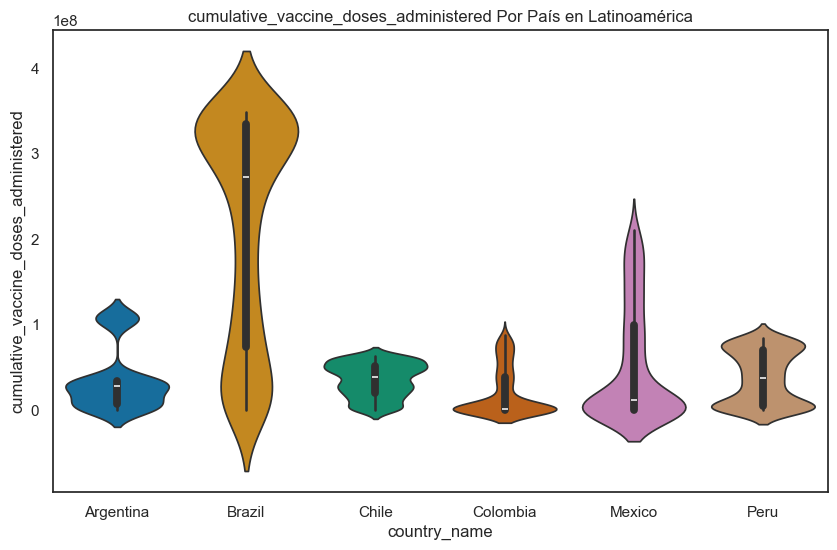

...

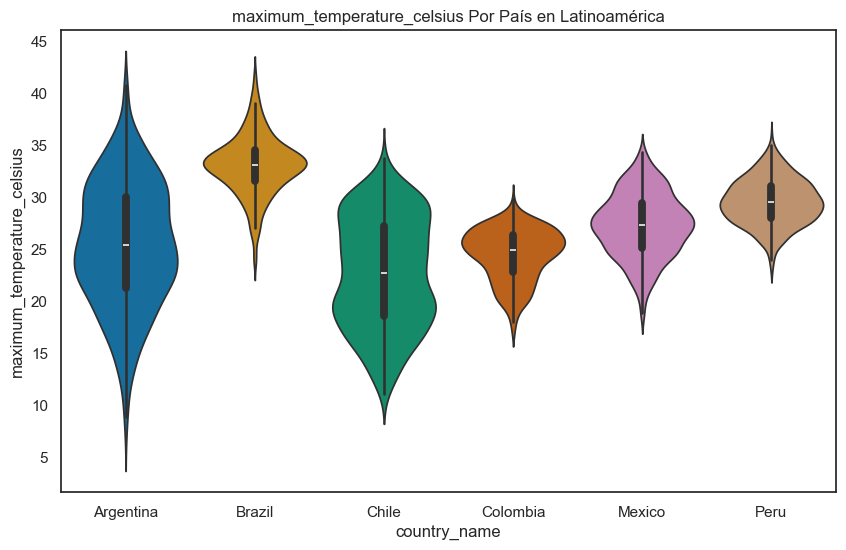

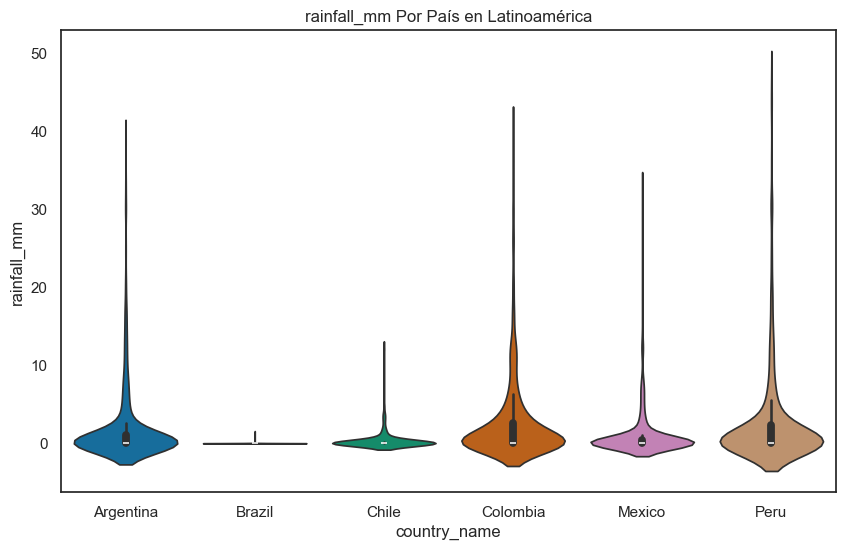

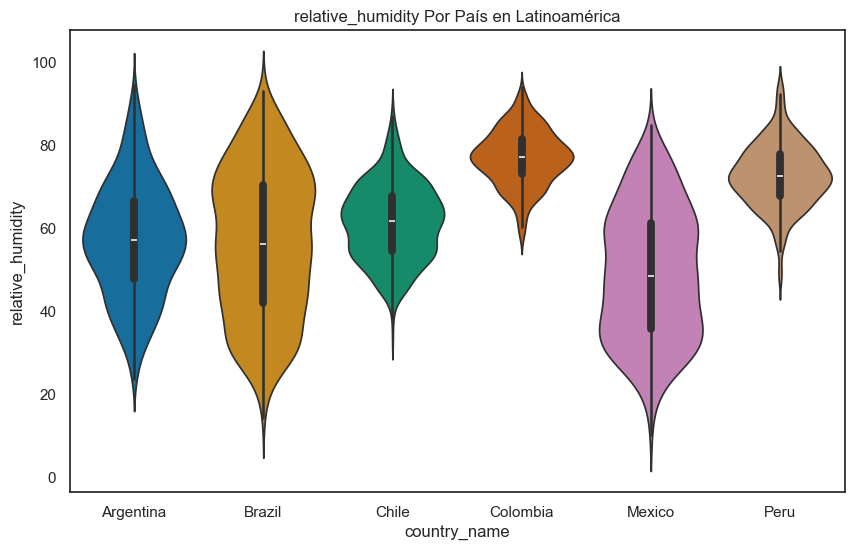

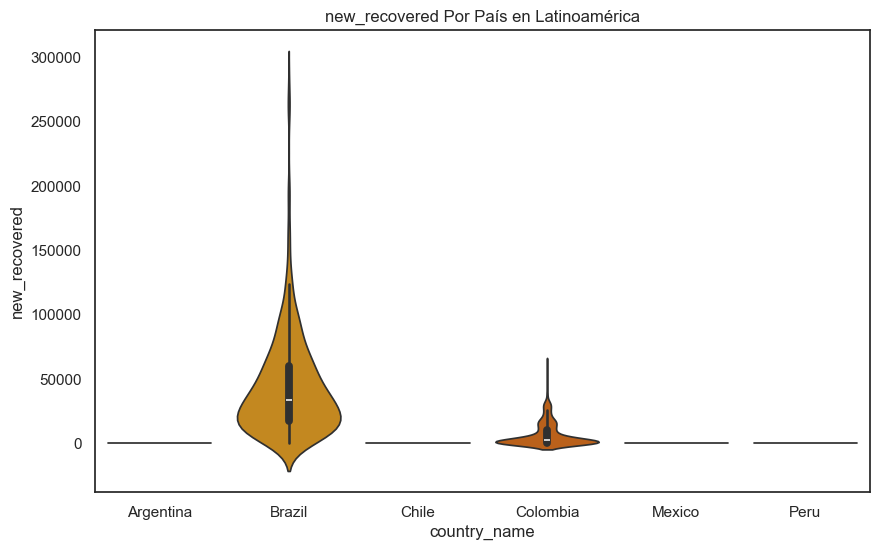

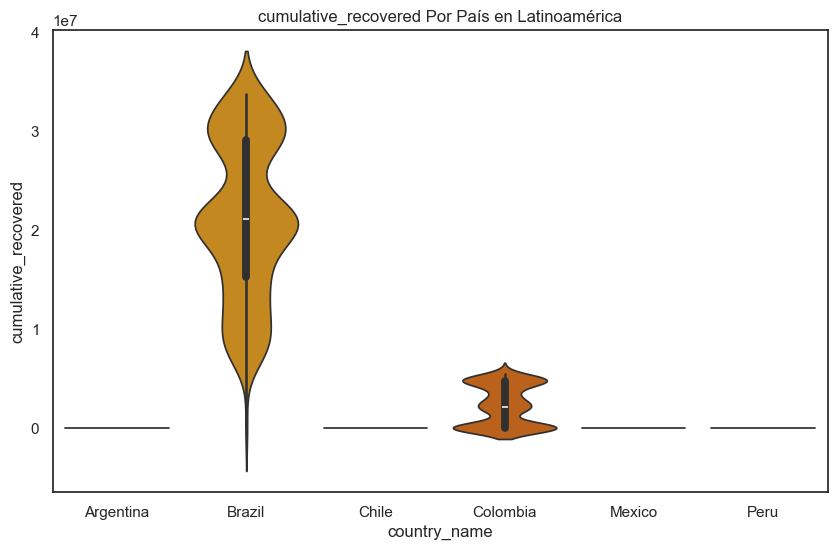

In [ ]:
# Gráficos de violín - # Variables Por País en Latinoamérica - OK
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Crear un dataframe con las columnas que tienen más de 6 valores únicos
columnas_mayores_6 = []

for i in data_lista.columns:
    if i not in ['location_key', 'country_code', 'latitude', 'longitude']:
        if data_lista[i].nunique() > 6 and i != 'date':  # Excluir 'date'
            columnas_mayores_6.append(i)
columnas_mayores_6.append('country_name')

data_lista_mayores_6 = data_lista[columnas_mayores_6]

# Graficar los datos usando violin plots
for i in data_lista_mayores_6.columns:
    if i not in ['location_key', 'country_code', 'latitude', 'longitude', 'country_name', 'date']:  # Excluir 'date'
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.violinplot(x='country_name', y=i, data=data_lista_mayores_6, hue='country_name')
        plt.title(f'{i} Por País en Latinoamérica')
        plt.show()


##### Gráficos para mostrar mi breve análisis estadístico realizado en el avance 1

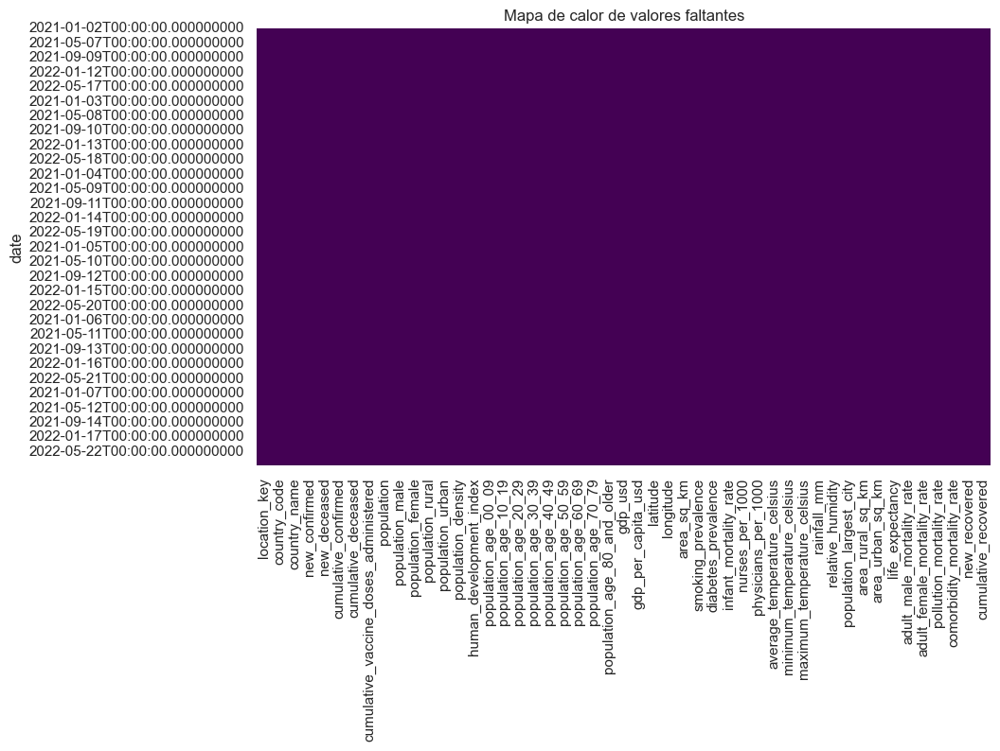

In [ ]:
# Verifico si tengo valores faltantes
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Asegúrate de que el DataFrame `data_lista` está cargado correctamente
# data_lista = pd.read_csv('tu_archivo.csv')

# 1. Mapa de calor para valores faltantes
plt.figure(figsize=(10, 6))
sns.heatmap(data_lista.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de calor de valores faltantes')
plt.show()




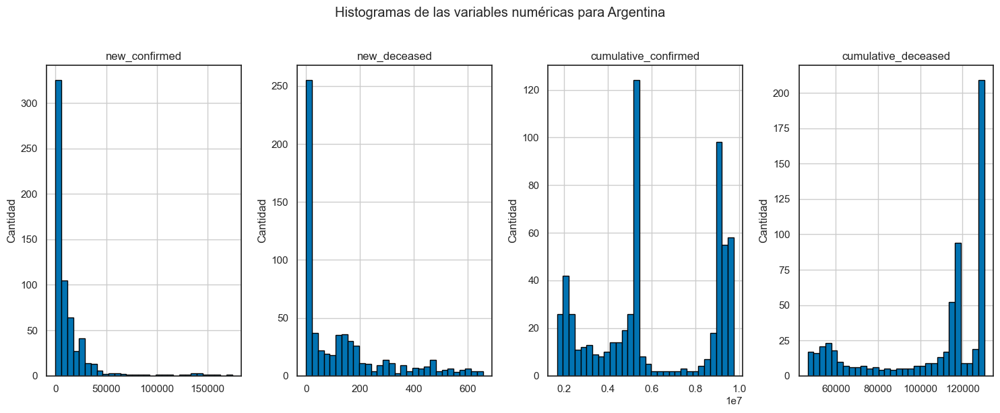

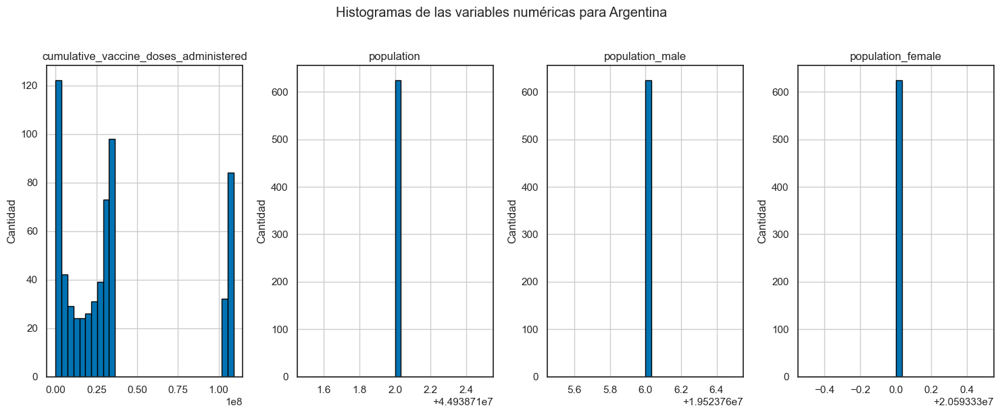

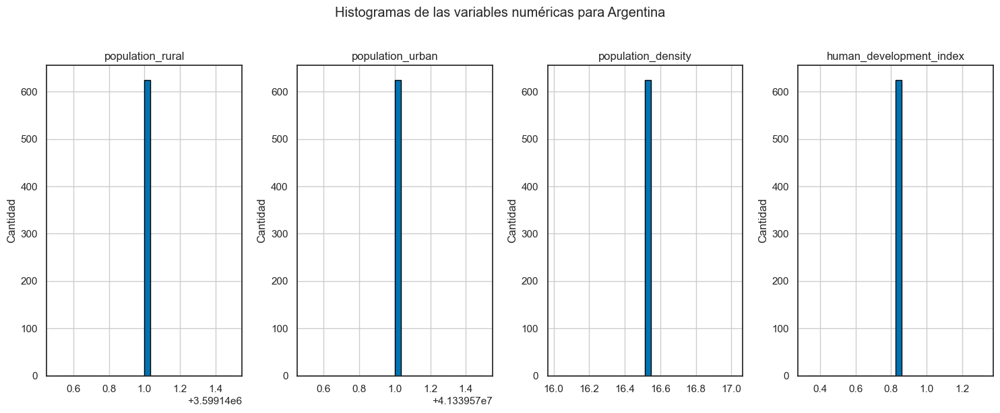

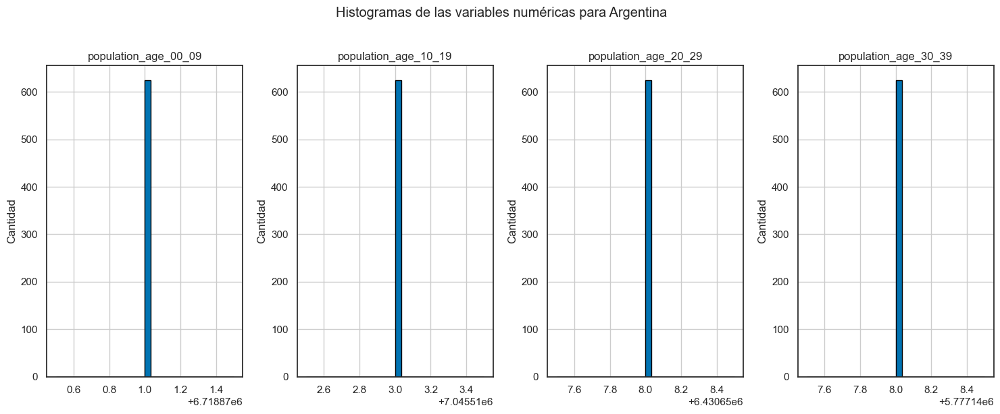

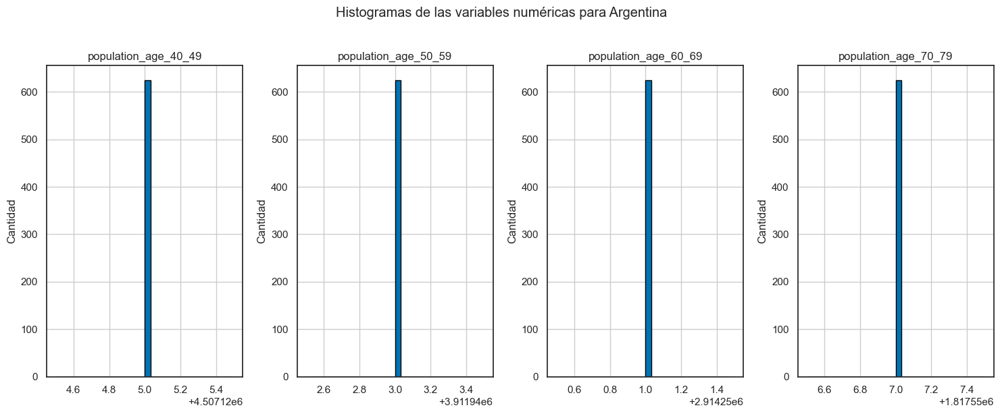

...

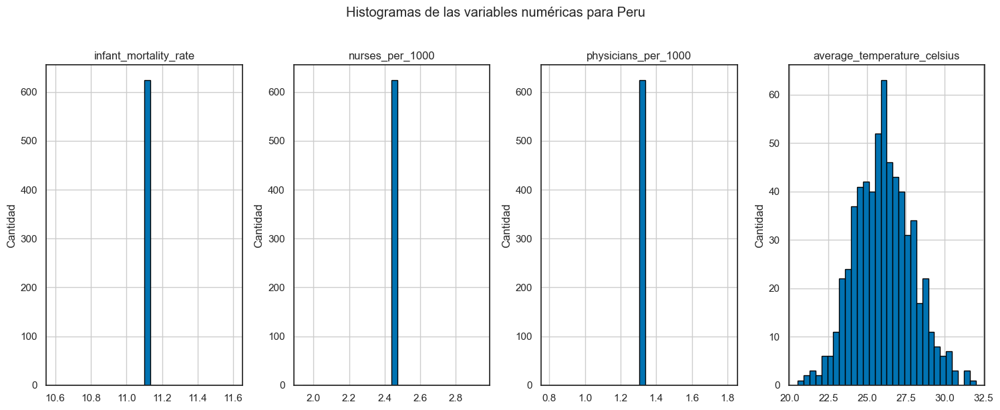

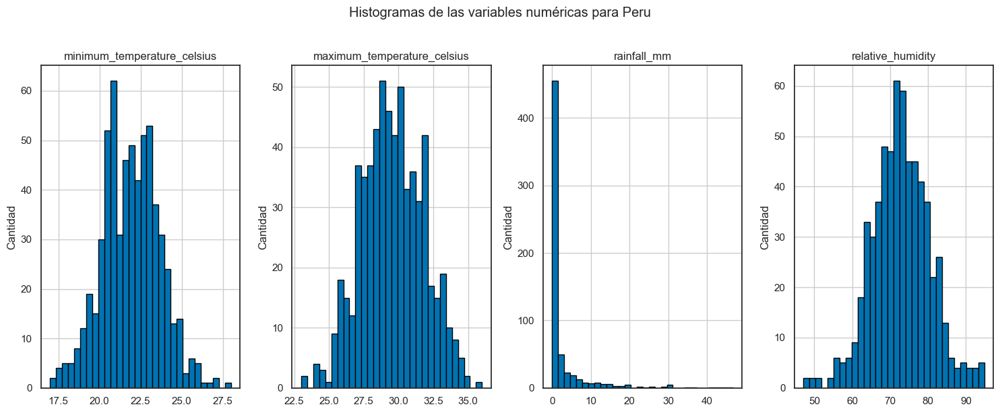

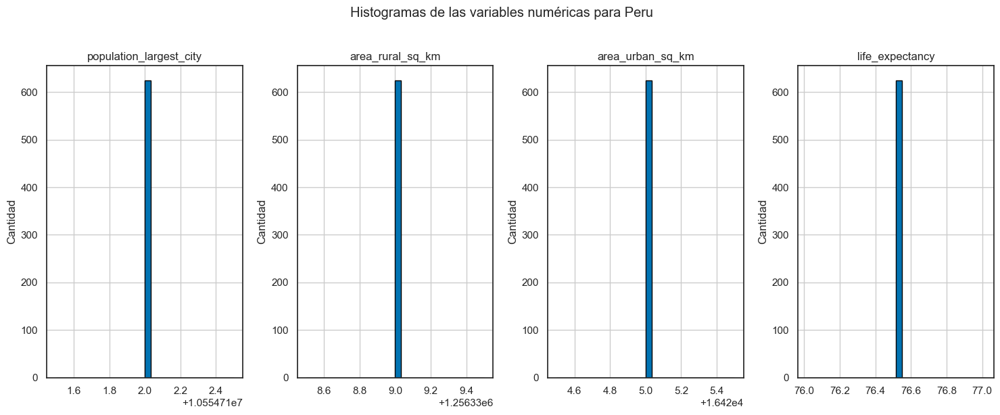

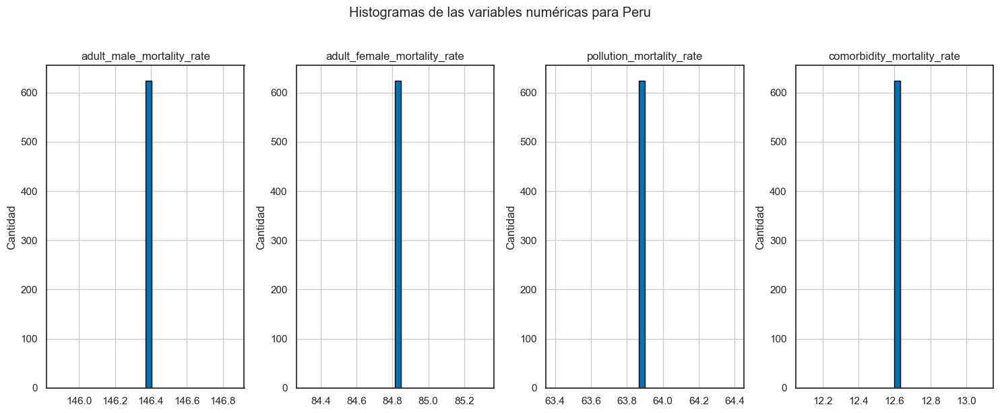

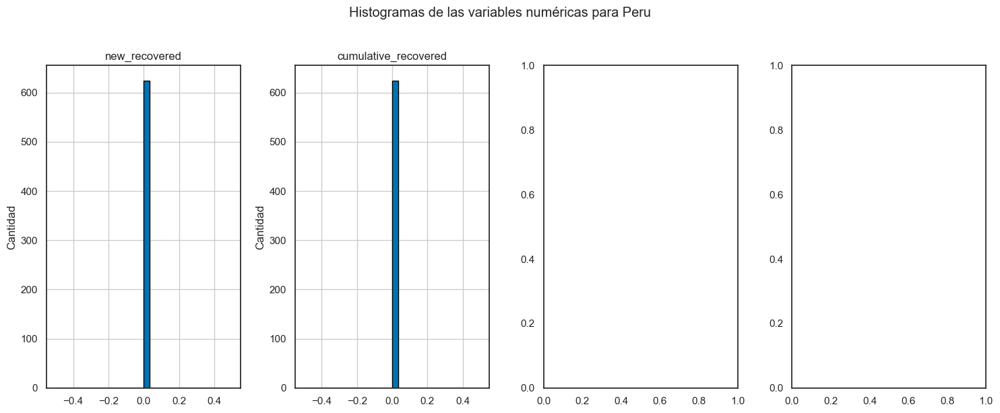

In [ ]:
# 2. Histogramas para distribución de valores - por país
import matplotlib.pyplot as plt
import numpy as np

# Restablecer el índice para que 'country_name' sea una columna
data_lista_reset = data_lista.reset_index()

# Calcular cuántos gráficos se necesitan y la cantidad de filas
num_per_plot = 4

# Obtener la lista de países únicos
paises = data_lista_reset['country_name'].unique()

for pais in paises:
    # Filtrar por país
    df_pais = data_lista_reset[data_lista_reset['country_name'] == pais]
    numeric_columns = df_pais.select_dtypes(include=['number']).columns

    # Calcular cuántos gráficos se necesitan y la cantidad de filas
    num_plots = len(numeric_columns)
    num_rows = (num_plots + num_per_plot - 1) // num_per_plot

    # Iterar sobre las columnas y crear subplots
    for i, column in enumerate(numeric_columns):
        if i % num_per_plot == 0:
            fig, axes = plt.subplots(nrows=1, ncols=num_per_plot, figsize=(15, 6))
            fig.suptitle(f'Histogramas de las variables numéricas para {pais}', y=1.02)
        col = i % num_per_plot
        df_pais[column].hist(bins=30, edgecolor='black', ax=axes[col])
        axes[col].set_title(f'{column}')
        axes[col].set_xlabel('')
        axes[col].set_ylabel('Cantidad')
        if i == num_plots - 1 or i % num_per_plot == num_per_plot - 1:
            plt.tight_layout()
            plt.show()



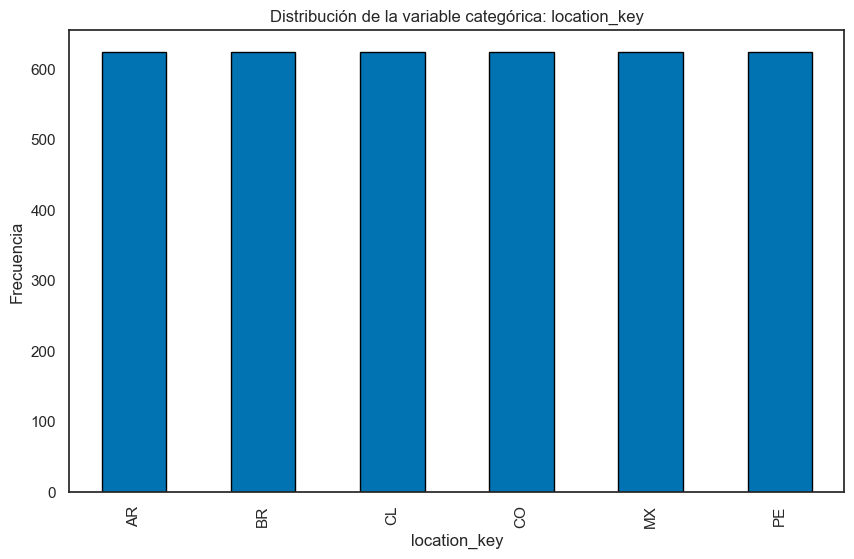

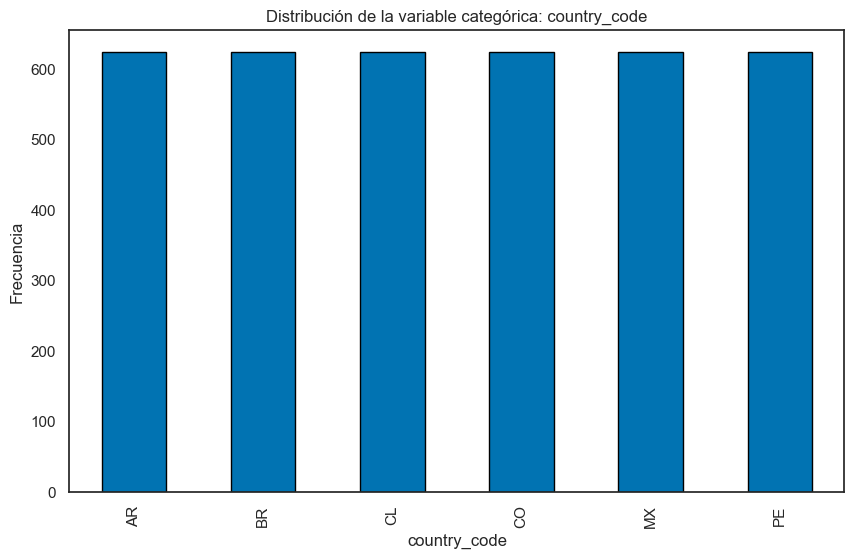

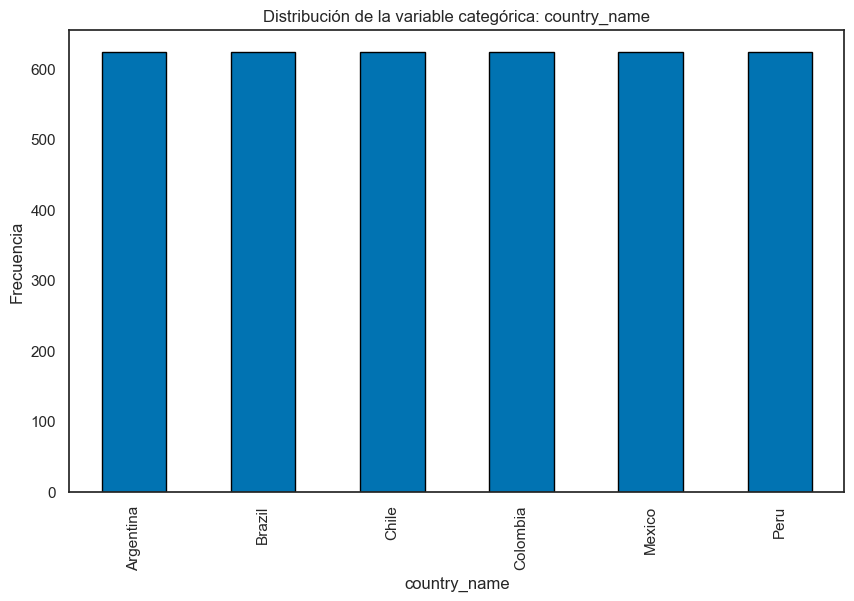

In [ ]:
# 3. Gráfico de barras para variables categóricas
for column in data_lista.select_dtypes(include=['object']).columns:
    if column != 'date':
        plt.figure(figsize=(10, 6))
        data_lista[column].value_counts().plot(kind='bar', edgecolor='black')
        plt.title(f'Distribución de la variable categórica: {column}')
        plt.xlabel(column)
        plt.ylabel('Frecuencia')
        plt.show()




Se realizan diagramas de caja para visualizar la distribución de los datos: 
Muestran la mediana, los cuartiles y los posibles valores atípicos de cada variable numérica.
Los valores atípicos se encuentran fuera de los "bigotes" del diagrama de caja.
La presencia de éstos valores en algunos de los campos se debe a la eliminación de nulos con 0s. no se los tomará en cuenta para el análisis.

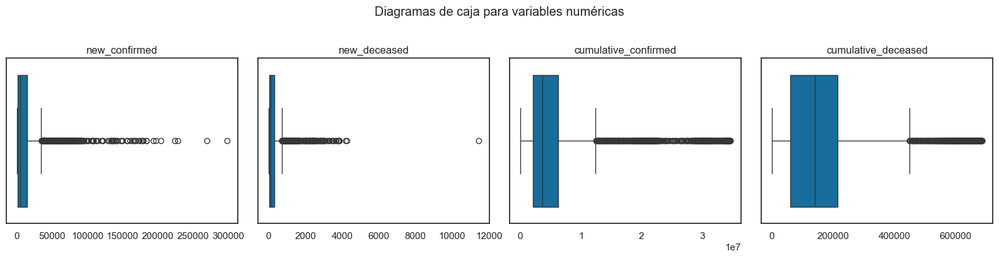

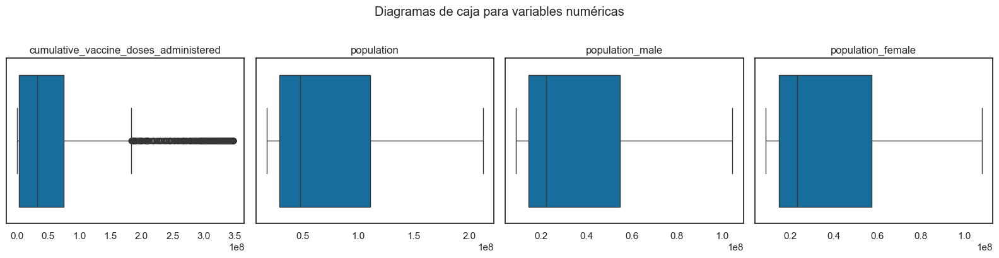

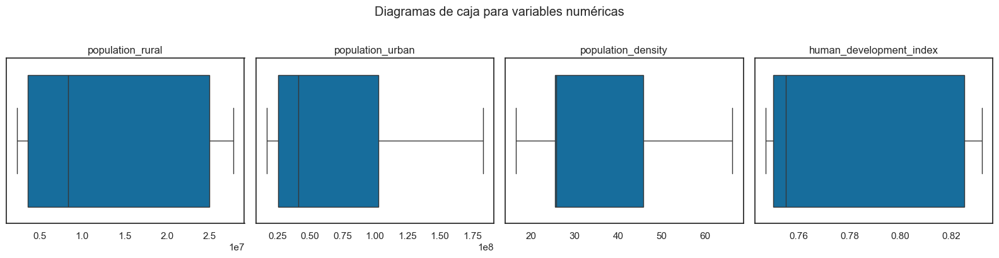

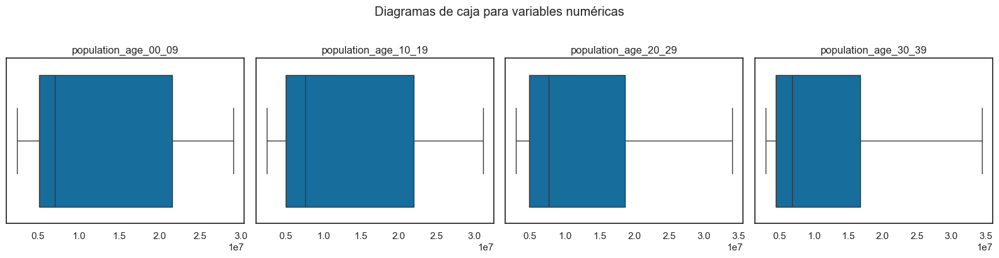

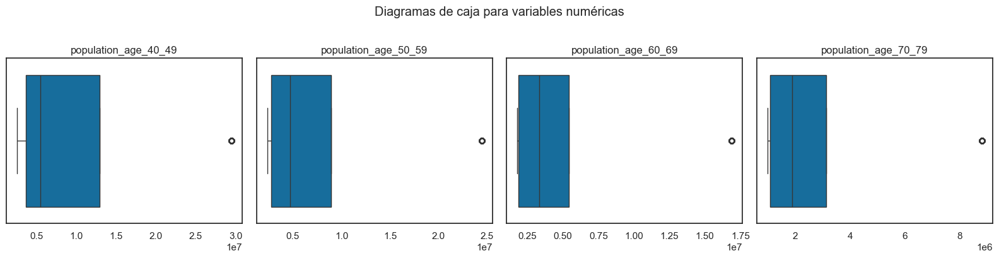

...

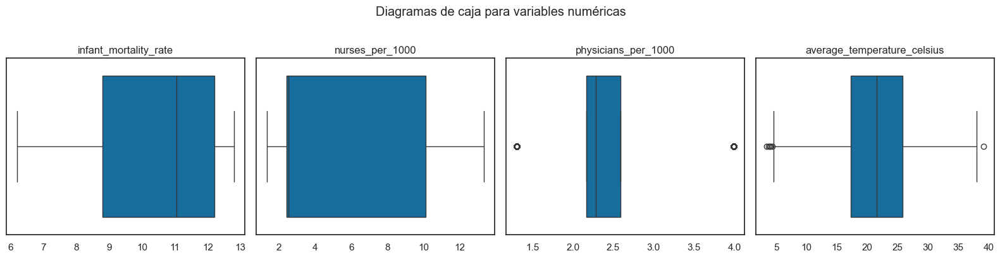

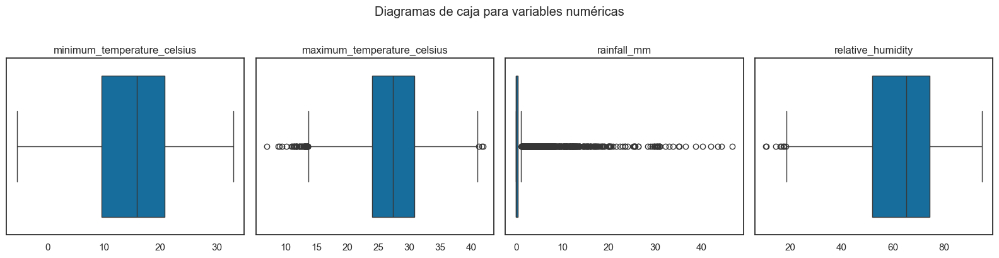

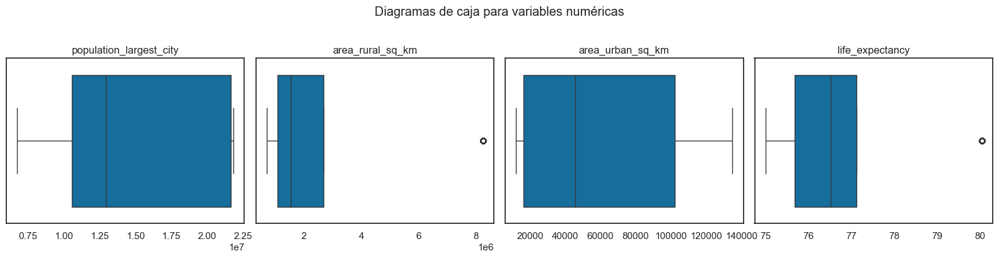

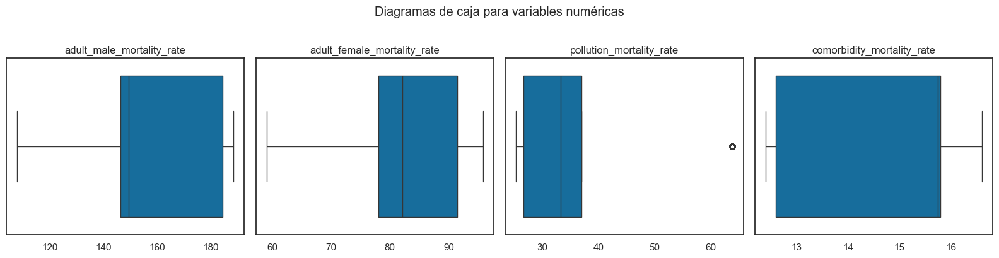

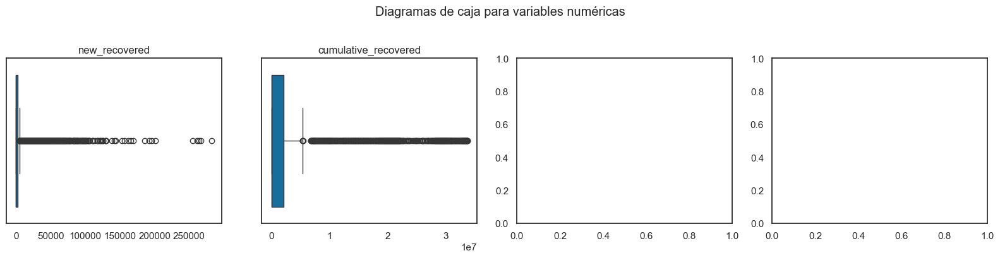

In [ ]:
# Visualizo la distribución de los datos: Éstos gráficos muestran la mediana, los cuartiles y los posibles valores atípicos de cada variable numérica 
import matplotlib.pyplot as plt
import seaborn as sns

numeric_columns = data_lista.select_dtypes(include=['number']).columns

# Calcular cuántos gráficos se necesitan y la cantidad de filas
num_plots = len(numeric_columns)
num_per_plot = 4
num_rows = (num_plots + num_per_plot - 1) // num_per_plot

# Iterar sobre las columnas y crear subplots
for i, column in enumerate(numeric_columns):
    if i % num_per_plot == 0:
        fig, axes = plt.subplots(nrows=1, ncols=num_per_plot, figsize=(16, 4))
        fig.suptitle('Diagramas de caja para variables numéricas', y=1.02)
    sns.boxplot(x=data_lista[column], ax=axes[i % num_per_plot])
    axes[i % num_per_plot].set_title(f'{column}')
    axes[i % num_per_plot].set_xlabel('')
    if i % num_per_plot == num_per_plot - 1 or i == num_plots - 1:
        plt.tight_layout()
        plt.show()


## Avance 03 - EDA con Numpy y Pandas

##### Importo las librerías necesarias y leo el archivo listo

In [20]:
# 1 - Importación de Librerías - NumPy, Pandas, matplotlib, seaborn - OK
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [21]:
# 2 - Reinicio el Notebook para liberar memoria y continuar con el análisis con el archivo final del filtrado
# Desde ac usar data_lista
data_lista=pd.read_csv('DatosFinalesFiltrado.csv')

##### Declaro "date" como índice y agrego columnas 'week' y'year' para poder trabajar con los gráficos a nivel temporal.

In [22]:
# 3 - Pongo como índice la columna DATE pra hacer análisis a los largo del tiempo
# Solucionar el problema de las fechas 
# Convertir la columna 'date' a tipo fecha

# Asegurarse de que la columna 'date' esté en formato datetime
data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')

# Comprobar si hay valores NaT (errores en la conversión)
errores_fecha = data_lista[data_lista['date'].isna()]
print(f"Errores en la conversión de fecha:\n{errores_fecha}")

# Asignar la columna 'date' como índice del DataFrame
data_lista.set_index('date', inplace=True)

# Verificar el tipo de índice
print(f"Tipo del índice: {type(data_lista.index)}")

# Verificar las primeras filas del DataFrame
print(f"Primeras filas del DataFrame con el índice de fecha:\n{data_lista.head()}")

# Ahora, el DataFrame debería tener un índice de fecha correcto y puedes continuar con tu análisis.

# Ahora agrego las columnas de semana y año
try:
    data_lista['week'] = data_lista.index.isocalendar().week
    data_lista['year'] = data_lista.index.isocalendar().year
except Exception as e:
    print("Error al agregar columnas de semana y año:", e)

# Verificar las primeras filas después de agregar las columnas
print("Primeras filas de data_lista con columnas 'week' y 'year':")
print(data_lista.head())

Errores en la conversión de fecha:
Empty DataFrame
Columns: [location_key, date, country_code, country_name, new_confirmed, new_deceased, cumulative_confirmed, cumulative_deceased, cumulative_vaccine_doses_administered, population, population_male, population_female, population_rural, population_urban, population_density, human_development_index, population_age_00_09, population_age_10_19, population_age_20_29, population_age_30_39, population_age_40_49, population_age_50_59, population_age_60_69, population_age_70_79, population_age_80_and_older, gdp_usd, gdp_per_capita_usd, latitude, longitude, area_sq_km, smoking_prevalence, diabetes_prevalence, infant_mortality_rate, nurses_per_1000, physicians_per_1000, average_temperature_celsius, minimum_temperature_celsius, maximum_temperature_celsius, rainfall_mm, relative_humidity, population_largest_city, area_rural_sq_km, area_urban_sq_km, life_expectancy, adult_male_mortality_rate, adult_female_mortality_rate, pollution_mortality_rate, com

##### Declaro la lista de países para usar en los gráficos

In [16]:
# Lista de países donde se expandirán OK
paises_seleccionados = ['Argentina','Chile','Colombia','Mexico','Peru','Brazil']
# Lista de países  OK
paises_seleccionados_cod = ['AR','CL','CO','MX','PE','BR']

In [17]:
data_lista.index

DatetimeIndex(['2021-01-02', '2021-01-03', '2021-01-04', '2021-01-05',
               '2021-01-06', '2021-01-07', '2021-01-08', '2021-01-09',
               '2021-01-10', '2021-01-11',
               ...
               '2022-09-08', '2022-09-09', '2022-09-10', '2022-09-11',
               '2022-09-12', '2022-09-13', '2022-09-14', '2022-09-15',
               '2022-09-16', '2022-09-17'],
              dtype='datetime64[ns]', name='date', length=3744, freq=None)

In [30]:
data_lista.columns

Index(['location_key', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_sq_km', 

##### ------ EDA - Análisis Exploratorio de Datos ------

##### Graficos la "Evolución semanal y Anual de Casos Nuevos de COVID-19 en América Latina". y pequeño análisis

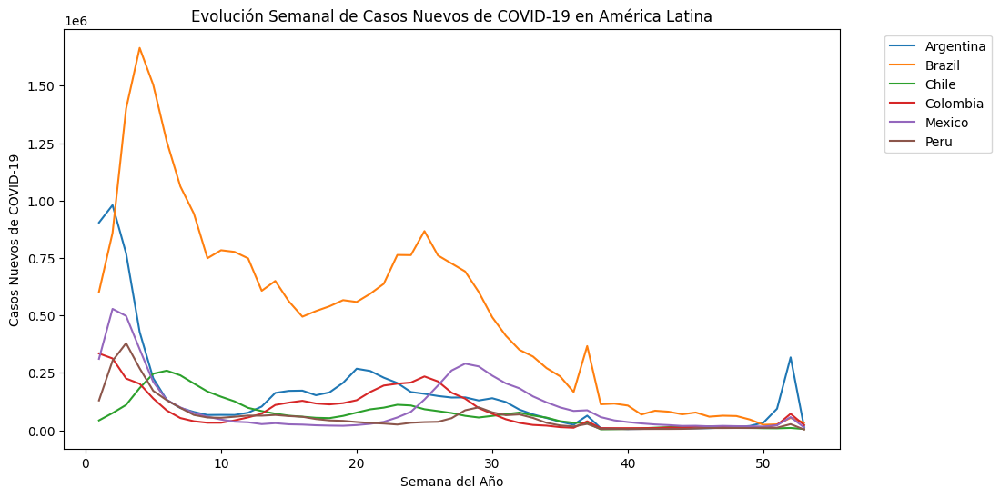

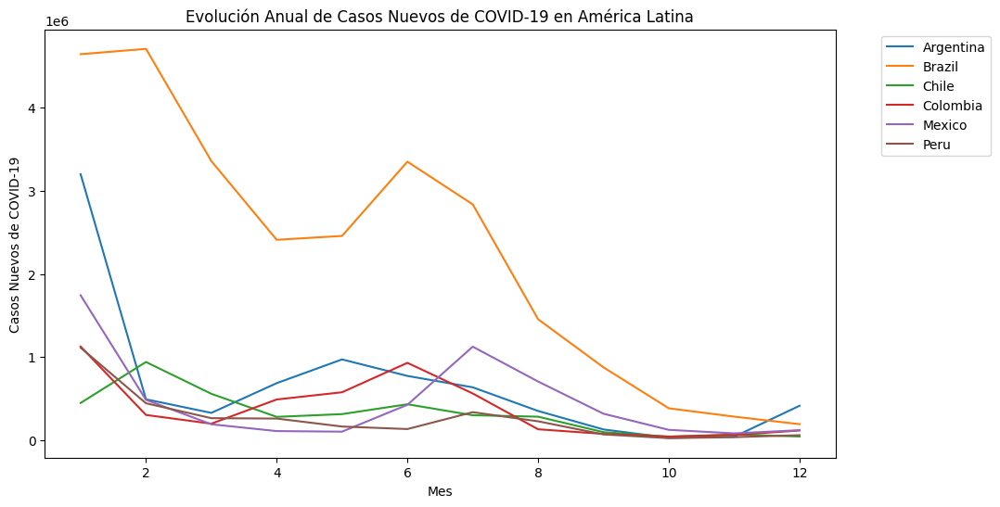

In [28]:
# 5 - Evolución Anual de Casos Nuevos de COVID-19 en América Latina - OK
import pandas as pd
import matplotlib.pyplot as plt

# Asegurándonos de que el índice es de tipo datetime
data_lista.index = pd.to_datetime(data_lista.index)

# Ahora podemos agregar las columnas de semana y año
data_lista['week'] = data_lista.index.isocalendar().week
data_lista['year'] = data_lista.index.isocalendar().year

# Evolución semanal de casos nuevos de COVID-19
weekly_cases = data_lista.groupby(['country_name', 'week'])[['new_confirmed']].sum().reset_index()

plt.figure(figsize=[11, 6])
for country in weekly_cases['country_name'].unique():
    country_weekly_cases = weekly_cases[weekly_cases['country_name'] == country]
    plt.plot(country_weekly_cases['week'], country_weekly_cases['new_confirmed'], label=country)

plt.xlabel('Semana del Año')
plt.ylabel('Casos Nuevos de COVID-19')
plt.title('Evolución Semanal de Casos Nuevos de COVID-19 en América Latina')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Evolución anual de casos nuevos de COVID-19
data_lista['month'] = data_lista.index.month
yearly_cases = data_lista.groupby(['country_name', 'month'])[['new_confirmed']].sum().reset_index()

plt.figure(figsize=[11, 6])
for country in yearly_cases['country_name'].unique():
    country_yearly_cases = yearly_cases[yearly_cases['country_name'] == country]
    plt.plot(country_yearly_cases['month'], country_yearly_cases['new_confirmed'], label=country)

plt.xlabel('Mes')
plt.ylabel('Casos Nuevos de COVID-19')
plt.title('Evolución Anual de Casos Nuevos de COVID-19 en América Latina')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


Análisis general de los gráficos anteriores: 

Tendencias Generales:
* Brasil (naranja): La alta incidencia de casos al principio del año, coincidiendo con los meses cálidos y húmedos, refuerza la hipótesis de que estas condiciones pueden haber favorecido la propagación del virus. Las fluctuaciones posteriores pueden reflejar cambios estacionales y la implementación de medidas sanitarias.
* Argentina (azul): Similarmente, la disminución de casos nuevos después de los primeros meses puede sugerir que, además de las intervenciones de salud pública, las condiciones climáticas menos favorables para el virus contribuyeron a la reducción de su transmisión.
* Otros países (Chile, Colombia, México, Perú): Muestran un patrón similar, con una mayor incidencia al inicio del año, disminuyendo luego.

* Los picos de casos nuevos al inicio del año, especialmente en Brasil y Argentina, pueden estar influenciados por las condiciones climáticas cálidas y húmedas que son favorables para la propagación del COVID-19.
* La disminución general en los casos nuevos a lo largo del año podría no solo reflejar la efectividad de las medidas sanitarias y de vacunación, sino también la influencia de condiciones climáticas menos favorables para el virus en los meses posteriores.

Aunque las condiciones climáticas pueden haber influido en la propagación del virus, la implementación de medidas de control y las campañas de vacunación deben haber sido cruciales para reducir los nuevos casos a lo largo del año.

La variabilidad en las tendencias entre los diferentes países puede reflejar no solo las diferencias climáticas, sino también las diferencias en la respuesta de salud pública, la adherencia a las medidas de prevención y la disponibilidad y distribución de vacunas.

##### Progreso de la vacunación por país - con análisis

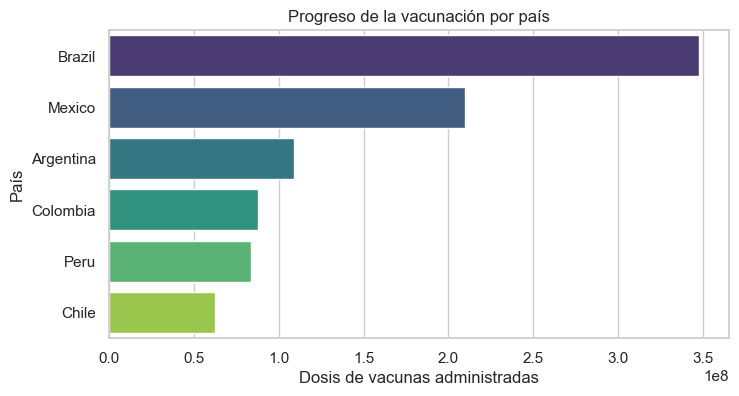

In [ ]:
# 7 - Progreso de la vacunación por país - OK
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Agrupar los datos por país y obtener el número máximo de dosis administradas
vaccination_data = data_lista.groupby('country_name')['cumulative_vaccine_doses_administered'].max().sort_values(ascending=False)

# Configurar el tamaño de la figura
plt.figure(figsize=[8, 4])

# Crear un gráfico de barras horizontales
sns.barplot(x=vaccination_data.values, y=vaccination_data.index, hue=vaccination_data.index, palette='viridis', legend=False)

# Etiquetas del gráfico
plt.xlabel('Dosis de vacunas administradas')
plt.ylabel('País')
plt.title('Progreso de la vacunación por país')

# Mostrar el gráfico
plt.show()



Análisis:
* Brasil y México lideran en términos de dosis administradas, lo que sugiere una capacidad robusta y efectiva en la implementación de sus programas de vacunación.
* Argentina también muestra un progreso notable, aunque menor en comparación con Brasil y México.
* Colombia, Perú y Chile tienen menores cantidades de dosis administradas, lo que podría indicar desafíos en la adquisición y distribución de vacunas, así como en la aceptación pública de las mismas.

Factores que pueden influir:
* Tamaño de la Población: Brasil y México tienen grandes poblaciones, lo que puede explicar en parte el mayor número de dosis administradas.
* Infraestructura Sanitaria: La capacidad de distribución y administración efectiva de las vacunas está reflejada en estos números.
* Disponibilidad de Vacunas: La adquisición de vacunas y la logística para su distribución también juegan un papel crucial.

##### Progreso de la vacunación por país per cápita - con análisis

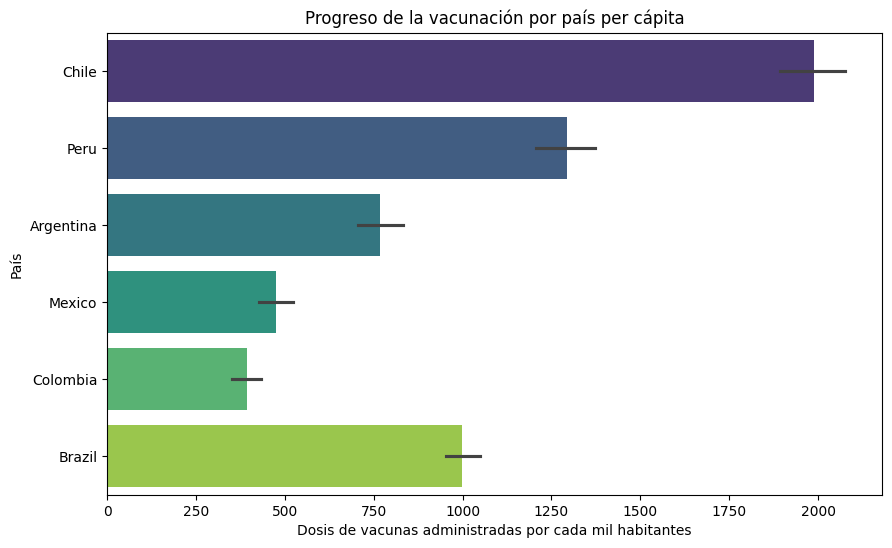

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Suponemos que `data_lista` ya tiene tus datos
# y que `data_lista` tiene `date` como índice

# Lista de países seleccionados
paises_seleccionados = ['Argentina', 'Chile', 'Colombia', 'Mexico', 'Peru', 'Brazil']

# Filtrar el DataFrame para incluir solo los países seleccionados
data_filtrada = data_lista[data_lista['country_name'].isin(paises_seleccionados)]

# Calcular las dosis administradas por cada mil habitantes
data_filtrada['doses_per_capita'] = data_filtrada['cumulative_vaccine_doses_administered'] / (data_filtrada['population'] / 1000)

# Ordenar los datos por dosis per cápita
data_filtrada_sorted = data_filtrada.sort_values(by='doses_per_capita', ascending=False)

# Configurar el tamaño de la figura
plt.figure(figsize=[10, 6])

# Crear un gráfico de barras horizontales
sns.barplot(
    x=data_filtrada_sorted['doses_per_capita'], 
    y=data_filtrada_sorted['country_name'], 
    hue=data_filtrada_sorted['country_name'], 
    palette='viridis',
    legend=False
)

# Etiquetas del gráfico
plt.xlabel('Dosis de vacunas administradas por cada mil habitantes')
plt.ylabel('País')
plt.title('Progreso de la vacunación por país per cápita')

# Mostrar el gráfico
plt.show()



Análisis
Chile: Lidera significativamente en términos de dosis administradas por cada mil habitantes, lo que sugiere una campaña de vacunación muy efectiva y bien gestionada.

Perú: Tiene un buen progreso, aunque no tan alto como Chile, lo que indica un esfuerzo significativo en la administración de vacunas.

Argentina y México: Están en un rango medio similar, mostrando un progreso moderado en la vacunación.

Colombia: Presenta un progreso más bajo en comparación con los países anteriores, pero aún ha administrado una cantidad considerable de dosis per cápita.

Brasil: Se encuentra al final de la lista con la menor cantidad de dosis administradas por cada mil habitantes entre los países presentados. Esto puede ser indicativo de desafíos en la adquisición, distribución o aceptación de las vacunas.

Tamaño de la Población: Brasil y México, al tener poblaciones más grandes, podrían tener un mayor desafío en alcanzar una alta tasa de vacunación per cápita rápidamente.
Infraestructura Sanitaria: La capacidad de distribución y administración de vacunas puede variar significativamente entre los países, afectando el número de dosis administradas.
Disponibilidad de Vacunas: La adquisición de vacunas y la logística para su distribución juegan un papel crucial en el progreso de la vacunación.
Aceptación Pública: La voluntad de la población de recibir la vacuna también puede influir en las tasas de vacunación.

##### Comparación de la Tasa de Letalidad del COVID-19 Entre Países de América Latina

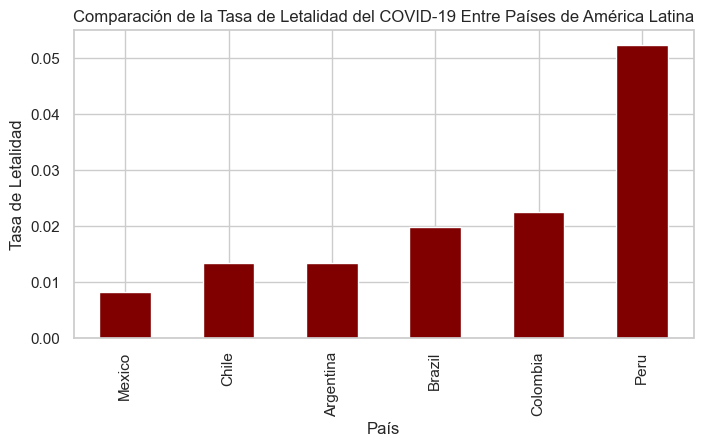

In [ ]:
# 8 - Comparación de la Tasa de Letalidad del COVID-19 Entre Países de América Latina - OK
import matplotlib.pyplot as plt

# Calcula la tasa de letalidad por país
data_lista['case_fatality_rate'] = data_lista['cumulative_deceased'] / data_lista['cumulative_confirmed']
fatality_rates = data_lista.groupby('country_name')['case_fatality_rate'].last().sort_values()

# Crea el gráfico de barras
plt.figure(figsize=(8, 4))
bars = fatality_rates.plot(kind='bar', color='maroon')

# Configura los ejes y el título del gráfico
plt.xlabel('País')
plt.ylabel('Tasa de Letalidad')
plt.title('Comparación de la Tasa de Letalidad del COVID-19 Entre Países de América Latina')

# Muestra el gráfico
plt.show()


##### Relación entre la Cobertura de Vacunación y la Reducción de Casos en América Latina

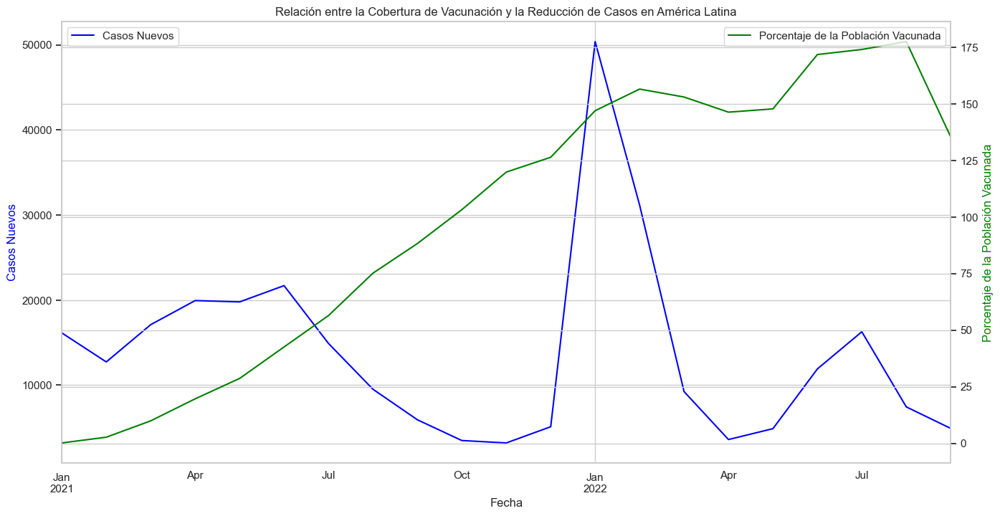

In [ ]:
# 9 - Relación entre la Cobertura de Vacunación y la Reducción de Casos en América Latina - OK
import matplotlib.pyplot as plt

# Cómo evoluciona la vacunación en América Latina y la reducción de casos de COVID-19
plt.figure(figsize=(16, 8))
ax1 = plt.gca()
ax2 = ax1.twinx()

# Área de porcentajes de vacunación
data_lista['percentage_vaccinated'] = (data_lista['cumulative_vaccine_doses_administered'] / data_lista['population']) * 100
data_lista.resample('ME').mean(numeric_only=True)['new_confirmed'].plot(ax=ax1, color='blue', label='Casos Nuevos')
data_lista.resample('ME').mean(numeric_only=True)['percentage_vaccinated'].plot(ax=ax2, color='green', label='Porcentaje de la Población Vacunada')

ax1.set_xlabel('Fecha')
ax1.set_ylabel('Casos Nuevos', color='blue')
ax2.set_ylabel('Porcentaje de la Población Vacunada', color='green')
plt.title('Relación entre la Cobertura de Vacunación y la Reducción de Casos en América Latina')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()


In [ ]:
# 10 - Nombres de columnas - OK
print(data_lista.columns)

Index(['location_key', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_sq_km', 

##### Evolución de Casos Activos vs. Recuperados

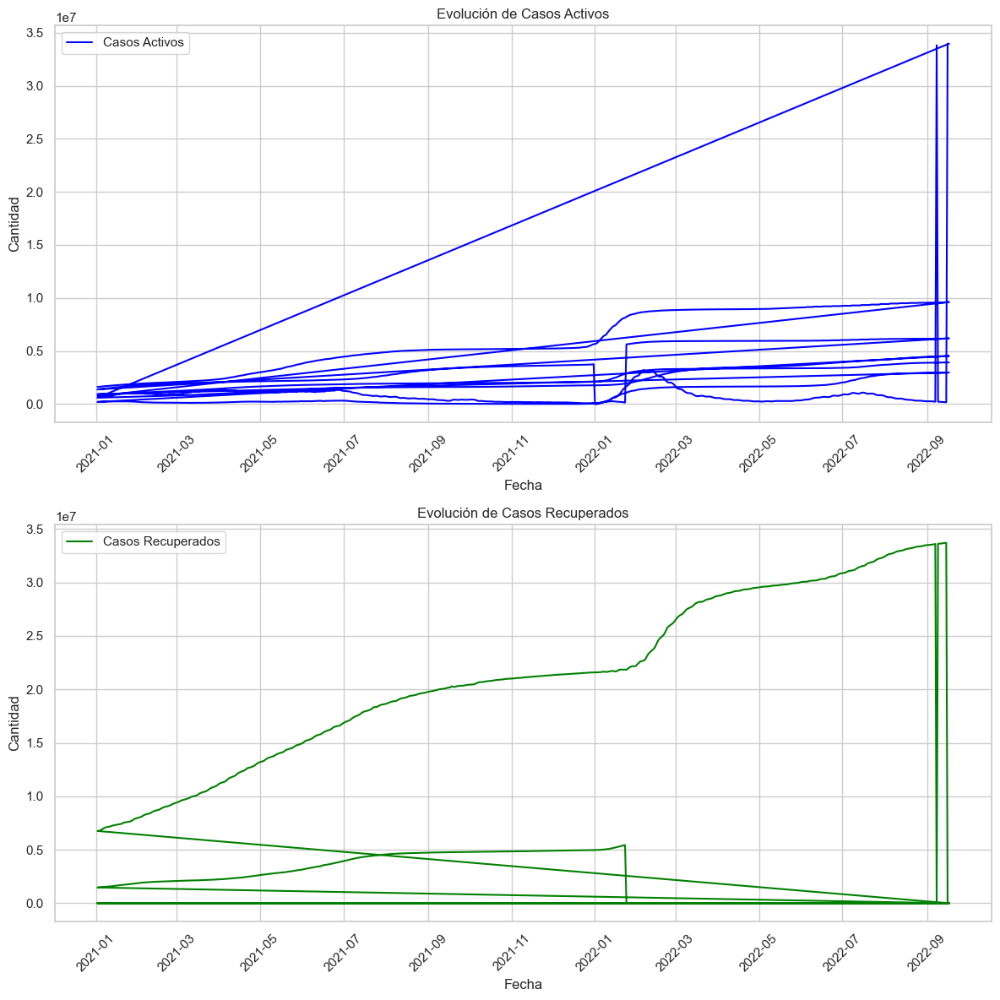

In [ ]:
# 11 - Evolución de Casos Activos vs. Recuperados - OK
import pandas as pd
import matplotlib.pyplot as plt

# Supongamos que data_lista es tu DataFrame y 'date' es el índice
# data_lista = pd.read_csv('tu_archivo.csv', index_col='date') # Cargar tu DataFrame aquí

# Calcular casos activos
data_lista['casos_activos'] = data_lista['cumulative_confirmed'] - data_lista['cumulative_recovered'] - data_lista['cumulative_deceased']

# Crear subgráficos
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12))

# Graficar evolución de casos activos
axes[0].plot(data_lista.index, data_lista['casos_activos'], label='Casos Activos', color='blue')
axes[0].set_title('Evolución de Casos Activos')
axes[0].set_xlabel('Fecha')
axes[0].set_ylabel('Cantidad')
axes[0].legend()
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# Graficar evolución de casos recuperados
axes[1].plot(data_lista.index, data_lista['cumulative_recovered'], label='Casos Recuperados', color='green')
axes[1].set_title('Evolución de Casos Recuperados')
axes[1].set_xlabel('Fecha')
axes[1].set_ylabel('Cantidad')
axes[1].legend()
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True)

# Ajustar el diseño para que no se superpongan los elementos
plt.tight_layout()
plt.show()




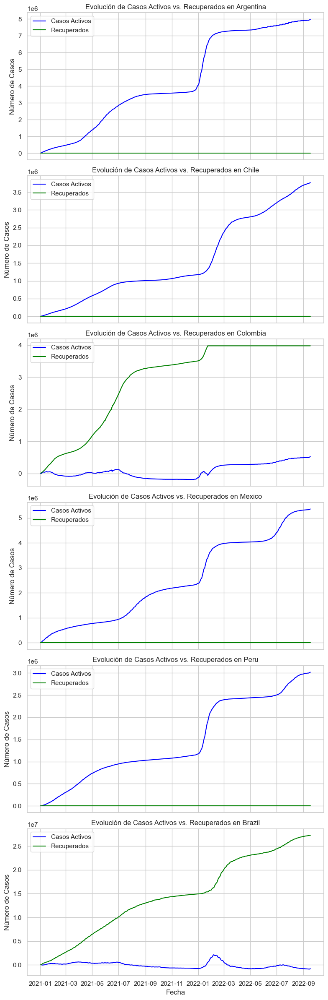

In [ ]:
# Evolución de Casos Activos vs. Recuperados en {pais} - Otro análisis
import matplotlib.pyplot as plt
import pandas as pd

# Lista de países seleccionados
paises_seleccionados = ['Argentina', 'Chile', 'Colombia', 'Mexico', 'Peru', 'Brazil']
# Lista de códigos de países seleccionados
paises_seleccionados_cod = ['AR', 'CL', 'CO', 'MX', 'PE', 'BR']

# Crear una figura y subgráficos
fig, axs = plt.subplots(len(paises_seleccionados), 1, figsize=(8, 4 * len(paises_seleccionados)), sharex=True)

# Iterar sobre los países seleccionados
for i, pais in enumerate(paises_seleccionados):
    # Filtrar los datos para el país actual
    datos_pais = data_lista[data_lista['country_name'] == pais].copy()
    
    # Calcular los casos activos acumulados
    datos_pais.loc[:, 'cumulative_active_cases'] = (datos_pais['new_confirmed'].cumsum() -
                                                    datos_pais['new_deceased'].cumsum() -
                                                    datos_pais['new_recovered'].cumsum())
    
    # Graficar la evolución de casos activos y recuperados
    axs[i].plot(datos_pais.index, datos_pais['cumulative_active_cases'], label='Casos Activos', color='blue')
    axs[i].plot(datos_pais.index, datos_pais['new_recovered'].cumsum(), label='Recuperados', color='green')
    
    # Configurar el título y las etiquetas del eje y
    axs[i].set_title(f'Evolución de Casos Activos vs. Recuperados en {pais}')
    axs[i].set_ylabel('Número de Casos')
    axs[i].legend()

# Añadir etiqueta común al eje x
plt.xlabel('Fecha')

# Ajustar el diseño para que los subgráficos no se solapen
plt.tight_layout()

# Mostrar el gráfico
plt.show()



##### Evolución de la Tasa de Crecimiento de Casos Recuperados' y 'Activos

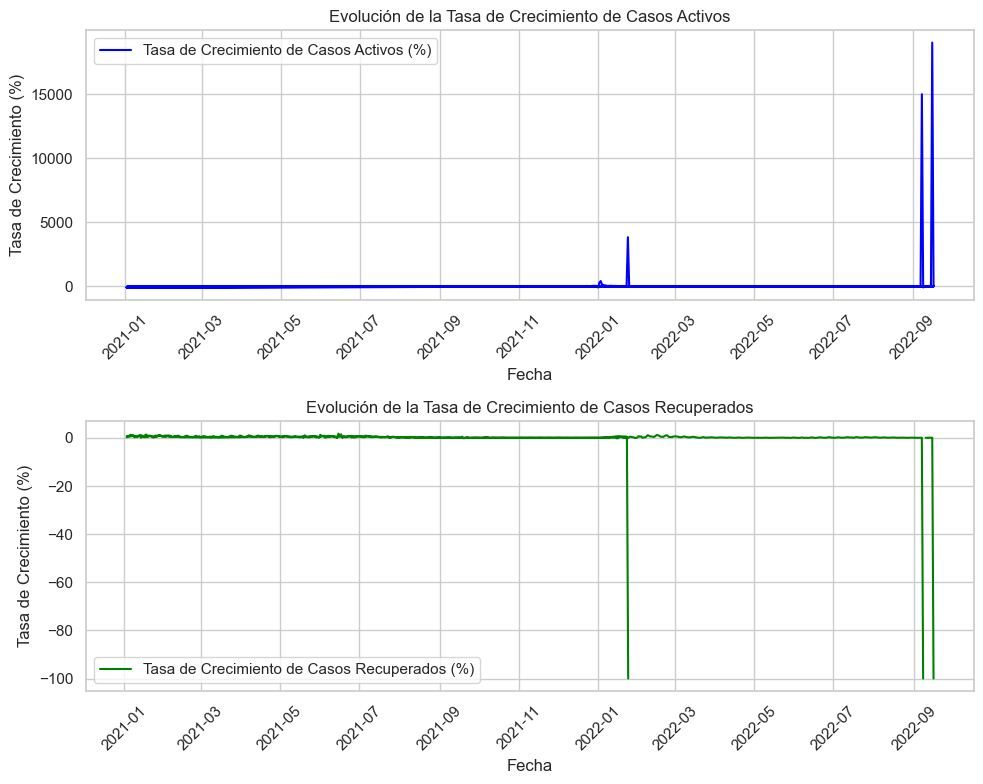

In [ ]:
# 'Evolución de la Tasa de Crecimiento de Casos Recuperados' y 'Activos'
import pandas as pd
import matplotlib.pyplot as plt

# Calcular casos activos
data_lista['casos_activos'] = data_lista['cumulative_confirmed'] - data_lista['cumulative_recovered'] - data_lista['cumulative_deceased']

# Calcular el crecimiento diario
data_lista['casos_activos_diff'] = data_lista['casos_activos'].diff()
data_lista['cumulative_recovered_diff'] = data_lista['cumulative_recovered'].diff()

# Calcular la tasa de crecimiento porcentual diaria
data_lista['casos_activos_growth_rate'] = (data_lista['casos_activos_diff'] / data_lista['casos_activos'].shift(1)) * 100
data_lista['cumulative_recovered_growth_rate'] = (data_lista['cumulative_recovered_diff'] / data_lista['cumulative_recovered'].shift(1)) * 100

# Crear subgráficos
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# Graficar evolución de la tasa de crecimiento de casos activos
axes[0].plot(data_lista.index, data_lista['casos_activos_growth_rate'], label='Tasa de Crecimiento de Casos Activos (%)', color='blue')
axes[0].set_title('Evolución de la Tasa de Crecimiento de Casos Activos')
axes[0].set_xlabel('Fecha')
axes[0].set_ylabel('Tasa de Crecimiento (%)')
axes[0].legend()
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# Graficar evolución de la tasa de crecimiento de casos recuperados
axes[1].plot(data_lista.index, data_lista['cumulative_recovered_growth_rate'], label='Tasa de Crecimiento de Casos Recuperados (%)', color='green')
axes[1].set_title('Evolución de la Tasa de Crecimiento de Casos Recuperados')
axes[1].set_xlabel('Fecha')
axes[1].set_ylabel('Tasa de Crecimiento (%)')
axes[1].legend()
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True)

# Ajustar el diseño para que no se superpongan los elementos
plt.tight_layout()
plt.show()


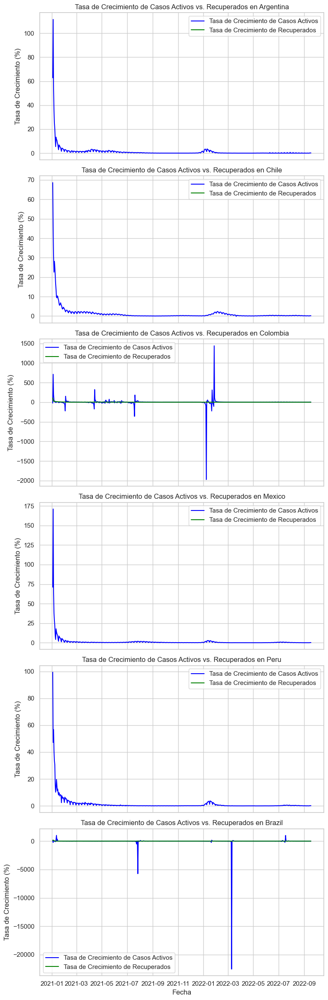

In [ ]:
# Tasa de Crecimiento de Casos Activos vs. Recuperados en {pais} - Otra opción
import matplotlib.pyplot as plt
import pandas as pd

# Lista de países seleccionados
paises_seleccionados = ['Argentina', 'Chile', 'Colombia', 'Mexico', 'Peru', 'Brazil']
# Lista de códigos de países seleccionados
paises_seleccionados_cod = ['AR', 'CL', 'CO', 'MX', 'PE', 'BR']

# Crear una figura y subgráficos
fig, axs = plt.subplots(len(paises_seleccionados), 1, figsize=(8, 4 * len(paises_seleccionados)), sharex=True)

# Iterar sobre los países seleccionados
for i, pais in enumerate(paises_seleccionados):
    # Filtrar los datos para el país actual
    datos_pais = data_lista[data_lista['country_name'] == pais].copy()
    
    # Calcular los casos activos acumulados
    datos_pais['cumulative_active_cases'] = (datos_pais['new_confirmed'].cumsum() -
                                             datos_pais['new_deceased'].cumsum() -
                                             datos_pais['new_recovered'].cumsum())
    
    # Calcular la tasa de crecimiento de casos activos
    datos_pais['active_cases_growth_rate'] = datos_pais['cumulative_active_cases'].pct_change() * 100
    
    # Calcular la tasa de crecimiento de casos recuperados
    datos_pais['recovered_growth_rate'] = datos_pais['new_recovered'].cumsum().pct_change() * 100
    
    # Graficar la evolución de la tasa de crecimiento de casos activos y recuperados
    axs[i].plot(datos_pais.index, datos_pais['active_cases_growth_rate'], label='Tasa de Crecimiento de Casos Activos', color='blue')
    axs[i].plot(datos_pais.index, datos_pais['recovered_growth_rate'], label='Tasa de Crecimiento de Recuperados', color='green')
    
    # Configurar el título y las etiquetas del eje y
    axs[i].set_title(f'Tasa de Crecimiento de Casos Activos vs. Recuperados en {pais}')
    axs[i].set_ylabel('Tasa de Crecimiento (%)')
    axs[i].legend()

# Añadir etiqueta común al eje x
plt.xlabel('Fecha')

# Ajustar el diseño para que los subgráficos no se solapen
plt.tight_layout()

# Mostrar el gráfico
plt.show()


##### Calcular tasa de crecimiento % 

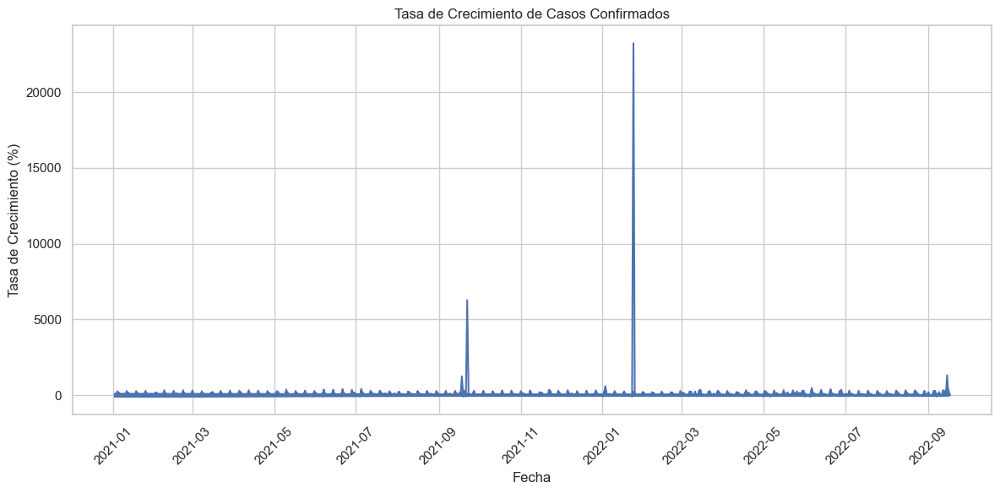

In [ ]:
# 12 - Calcular tasa de crecimiento % - OK
# Calcular tasa de crecimiento %
data_lista['tasa_crecimiento'] = data_lista['new_confirmed'].pct_change() * 100

# Graficar tasa de crecimiento
plt.figure(figsize=(12, 6))
plt.plot(data_lista.index, data_lista['tasa_crecimiento'], label='Tasa de Crecimiento')
plt.title('Tasa de Crecimiento de Casos Confirmados')
plt.xlabel('Fecha')
plt.ylabel('Tasa de Crecimiento (%)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


##### Graficar relación entre cobertura de vacunación y reducción de casos

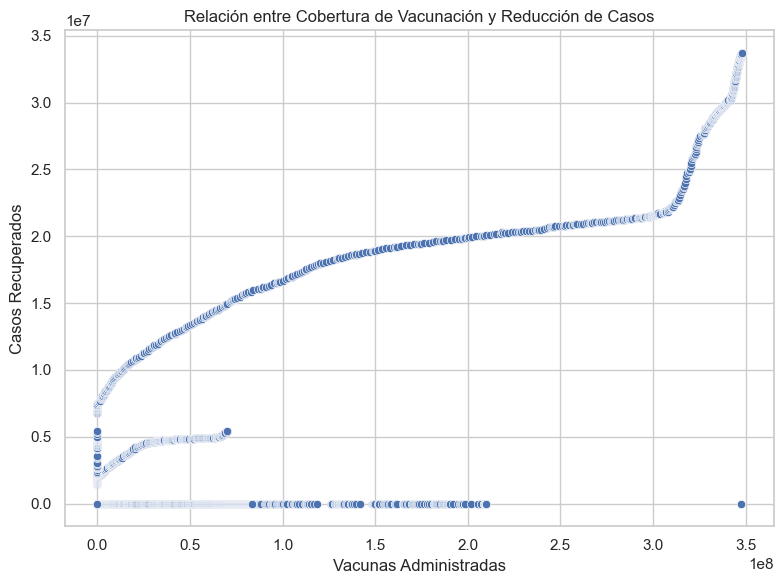

In [ ]:
# 13 - Graficar relación entre cobertura de vacunación y reducción de casos - RARO
plt.figure(figsize=(8, 6))
sns.scatterplot(x='cumulative_vaccine_doses_administered', y='cumulative_recovered', data=data_lista)
plt.title('Relación entre Cobertura de Vacunación y Reducción de Casos')
plt.xlabel('Vacunas Administradas')
plt.ylabel('Casos Recuperados')
plt.grid(True)
plt.tight_layout()
plt.show()


#####  Gráfico de progreso de la vacunación por país

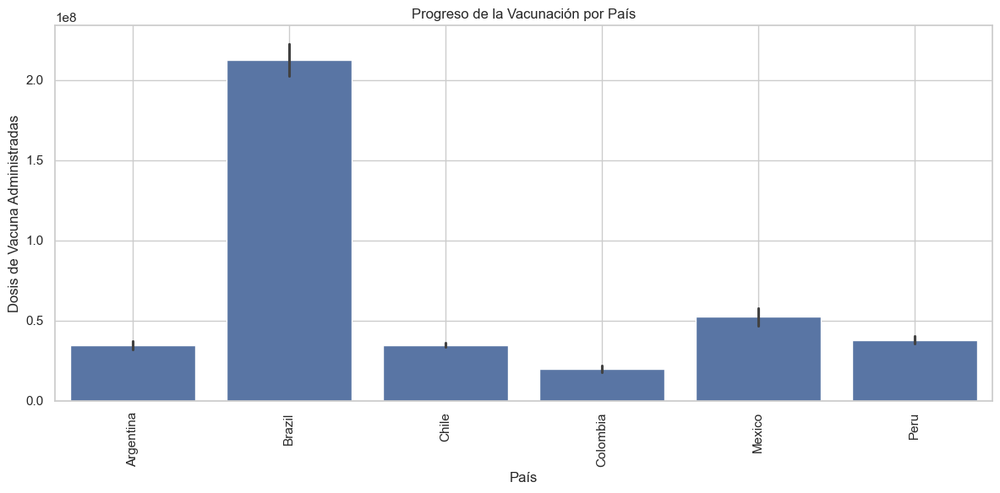

In [ ]:
# 14 - Gráfico de progreso de la vacunación por país - OK
plt.figure(figsize=(12, 6))
sns.barplot(x='country_name', y='cumulative_vaccine_doses_administered', data=data_lista)
plt.title('Progreso de la Vacunación por País')
plt.xlabel('País')
plt.ylabel('Dosis de Vacuna Administradas')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()


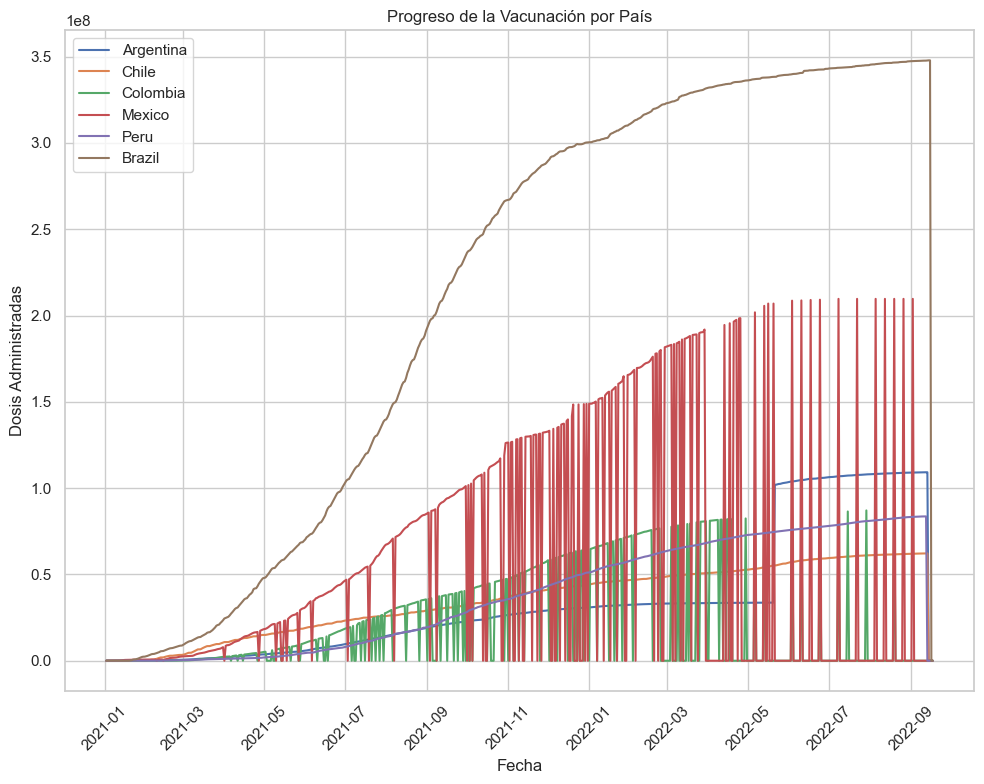

In [ ]:
# Progreso de la Vacunación por País - Otro
import matplotlib.pyplot as plt
import pandas as pd

# Lista de países seleccionados
paises_seleccionados = ['Argentina', 'Chile', 'Colombia', 'Mexico', 'Peru', 'Brazil']
# Lista de códigos de países seleccionados
paises_seleccionados_cod = ['AR', 'CL', 'CO', 'MX', 'PE', 'BR']

# Crear una figura y subgráfico
fig, ax = plt.subplots(figsize=(10, 8))

# Iterar sobre los países seleccionados
for pais in paises_seleccionados:
    # Filtrar los datos para el país actual
    datos_pais = data_lista[data_lista['country_name'] == pais].copy()
    
    # Graficar el progreso de la vacunación
    ax.plot(datos_pais.index, datos_pais['cumulative_vaccine_doses_administered'], label=pais)

# Configurar el título y las etiquetas de los ejes
ax.set_title('Progreso de la Vacunación por País')
ax.set_xlabel('Fecha')
ax.set_ylabel('Dosis Administradas')
ax.legend()

# Mostrar el gráfico
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##### Relación entre Nuevos Casos Confirmados y Temperatura Promedio

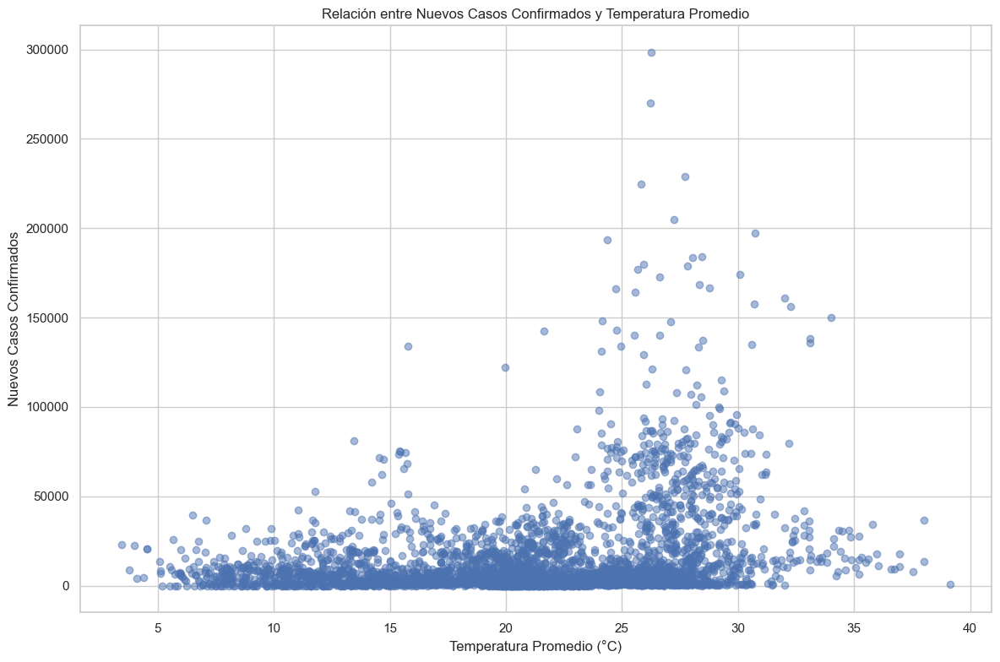

In [ ]:
# 15 - Relación entre Nuevos Casos Confirmados y Temperatura Promedio - OK
import matplotlib.pyplot as plt
import pandas as pd

# Crear una figura y subgráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Graficar la relación entre nuevos casos y temperatura promedio
ax.scatter(data_lista['average_temperature_celsius'], data_lista['new_confirmed'], alpha=0.5)

# Configurar el título y las etiquetas de los ejes
ax.set_title('Relación entre Nuevos Casos Confirmados y Temperatura Promedio')
ax.set_xlabel('Temperatura Promedio (°C)')
ax.set_ylabel('Nuevos Casos Confirmados')

# Mostrar el gráfico
plt.grid(True)
plt.tight_layout()
plt.show()



##### Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas

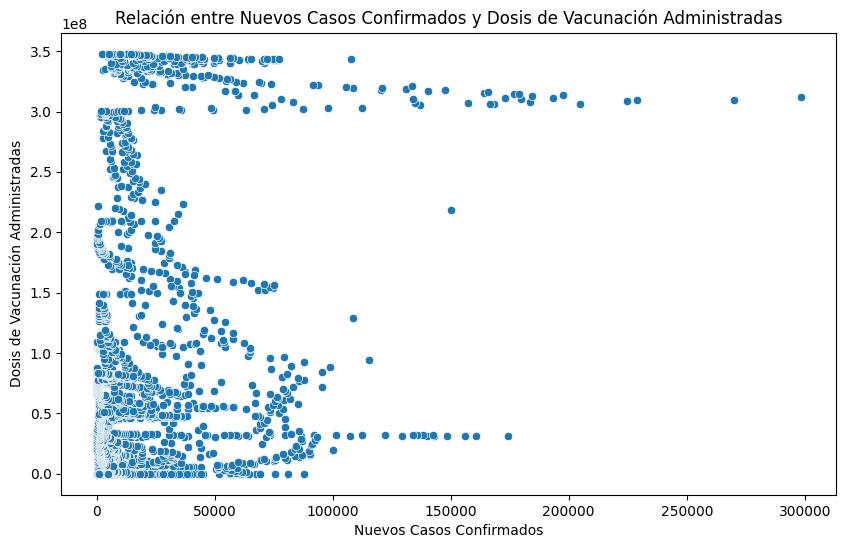

In [7]:
# Gráficos de dispersión - Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas
# Graficar el gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='new_confirmed', y='cumulative_vaccine_doses_administered', data=data_lista)
plt.title('Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas')
plt.xlabel('Nuevos Casos Confirmados')
plt.ylabel('Dosis de Vacunación Administradas')
plt.show()


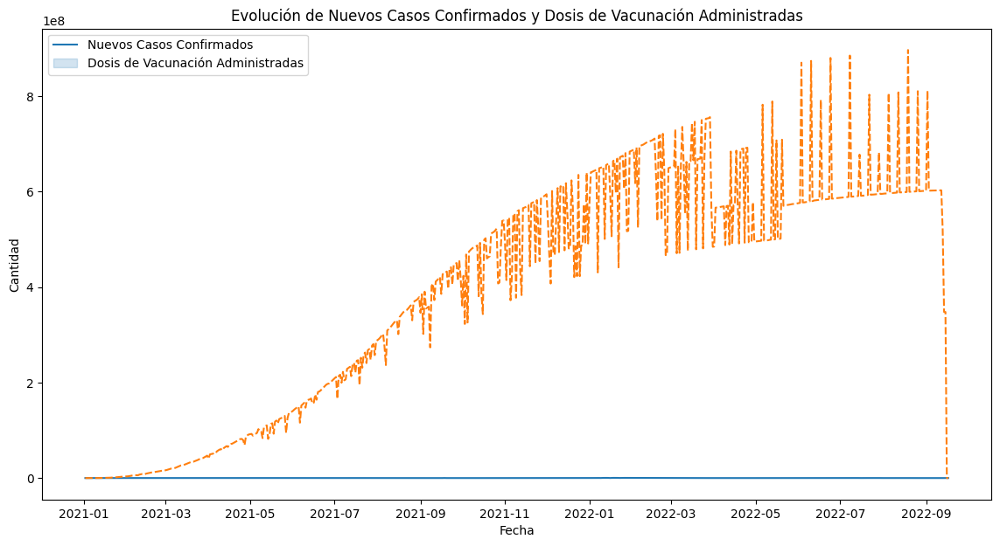

In [8]:
# Evolución de Nuevos Casos Confirmados y Dosis de Vacunación Administradas - Otra opción
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que data_lista es tu DataFrame y ya tiene la columna 'date' como índice

# Agregar datos por nombre de país si hay duplicados
data_agg = data_lista.groupby('date').sum()

# Graficar el gráfico de líneas
plt.figure(figsize=(14, 7))
sns.lineplot(data=data_agg[['new_confirmed', 'cumulative_vaccine_doses_administered']])
plt.title('Evolución de Nuevos Casos Confirmados y Dosis de Vacunación Administradas')
plt.xlabel('Fecha')
plt.ylabel('Cantidad')
plt.legend(['Nuevos Casos Confirmados', 'Dosis de Vacunación Administradas'])
plt.show()

##### Evolución Acumulativa de Nuevos Casos Confirmados y Dosis de Vacunación Administradas

<Figure size 1400x700 with 0 Axes>

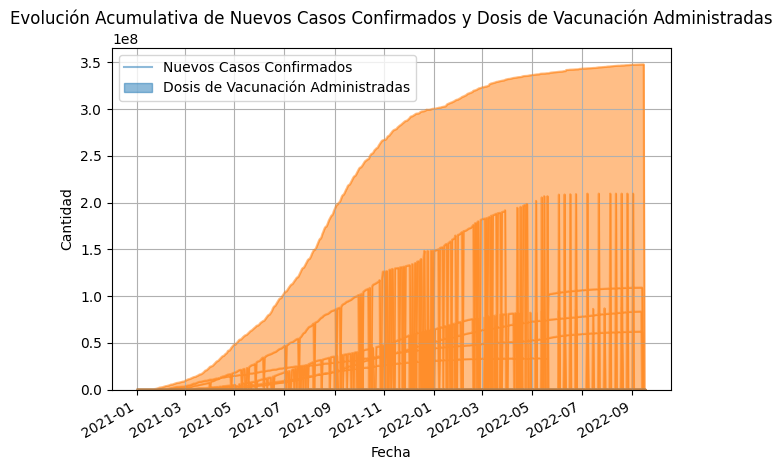

In [9]:
# Evolución Acumulativa de Nuevos Casos Confirmados y Dosis de Vacunación Administradas
import matplotlib.pyplot as plt

# Graficar el gráfico de áreas
plt.figure(figsize=(14, 7))  # Configurar el tamaño de la figura
# Crear el gráfico de áreas para las columnas 'new_confirmed' y 'cumulative_vaccine_doses_administered'
data_lista[['new_confirmed', 'cumulative_vaccine_doses_administered']].plot(kind='area', stacked=False, alpha=0.5)
plt.title('Evolución Acumulativa de Nuevos Casos Confirmados y Dosis de Vacunación Administradas')  # Título del gráfico
plt.xlabel('Fecha')  # Etiqueta del eje x
plt.ylabel('Cantidad')  # Etiqueta del eje y
plt.legend(['Nuevos Casos Confirmados', 'Dosis de Vacunación Administradas'])  # Leyenda del gráfico
plt.grid(True)  # Mostrar la cuadrícula
plt.tight_layout()  # Ajustar el diseño para que no se solapen los elementos
plt.show()  # Mostrar el gráfico

##### 'Evolución Semanal de Casos Nuevos

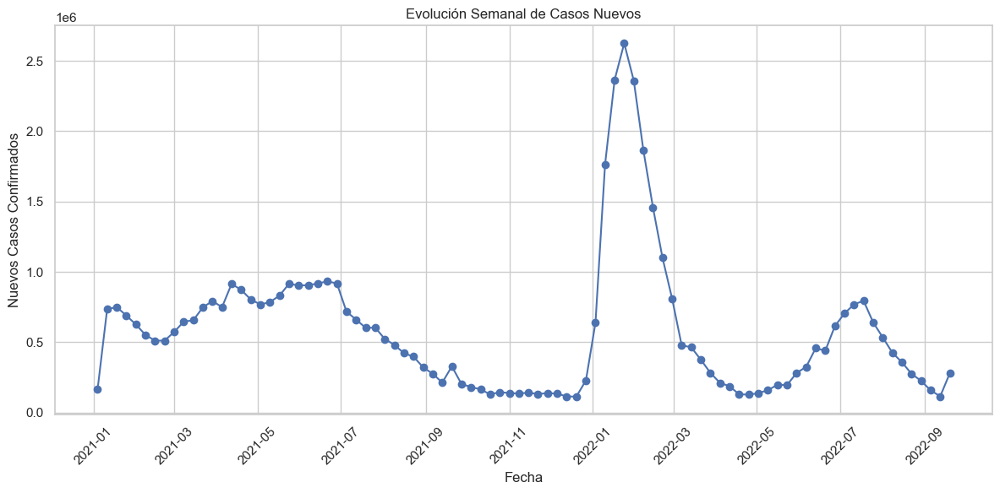

In [ ]:
# 16 - 'Evolución Semanal de Casos Nuevos' OK
df_weekly_cases = data_lista.resample('W-Mon', on='date').sum()
plt.figure(figsize=(12, 6))
plt.plot(df_weekly_cases.index, df_weekly_cases['new_confirmed'], marker='o')
plt.title('Evolución Semanal de Casos Nuevos')
plt.xlabel('Fecha')
plt.ylabel('Nuevos Casos Confirmados')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


##### Evolución anual de nuevos casos 

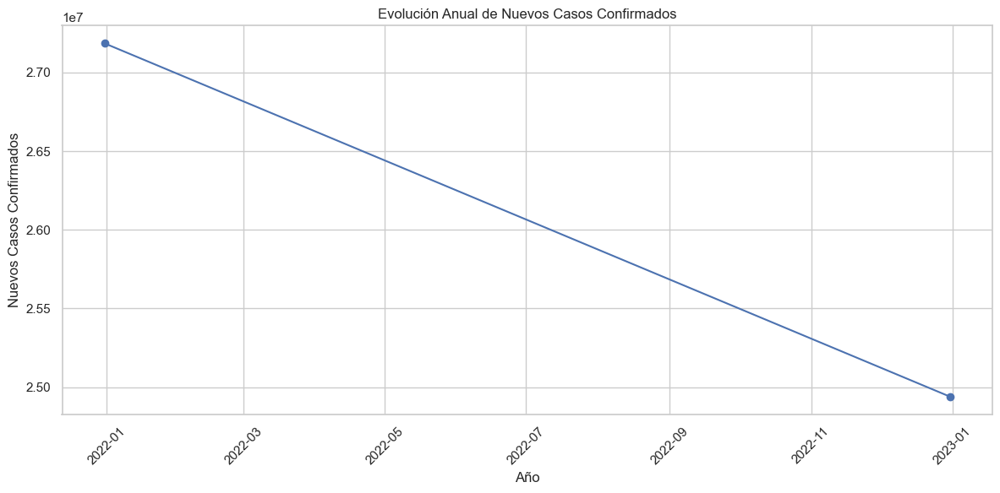

In [ ]:
# 17 - Evolución anual de nuevos casos - RARO
import pandas as pd
import matplotlib.pyplot as plt

# Asegúrate de que 'date' es el índice y está en formato de fecha
data_lista.index = pd.to_datetime(data_lista.index)

# Resample para obtener la suma anual de los nuevos casos confirmados
df_yearly_cases = data_lista['new_confirmed'].resample('YE').sum()

# Crear la gráfica
plt.figure(figsize=(12, 6))
plt.plot(df_yearly_cases.index, df_yearly_cases, marker='o', linestyle='-')
plt.title('Evolución Anual de Nuevos Casos Confirmados')
plt.xlabel('Año')
plt.ylabel('Nuevos Casos Confirmados')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


##### Calcular la suma de casos nuevos para cada año 

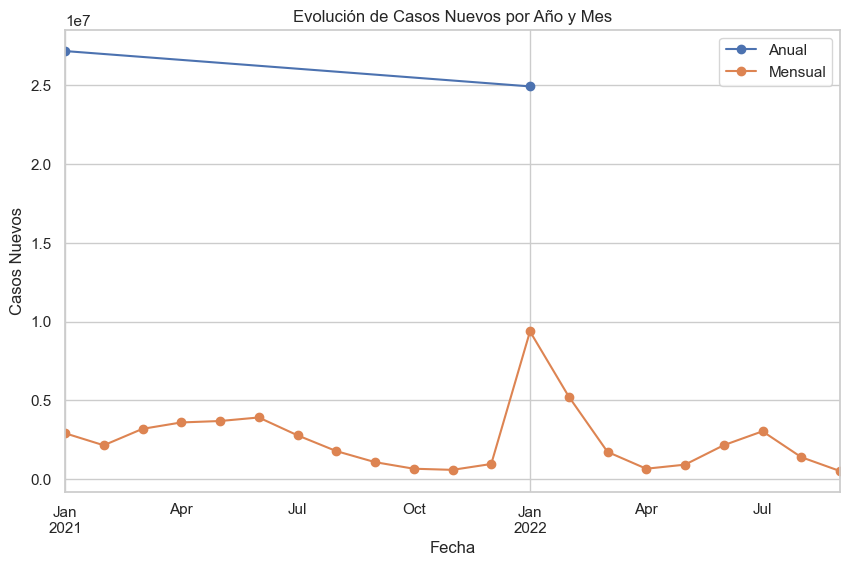

In [ ]:
# Calcular la suma de casos nuevos para cada año - raro

yearly_new_cases = data_lista['new_confirmed'].resample('YE').sum()

# Calcular la suma de casos nuevos para cada mes
monthly_new_cases = data_lista['new_confirmed'].resample('ME').sum()

# Graficar la evolución anual de casos nuevos
plt.figure(figsize=(10, 6))
yearly_new_cases.plot(marker='o', linestyle='-', label='Anual')
monthly_new_cases.plot(marker='o', linestyle='-', label='Mensual')
plt.title('Evolución de Casos Nuevos por Año y Mes')
plt.xlabel('Fecha')
plt.ylabel('Casos Nuevos')
plt.legend()
plt.grid(True)
plt.show()



##### Comparación de Nuevos Casos Confirmados entre Países y  recuperados

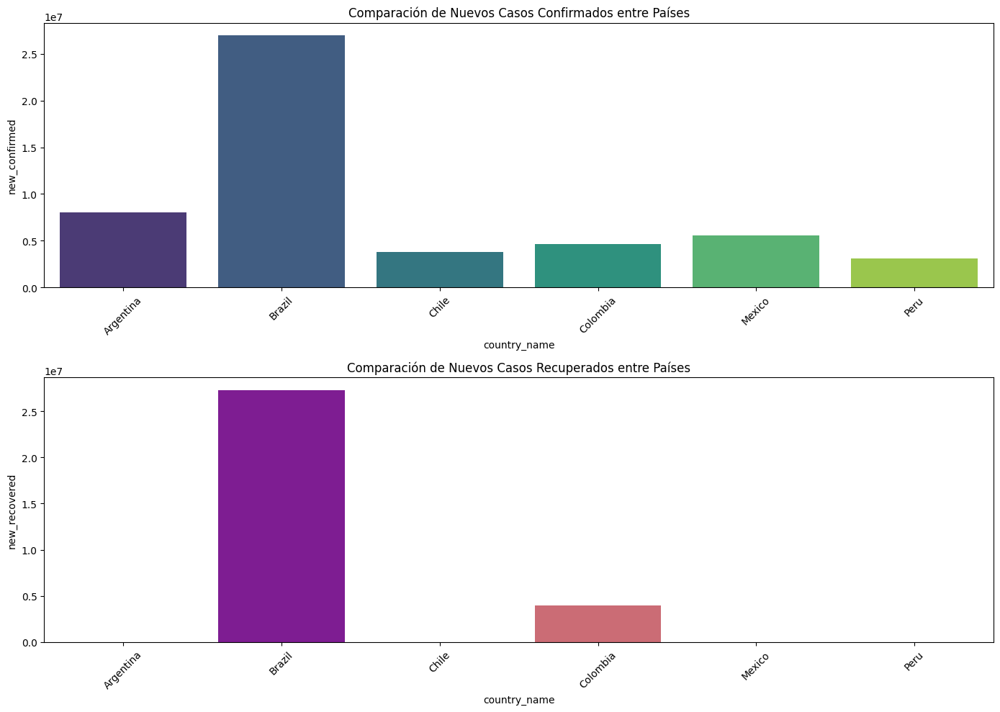

In [6]:
# Gráficos de barras - Comparación de Nuevos Casos Confirmados entre Países y  recuperados

# Agregar datos por nombre de país si hay duplicados
data_agg = data_lista.groupby('country_name', as_index=False).sum()

# Definir paletas de colores
color_map1 = sns.color_palette("viridis", len(data_agg['country_name'].unique()))
color_map2 = sns.color_palette("plasma", len(data_agg['country_name'].unique()))

# Crear una columna para el hue
data_agg['hue'] = data_agg['country_name']

# Graficar
fig, ax = plt.subplots(2, 1, figsize=(14, 10))

# Primer gráfico: Nuevos Casos Confirmados entre Países
sns.barplot(x='country_name', y='new_confirmed', hue='country_name', data=data_agg, ax=ax[0], palette=color_map1, dodge=False, legend=False)
ax[0].set_title('Comparación de Nuevos Casos Confirmados entre Países')
ax[0].tick_params(axis='x', rotation=45)  # Nombres de los países con rotación para mejor lectura

# Segundo gráfico: Nuevos Casos Recuperados entre Países
sns.barplot(x='country_name', y='new_recovered', hue='country_name', data=data_agg, ax=ax[1], palette=color_map2, dodge=False, legend=False)
ax[1].set_title('Comparación de Nuevos Casos Recuperados entre Países')
ax[1].tick_params(axis='x', rotation=45)  # Nombres de los países con rotación para mejor lectura

plt.tight_layout()
plt.show()


##### Distribución de la Población por Edad por países 

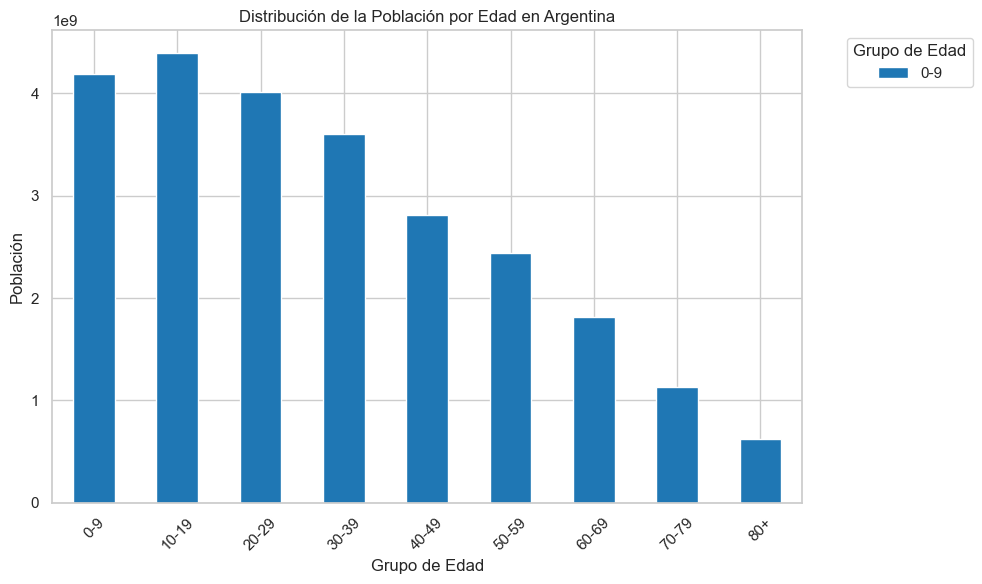

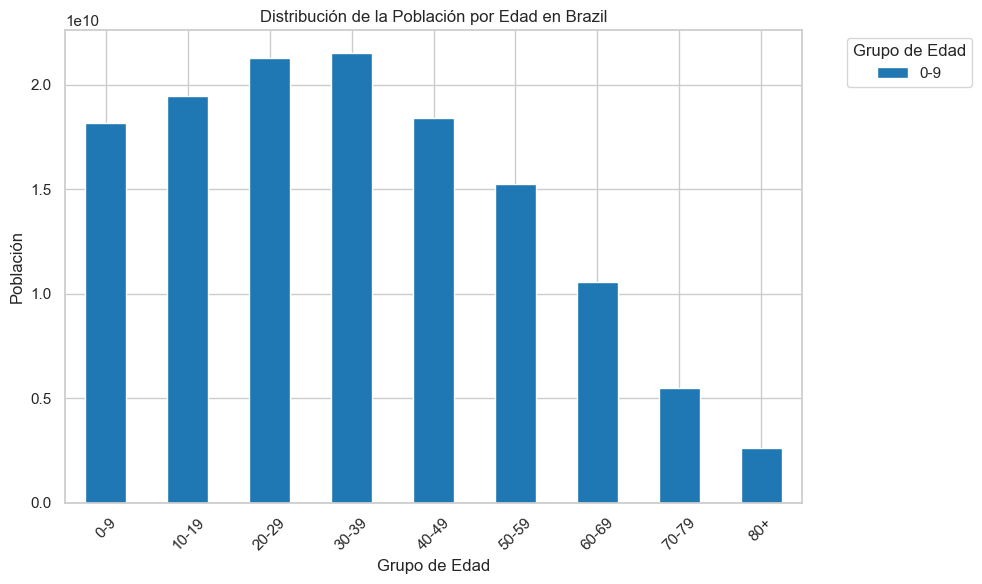

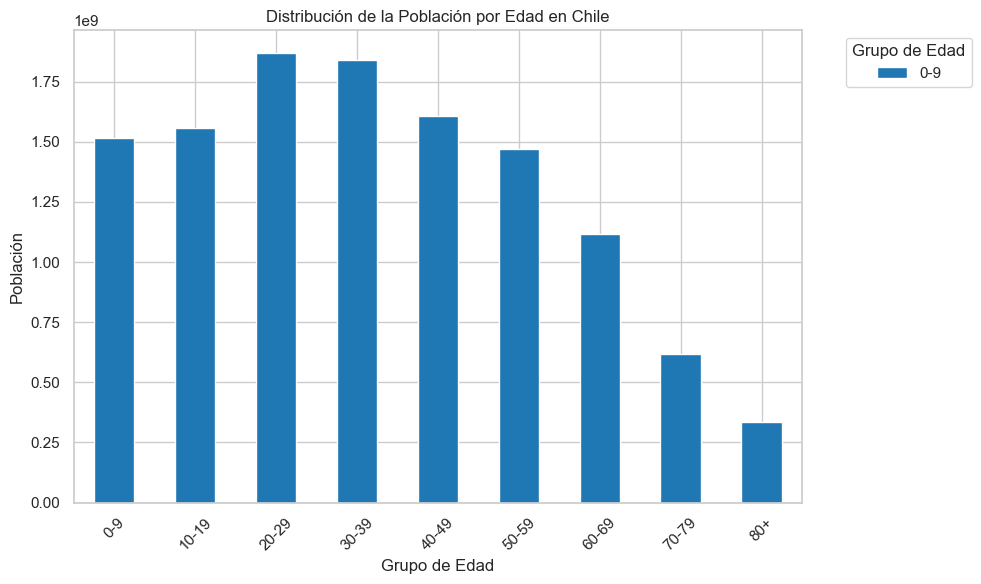

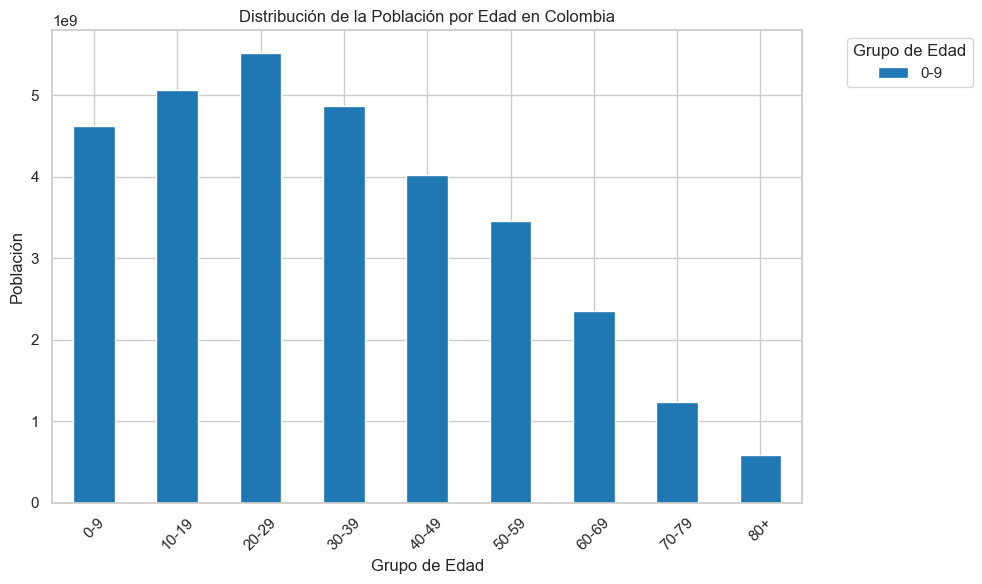

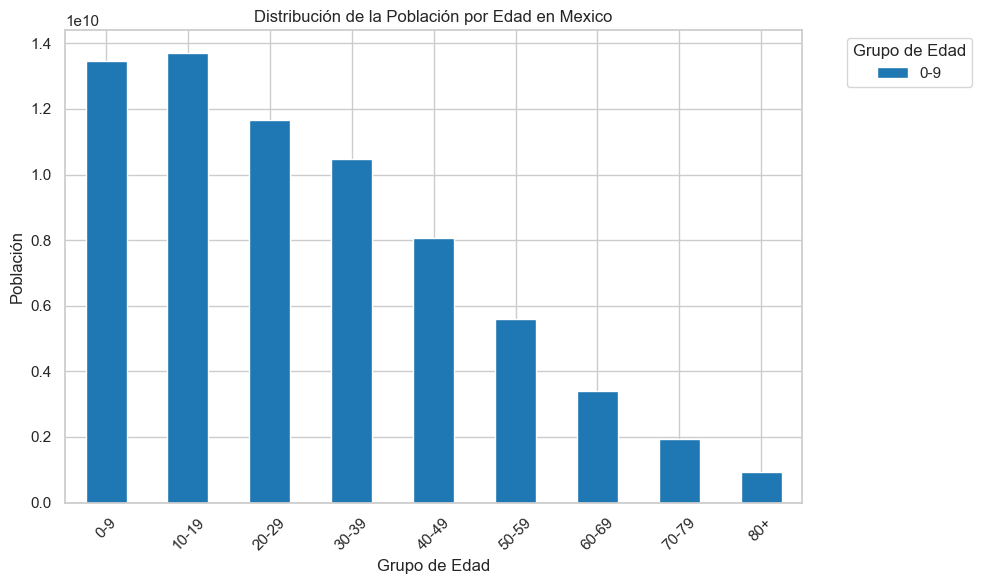

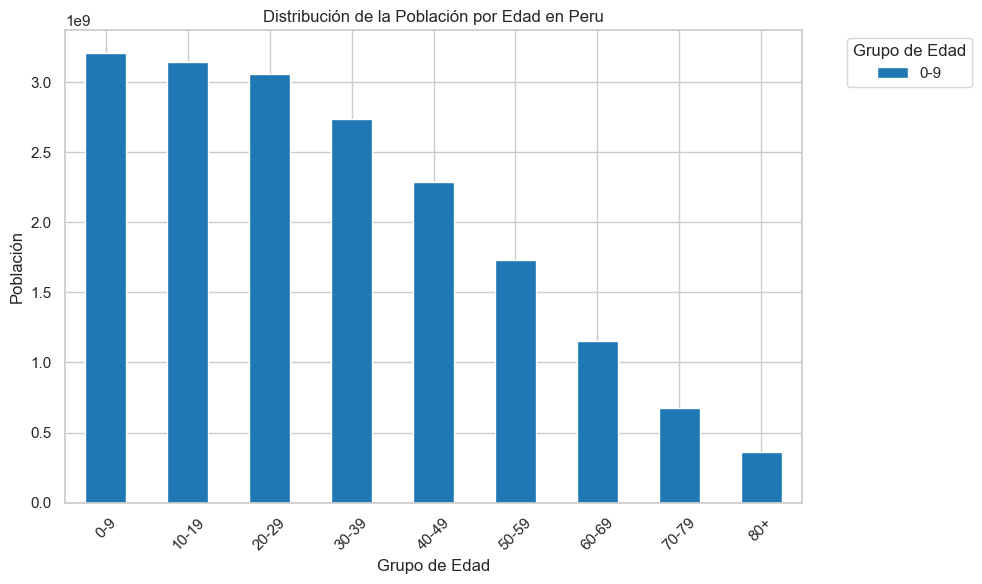

In [ ]:
# Distribución de la Población por Edad por países - OK
import matplotlib.pyplot as plt
import pandas as pd

# Seleccionar las columnas de interés
age_columns = ['population_age_00_09', 'population_age_10_19', 'population_age_20_29',
               'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
               'population_age_60_69', 'population_age_70_79', 'population_age_80_and_older']

# Iterar sobre cada país y crear un gráfico de barras apiladas
for country in data_lista['country_name'].unique():
    # Filtrar el DataFrame por país y seleccionar las columnas de edad
    df_country = data_lista[data_lista['country_name'] == country][age_columns].sum()
    
    # Reemplazar los nombres de los grupos de edad para que sean más legibles
    df_country.index = ['0-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+']

    # Crear el gráfico de barras apiladas
    df_country.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')

    # Añadir títulos y etiquetas
    plt.title(f'Distribución de la Población por Edad en {country}')
    plt.xlabel('Grupo de Edad')
    plt.ylabel('Población')
    plt.xticks(rotation=45)
    
    # Especificar manualmente las etiquetas de la leyenda
    plt.legend(title='Grupo de Edad', labels=df_country.index, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()


##### Distribución de la Población por Edad en Países 

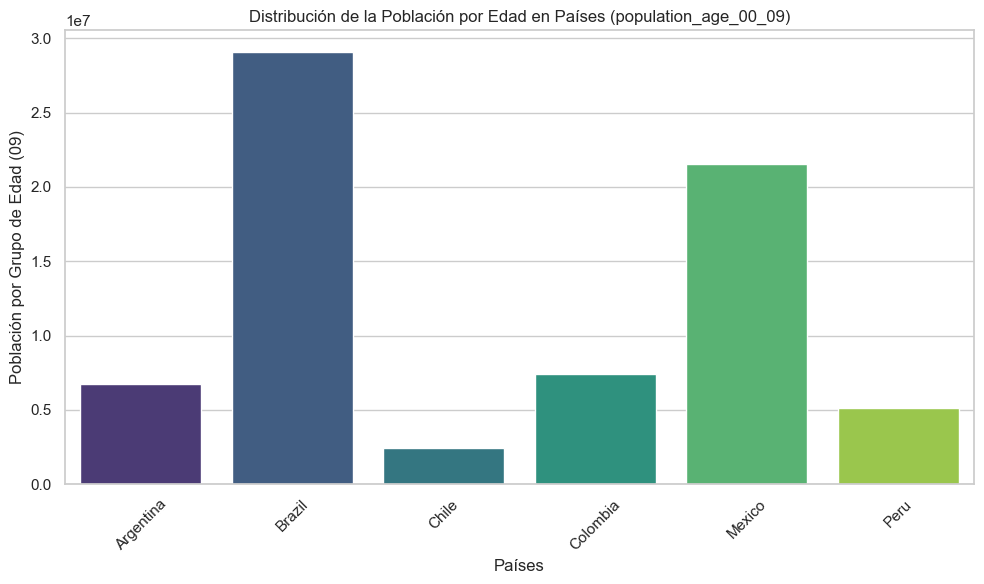

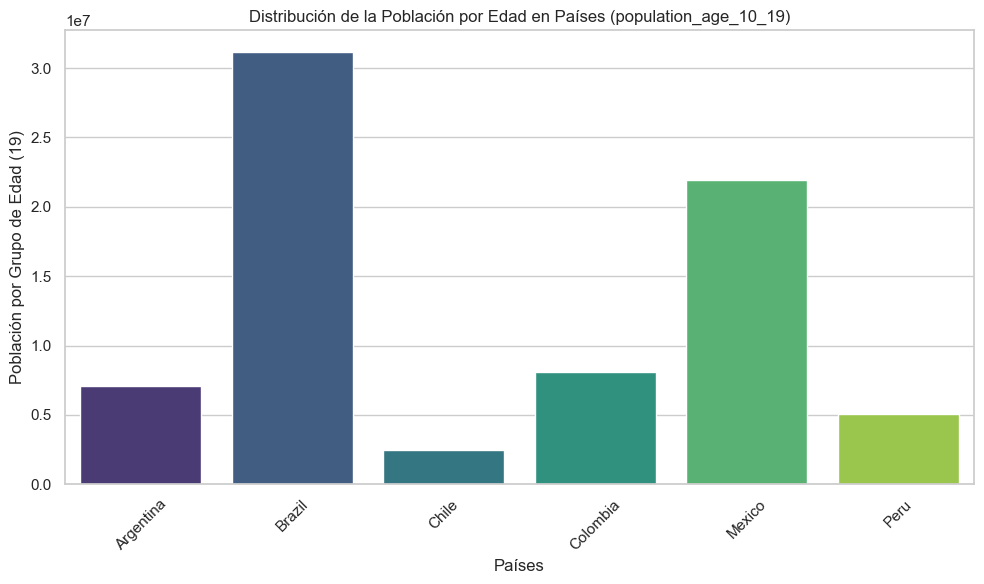

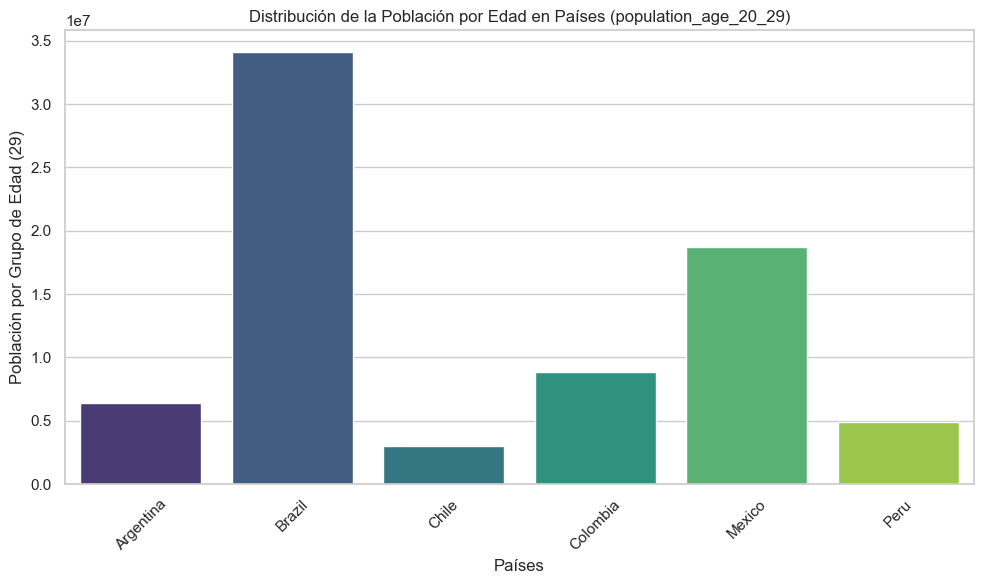

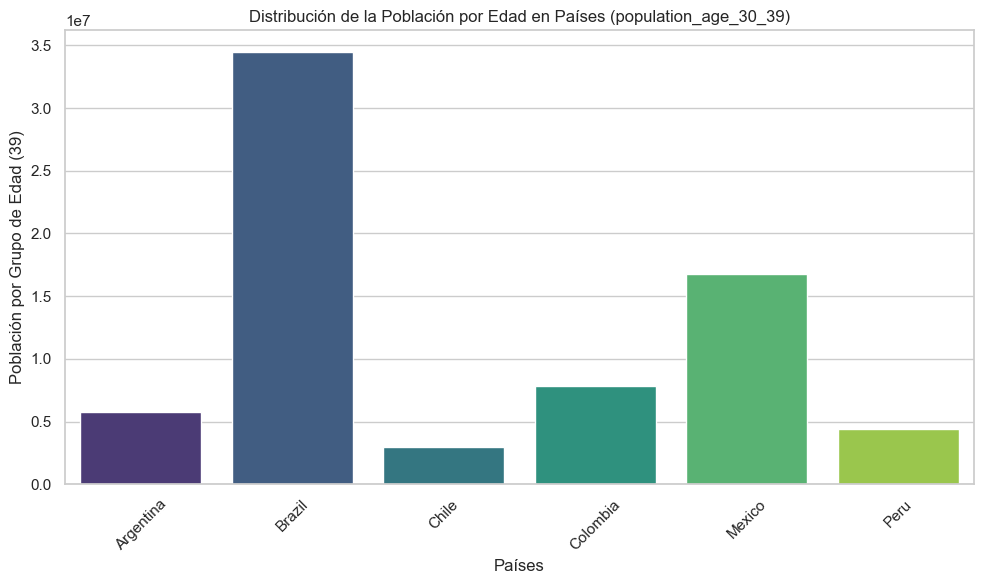

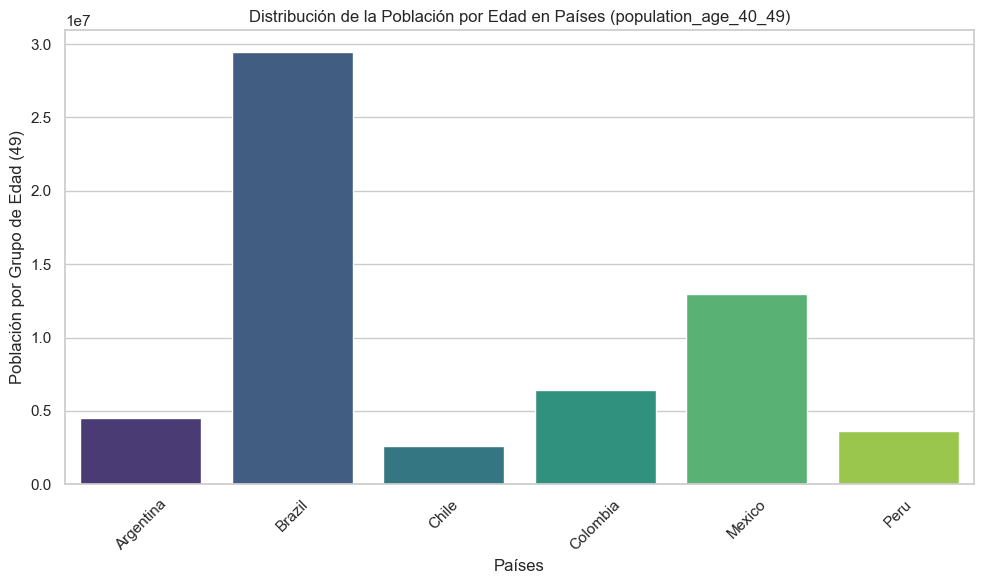

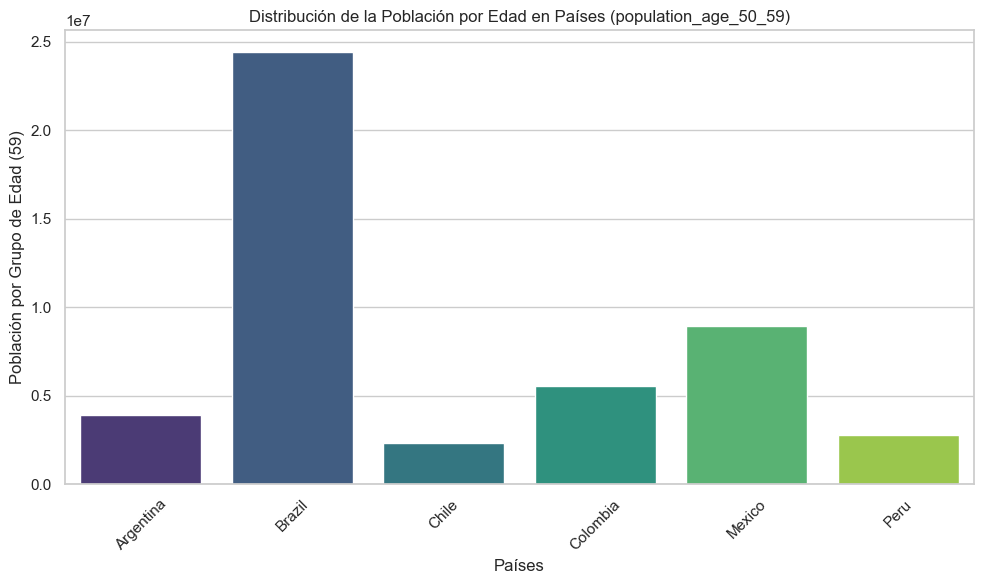

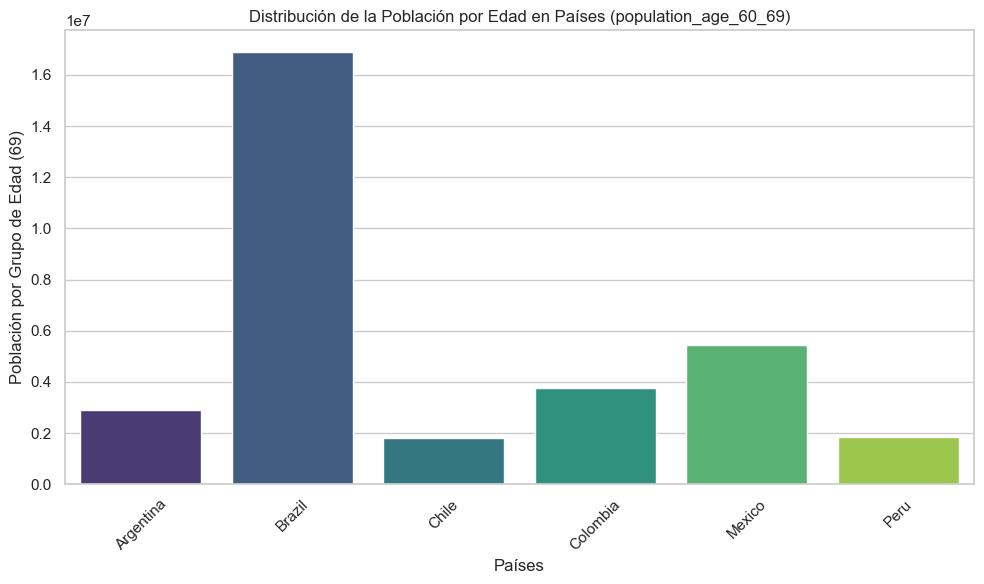

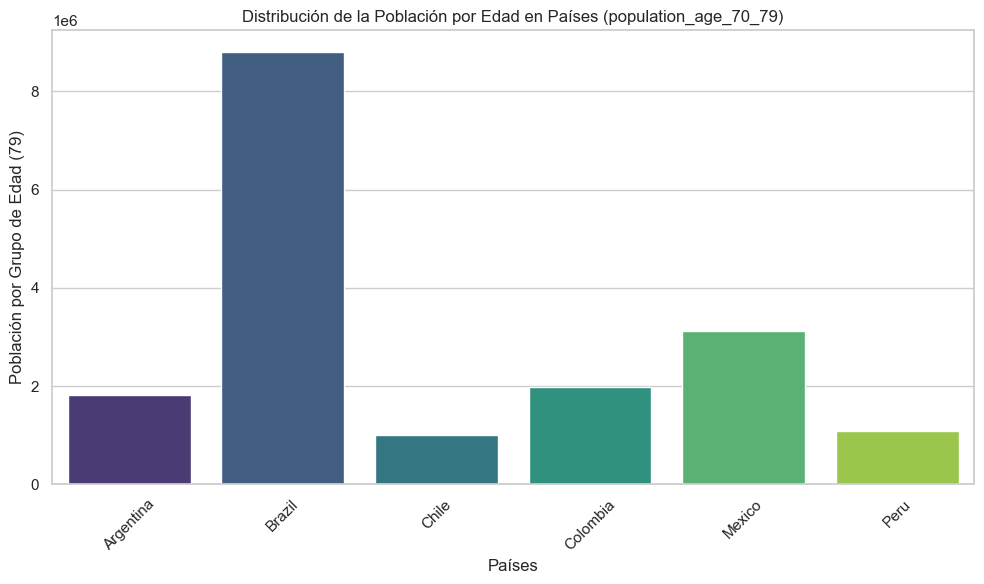

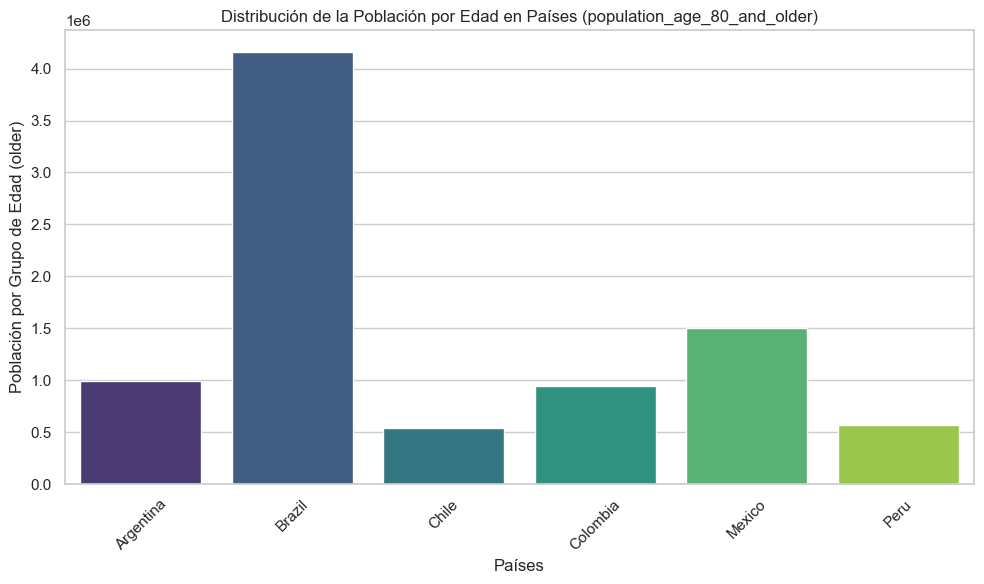

In [ ]:
# Distribución de la Población por Edad en Países -  Ok Otra opción de visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de columnas de edad
age_columns = ['population_age_00_09', 'population_age_10_19', 'population_age_20_29',
               'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
               'population_age_60_69', 'population_age_70_79', 'population_age_80_and_older']

# Iterar sobre cada columna y crear un gráfico de barras apiladas para cada una
for column in age_columns:
    # Configuración del tamaño de la figura
    plt.figure(figsize=(10, 6))
    
    # Gráfico de barras apiladas
    sns.barplot(data=data_lista, x='country_name', y=column, hue='country_name', palette='viridis', legend=False)
    
    # Título y etiquetas de los ejes
    plt.title(f'Distribución de la Población por Edad en Países ({column})')
    plt.xlabel('Países')
    plt.ylabel(f'Población por Grupo de Edad ({column.split("_")[-1]})')
    
    # Rotación de las etiquetas del eje x para mejor legibilidad
    plt.xticks(rotation=45)
    
    # Ajuste del diseño y visualización del gráfico
    plt.tight_layout()
    plt.show()


##### Comparación de Estrategias de Vacunación en América Latina 

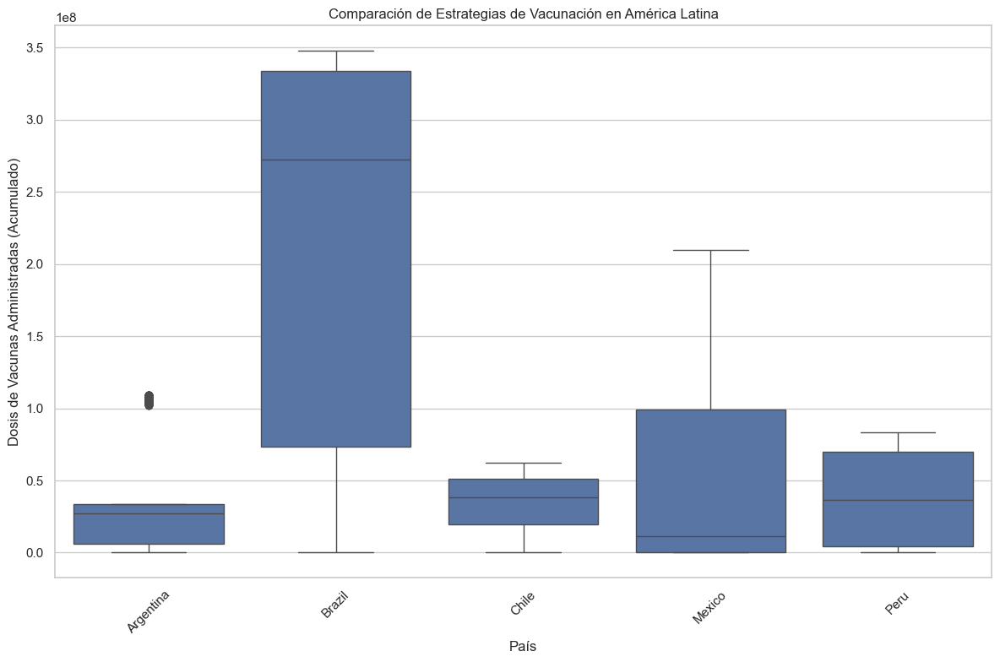

In [ ]:
# 20 - Comparación de Estrategias de Vacunación en América Latina - OK
plt.figure(figsize=(12, 8))
sns.boxplot(data=data_lista[data_lista['country_name'].isin(['Argentina', 'Brazil', 'Mexico', 'Chile', 'Peru'])], x='country_name', y='cumulative_vaccine_doses_administered')
plt.title('Comparación de Estrategias de Vacunación en América Latina')
plt.xlabel('País')
plt.ylabel('Dosis de Vacunas Administradas (Acumulado)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#####  Evolución del Número de Muertes Diarias

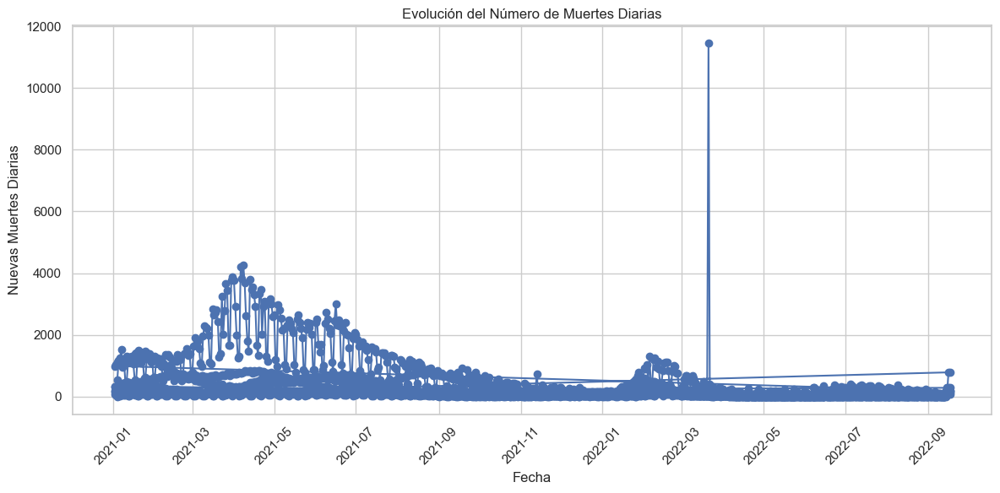

In [ ]:
# 21 - Evolución del Número de Muertes Diarias - OK
plt.figure(figsize=(12, 6))
plt.plot(data_lista.index, data_lista['new_deceased'], marker='o', linestyle='-')
plt.title('Evolución del Número de Muertes Diarias')
plt.xlabel('Fecha')
plt.ylabel('Nuevas Muertes Diarias')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


##### Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad 

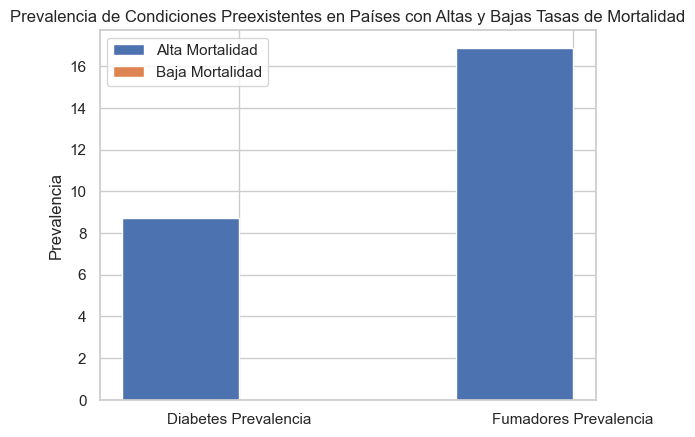

In [ ]:
# 22 - Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad - OK
import numpy as np
import matplotlib.pyplot as plt

# Definir umbrales para las tasas de mortalidad alta y baja
high_mortality_threshold = 100  # Ejemplo de umbral para alta tasa de mortalidad

# Crear una nueva columna para clasificar los países en grupos de alta y baja mortalidad
data_lista['mortality_group'] = np.where(data_lista['adult_male_mortality_rate'] > high_mortality_threshold, 'Alta', 'Baja')

# Calcular la prevalencia de condiciones preexistentes para cada grupo
prevalence_high_mortality = data_lista[data_lista['mortality_group'] == 'Alta'][['diabetes_prevalence', 'smoking_prevalence']].mean()
prevalence_low_mortality = data_lista[data_lista['mortality_group'] == 'Baja'][['diabetes_prevalence', 'smoking_prevalence']].mean()

# Crear el gráfico de barras comparativo
labels = ['Diabetes Prevalencia', 'Fumadores Prevalencia']
high_mortality_values = prevalence_high_mortality.values
low_mortality_values = prevalence_low_mortality.values

x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, high_mortality_values, width, label='Alta Mortalidad')
rects2 = ax.bar(x + width/2, low_mortality_values, width, label='Baja Mortalidad')

ax.set_ylabel('Prevalencia')
ax.set_title('Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.show()



##### Cómo evolucionó la mortalidad 

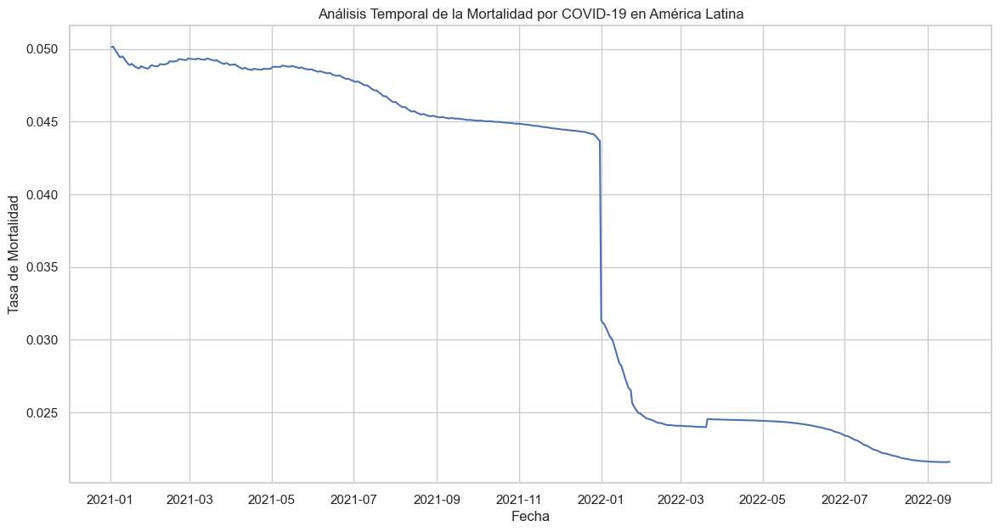

In [ ]:
# 23 - Cómo evolucionó la mortalidad - OK
data_lista['mortality_rate'] = data_lista['cumulative_deceased'] / data_lista['cumulative_confirmed']

plt.figure(figsize=(14, 7))
sns.lineplot(data=data_lista, x='date', y='mortality_rate', estimator='mean', errorbar=None)
plt.title('Análisis Temporal de la Mortalidad por COVID-19 en América Latina')
plt.xlabel('Fecha')
plt.ylabel('Tasa de Mortalidad')
plt.show()


##### Comparación de la Situación Actual

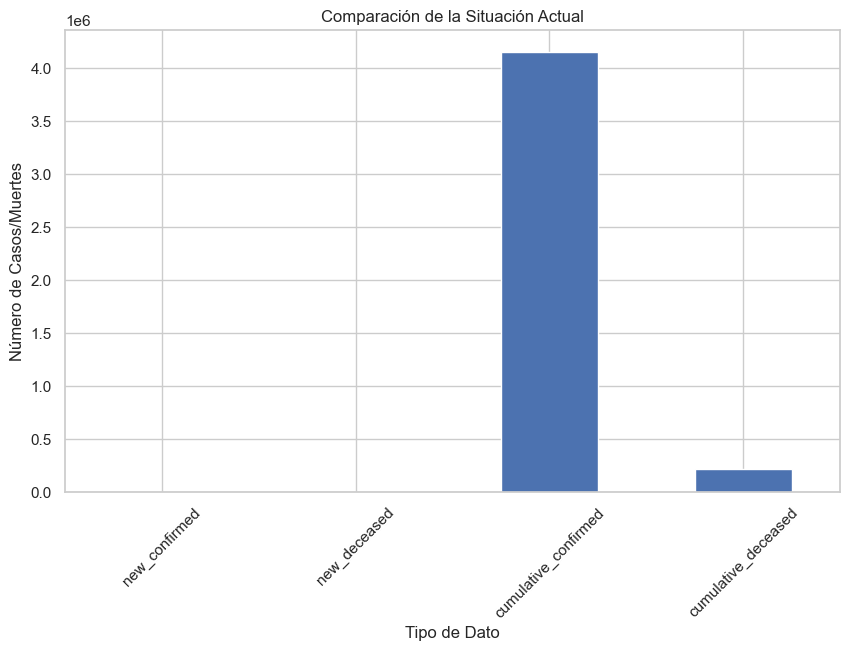

In [ ]:
# Comparación de la Situación Actual
plt.figure(figsize=(10, 6))
data_context = data_lista.iloc[-1][['new_confirmed', 'new_deceased', 'cumulative_confirmed', 'cumulative_deceased']]
data_context.plot(kind='bar')
plt.title('Comparación de la Situación Actual')
plt.xlabel('Tipo de Dato')
plt.ylabel('Número de Casos/Muertes')
plt.xticks(rotation=45)
plt.show()


##### Variación Mensual de Casos Nuevos y Muertes 

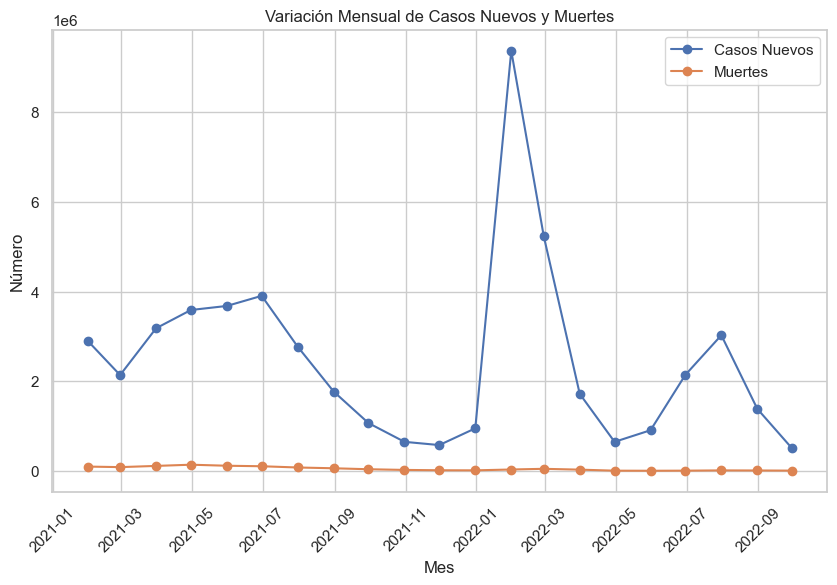

In [ ]:
# Variación Mensual de Casos Nuevos y Muertes - MAL
import matplotlib.pyplot as plt

# Agrupar los datos por mes y calcular la suma de casos nuevos y muertes para cada mes
monthly_data = data_lista.resample('ME').sum()

# Graficar la variación mensual de casos nuevos y muertes
plt.figure(figsize=(10, 6))
plt.plot(monthly_data.index, monthly_data['new_confirmed'], marker='o', label='Casos Nuevos')
plt.plot(monthly_data.index, monthly_data['new_deceased'], marker='o', label='Muertes')
plt.title('Variación Mensual de Casos Nuevos y Muertes')
plt.xlabel('Mes')
plt.ylabel('Número')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


##### Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad - ERROR

In [11]:
# Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad
plt.figure(figsize=(10, 6))
sns.boxplot(x='preexisting_conditions', y='new_deceased', data=data_lista.reset_index())
plt.title('Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad')
plt.xlabel('Condiciones Preexistentes')
plt.ylabel('Número de Muertes Diarias')
plt.xticks(rotation=45)
plt.show()


ValueError: Could not interpret value `preexisting_conditions` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

##### Variación Mensual de Casos y Muertes

C:\Users\Personal Computer\AppData\Local\Temp\ipykernel_4984\3634369324.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  data_monthly = data_lista.resample('M').sum()


<Figure size 1000x600 with 0 Axes>

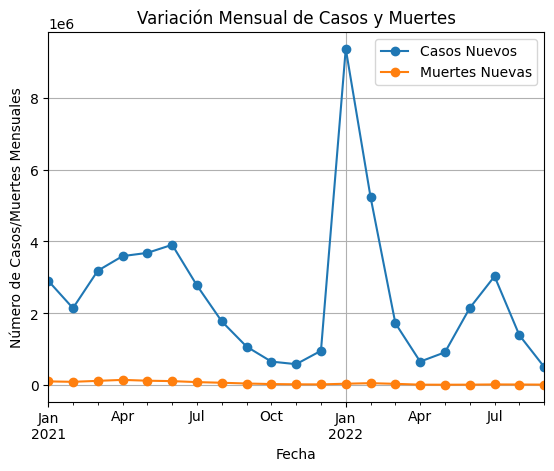

In [12]:
# Número de Casos/Muertes Mensuales
plt.figure(figsize=(10, 6))
data_monthly = data_lista.resample('M').sum()
data_monthly[['new_confirmed', 'new_deceased']].plot(marker='o', linestyle='-')
plt.title('Variación Mensual de Casos y Muertes')
plt.xlabel('Fecha')
plt.ylabel('Número de Casos/Muertes Mensuales')
plt.grid(True)
plt.legend(['Casos Nuevos', 'Muertes Nuevas'])
plt.show()



Gráfico de Dispersión (Scatter Plot)
Un gráfico de dispersión puede ser útil para observar la relación entre las dosis administradas y el tiempo, con diferentes colores para cada país.

##### Evolución de Dosis Administradas por Mes

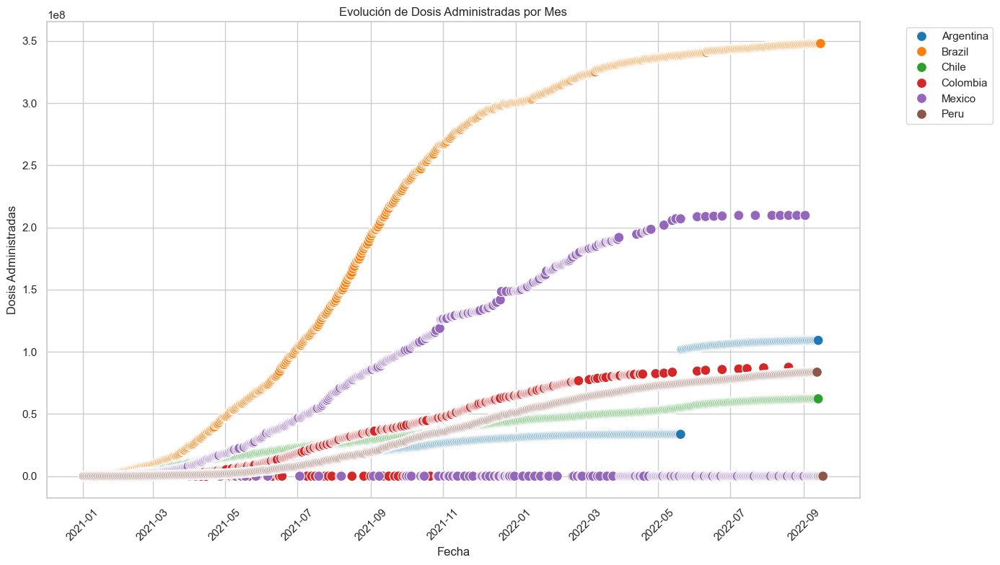

In [ ]:
# Evolución de Dosis Administradas por Mes
plt.figure(figsize=(14, 8))
sns.set_theme(style="whitegrid")

# Crear el gráfico de dispersión
sns.scatterplot(x='date', y='cumulative_vaccine_doses_administered', hue='country_name', data=data_lista, palette='tab10', s=100)
plt.title('Evolución de Dosis Administradas por Mes')
plt.xlabel('Fecha')
plt.ylabel('Dosis Administradas')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### Recuperaciones de casos por mes de cada país:

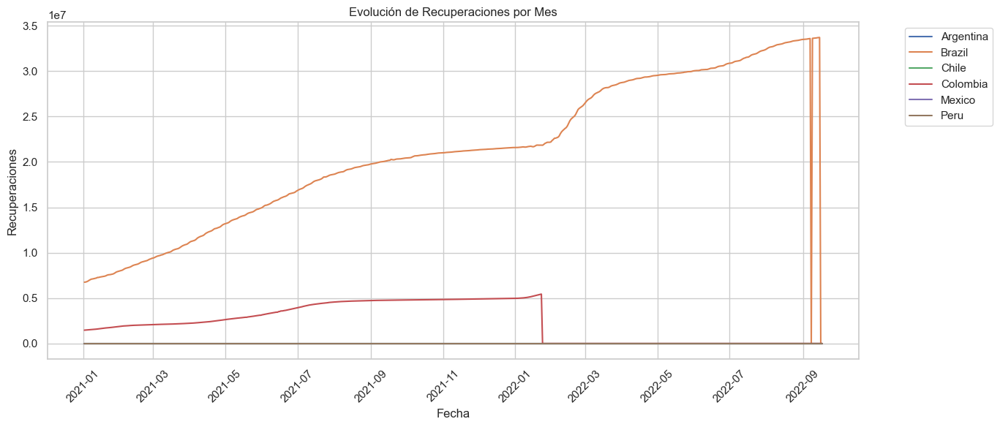

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='cumulative_recovered', hue='country_name', data=data_lista)
plt.title('Evolución de Recuperaciones por Mes')
plt.xlabel('Fecha')
plt.ylabel('Recuperaciones')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


##### Dosis acumuladas por país:

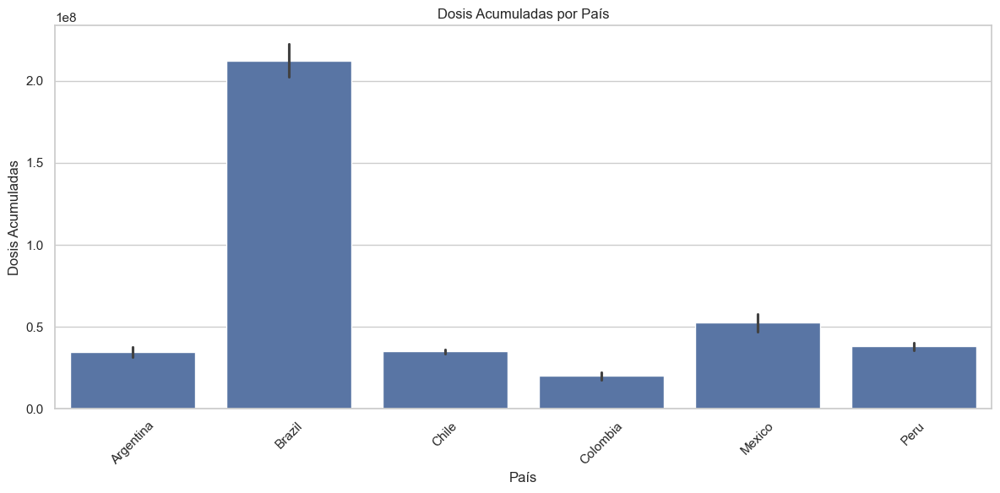

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x='country_name', y='cumulative_vaccine_doses_administered', data=data_lista)
plt.title('Dosis Acumuladas por País')
plt.xlabel('País')
plt.ylabel('Dosis Acumuladas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##### Análisis temporal:

Para examinar cómo varían los casos confirmados, las muertes y las tasas de vacunación a lo largo del tiempo. Use gráficos de líneas o series temporales para visualizar estas tendencias.

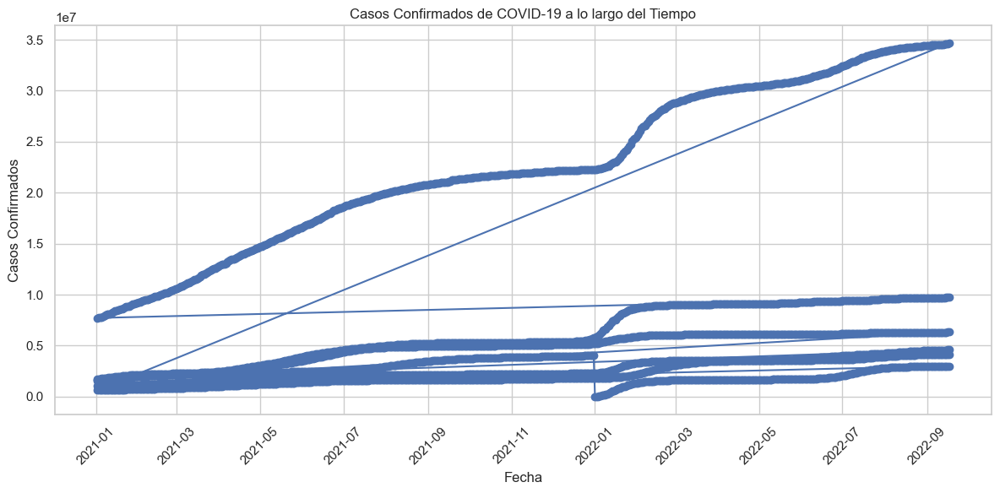

In [ ]:
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame data_lista tiene el índice de fecha
if not isinstance(data_lista.index, pd.DatetimeIndex):
    data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')
    data_lista.set_index('date', inplace=True)

# Gráfico de líneas para casos confirmados a lo largo del tiempo
plt.figure(figsize=(12, 6))
plt.plot(data_lista.index, data_lista['cumulative_confirmed'], marker='o', linestyle='-')
plt.title('Casos Confirmados de COVID-19 a lo largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Casos Confirmados')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


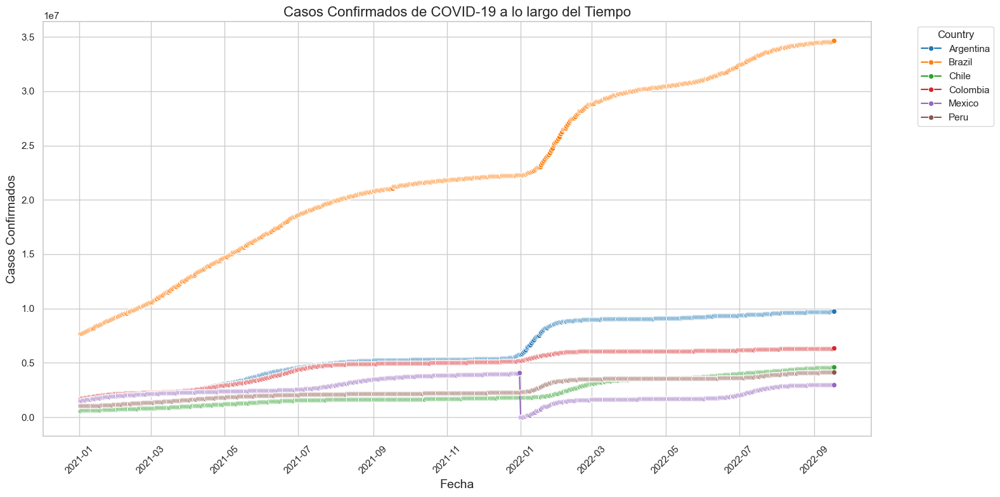

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración del tema de Seaborn
sns.set_theme(style="whitegrid")

# Crear la figura y el gráfico de líneas
plt.figure(figsize=(14, 8))
sns.lineplot(x='date', y='cumulative_confirmed', data=data_lista, marker='o', linestyle='-', hue='country_name', palette='tab10')

# Configuración del título y etiquetas
plt.title('Casos Confirmados de COVID-19 a lo largo del Tiempo', fontsize=16)
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Casos Confirmados', fontsize=14)

# Rotar las etiquetas del eje x
plt.xticks(rotation=45)

# Añadir una cuadrícula
plt.grid(True)

# Ajustar el diseño para que no se solapen los elementos
plt.tight_layout()

# Añadir leyenda
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Country')

# Mostrar el gráfico
plt.show()


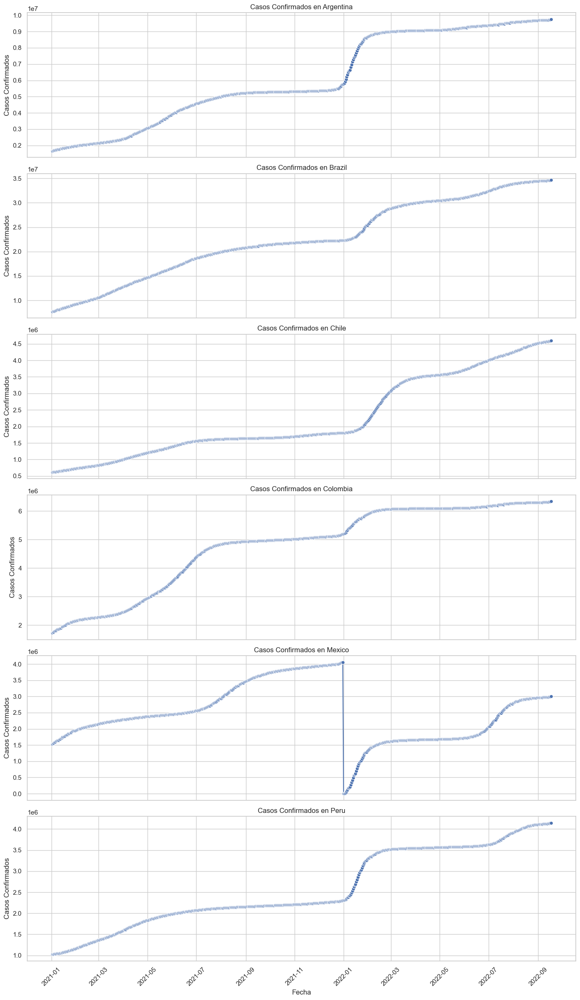

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración del tema de Seaborn
sns.set_theme(style="whitegrid")

# Número de países
num_countries = data_lista['country_name'].nunique()

# Crear la figura y los subplots
fig, axes = plt.subplots(num_countries, 1, figsize=(14, 4 * num_countries), sharex=True)

# Dibujar cada país en un subplot separado
for ax, country in zip(axes, data_lista['country_name'].unique()):
    country_data = data_lista[data_lista['country_name'] == country]
    sns.lineplot(x='date', y='cumulative_confirmed', data=country_data, marker='o', linestyle='-', ax=ax)
    ax.set_title(f'Casos Confirmados en {country}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Casos Confirmados')
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# Ajustar el diseño para que no se solapen los elementos
plt.tight_layout()

# Mostrar el gráfico
plt.show()


##### Casos Confirmados de COVID-19 por Mes

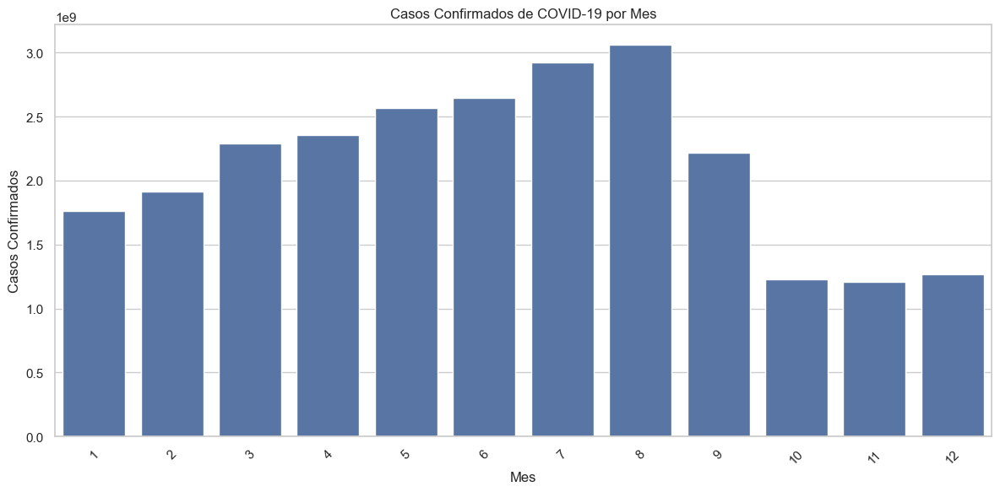

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Asegurarse de que el DataFrame data_lista tiene el índice de fecha
if 'date' not in data_lista.index.names:
    data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')
    data_lista.set_index('date', inplace=True)

# Crear una nueva columna 'month' para almacenar el mes de cada fecha
data_lista['month'] = data_lista.index.month

# Agrupar los datos por mes y calcular la suma de casos confirmados para cada mes
df_monthly_cases = data_lista.groupby('month')['cumulative_confirmed'].sum().reset_index()

# Crear el gráfico de barras agrupadas por mes
plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='cumulative_confirmed', data=df_monthly_cases)
plt.title('Casos Confirmados de COVID-19 por Mes')
plt.xlabel('Mes')
plt.ylabel('Casos Confirmados')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



##### 'Correlación entre Temperatura y Casos Confirmados'

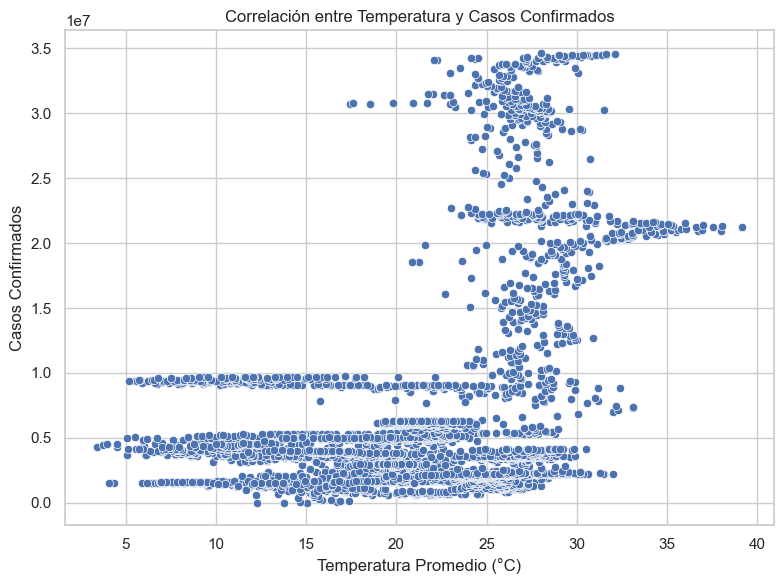

In [ ]:
# Gráfico de dispersión para correlación entre temperatura y casos confirmados:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='average_temperature_celsius', y='cumulative_confirmed', data=data_lista)
plt.title('Correlación entre Temperatura y Casos Confirmados')
plt.xlabel('Temperatura Promedio (°C)')
plt.ylabel('Casos Confirmados')
plt.tight_layout()
plt.show()


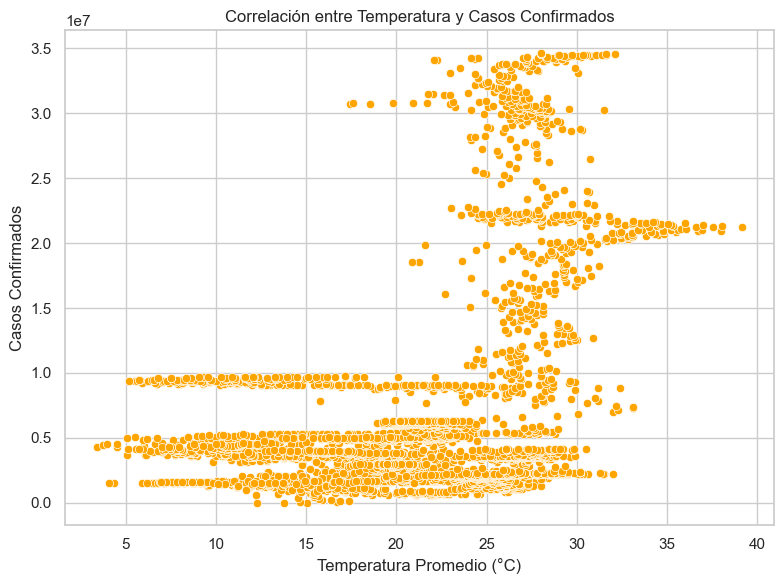

In [ ]:
# Gráfico de dispersión para correlación entre temperatura y casos confirmados:
plt.figure(figsize=(8, 6))

# Cambio de color del gráfico de dispersión
sns.scatterplot(x='average_temperature_celsius', y='cumulative_confirmed', data=data_lista, color='orange')

# Título y etiquetas de los ejes
plt.title('Correlación entre Temperatura y Casos Confirmados')
plt.xlabel('Temperatura Promedio (°C)')
plt.ylabel('Casos Confirmados')

# Ajuste del diseño y visualización del gráfico
plt.tight_layout()
plt.show()


##### Gráficos de dispersión - Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas

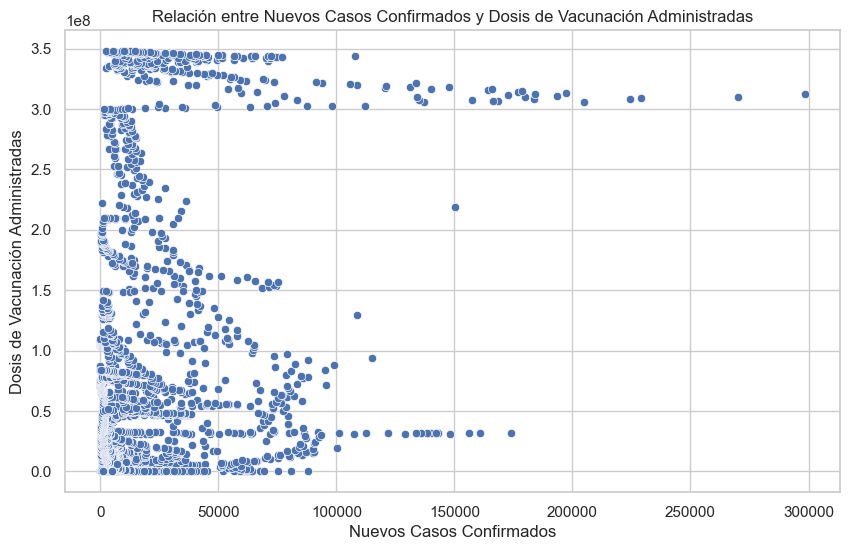

In [ ]:
# Gráficos de dispersión - Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas
# Graficar el gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(x='new_confirmed', y='cumulative_vaccine_doses_administered', data=data_lista)
plt.title('Relación entre Nuevos Casos Confirmados y Dosis de Vacunación Administradas')
plt.xlabel('Nuevos Casos Confirmados')
plt.ylabel('Dosis de Vacunación Administradas')
plt.show()


##### Evolución de dosis administradas por mes de cada país

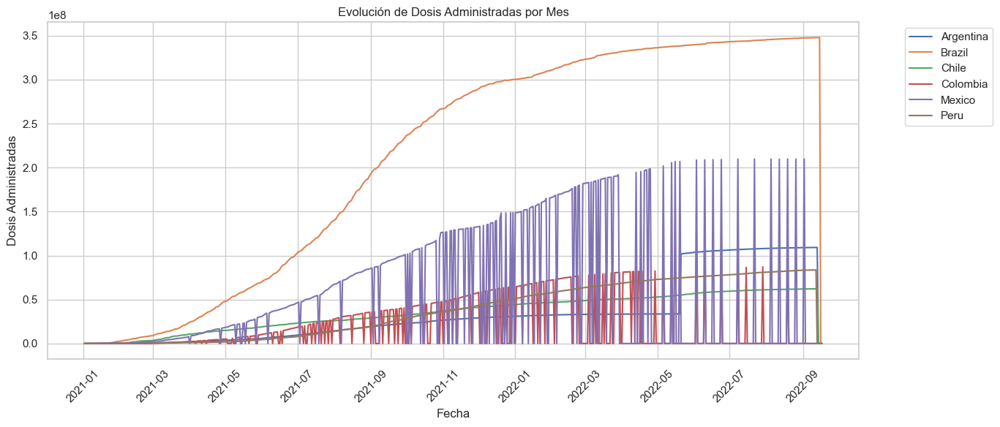

In [ ]:
# Evolución de dosis administradas por mes de cada país
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='cumulative_vaccine_doses_administered', hue='country_name', data=data_lista)
plt.title('Evolución de Dosis Administradas por Mes')
plt.xlabel('Fecha')
plt.ylabel('Dosis Administradas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


##### 'Evolución de Nuevos Casos Confirmados y Dosis de Vacunación Administradas

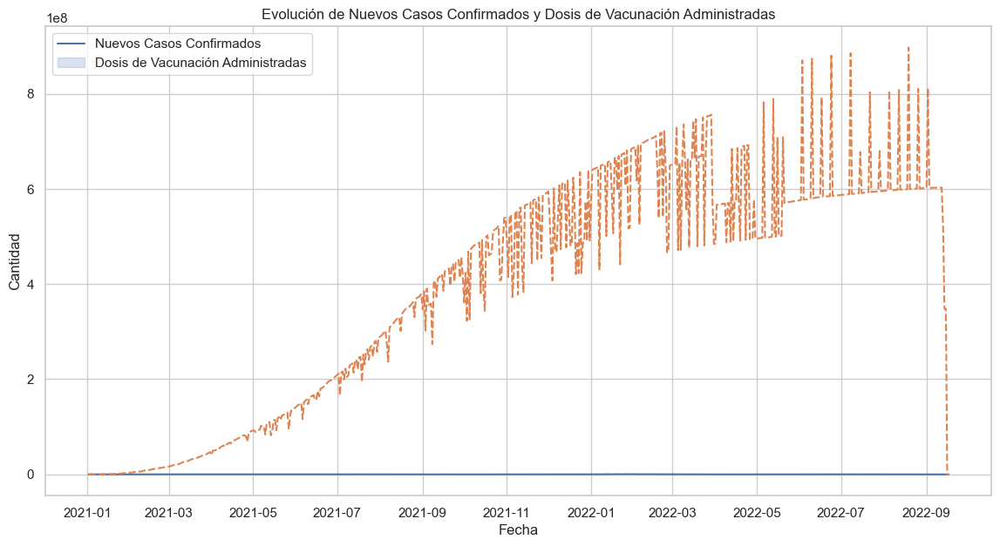

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que data_lista es tu DataFrame y ya tiene la columna 'date' como índice

# Agregar datos por nombre de país si hay duplicados
data_agg = data_lista.groupby('date').sum()

# Graficar el gráfico de líneas
plt.figure(figsize=(14, 7))
sns.lineplot(data=data_agg[['new_confirmed', 'cumulative_vaccine_doses_administered']])
plt.title('Evolución de Nuevos Casos Confirmados y Dosis de Vacunación Administradas')
plt.xlabel('Fecha')
plt.ylabel('Cantidad')
plt.legend(['Nuevos Casos Confirmados', 'Dosis de Vacunación Administradas'])
plt.show()


##### Evolución Acumulativa de Nuevos Casos Confirmados y Dosis de Vacunación Administradas

<Figure size 1400x700 with 0 Axes>

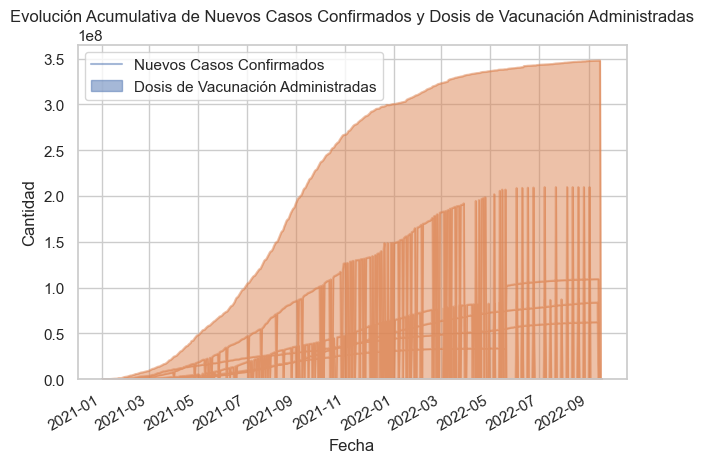

In [ ]:
import matplotlib.pyplot as plt

# Graficar el gráfico de áreas
plt.figure(figsize=(14, 7))  # Configurar el tamaño de la figura
# Crear el gráfico de áreas para las columnas 'new_confirmed' y 'cumulative_vaccine_doses_administered'
data_lista[['new_confirmed', 'cumulative_vaccine_doses_administered']].plot(kind='area', stacked=False, alpha=0.5)
plt.title('Evolución Acumulativa de Nuevos Casos Confirmados y Dosis de Vacunación Administradas')  # Título del gráfico
plt.xlabel('Fecha')  # Etiqueta del eje x
plt.ylabel('Cantidad')  # Etiqueta del eje y
plt.legend(['Nuevos Casos Confirmados', 'Dosis de Vacunación Administradas'])  # Leyenda del gráfico
plt.grid(True)  # Mostrar la cuadrícula
plt.tight_layout()  # Ajustar el diseño para que no se solapen los elementos
plt.show()  # Mostrar el gráfico


Gráfico de Dispersión (Scatter Plot)
Un gráfico de dispersión puede ser útil para observar la relación entre las dosis administradas y el tiempo, con diferentes colores para cada país.

##### Evolución de Dosis Administradas por Mes

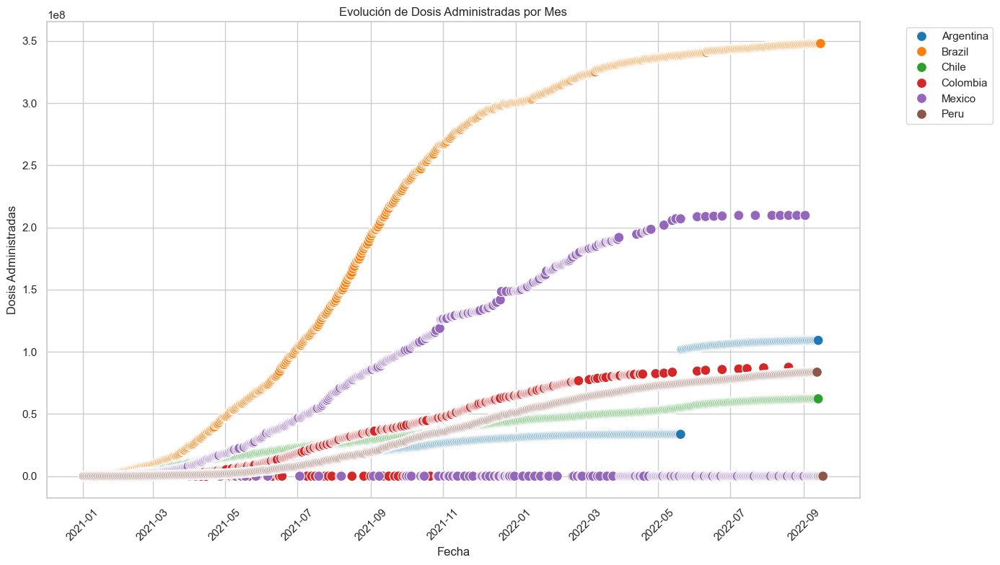

In [ ]:
# Evolución de Dosis Administradas por Mes
plt.figure(figsize=(14, 8))
sns.set_theme(style="whitegrid")

# Crear el gráfico de dispersión
sns.scatterplot(x='date', y='cumulative_vaccine_doses_administered', hue='country_name', data=data_lista, palette='tab10', s=100)
plt.title('Evolución de Dosis Administradas por Mes')
plt.xlabel('Fecha')
plt.ylabel('Dosis Administradas')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### Muertes por mes de cada país:

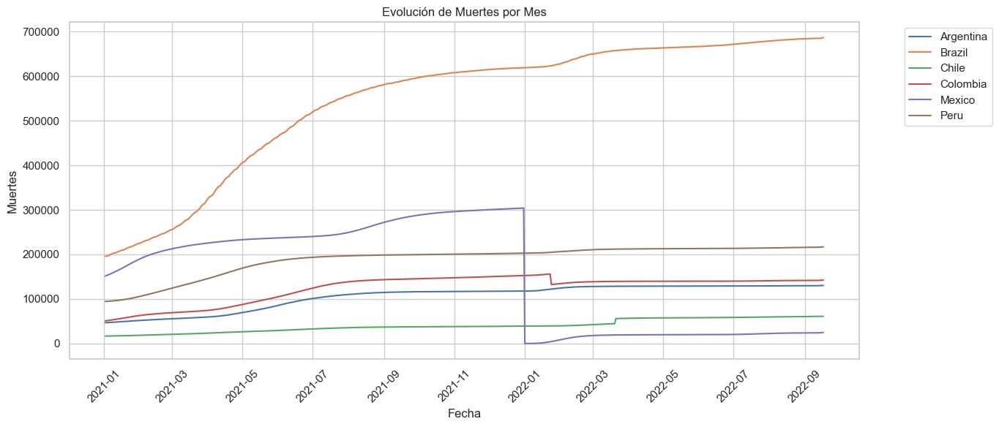

In [ ]:
# Muertes por mes de cada país
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='cumulative_deceased', hue='country_name', data=data_lista)
plt.title('Evolución de Muertes por Mes')
plt.xlabel('Fecha')
plt.ylabel('Muertes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


##### Recuperaciones de casos por mes de cada país:

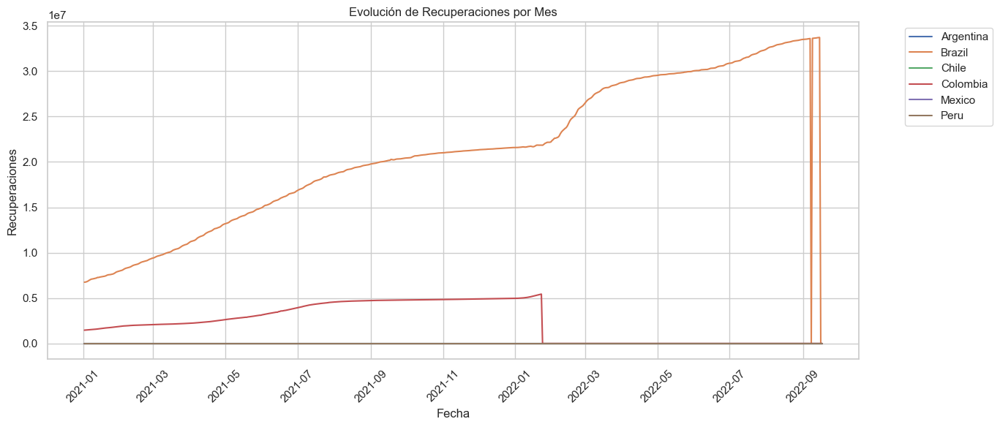

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='cumulative_recovered', hue='country_name', data=data_lista)
plt.title('Evolución de Recuperaciones por Mes')
plt.xlabel('Fecha')
plt.ylabel('Recuperaciones')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


##### Dosis acumuladas por país:

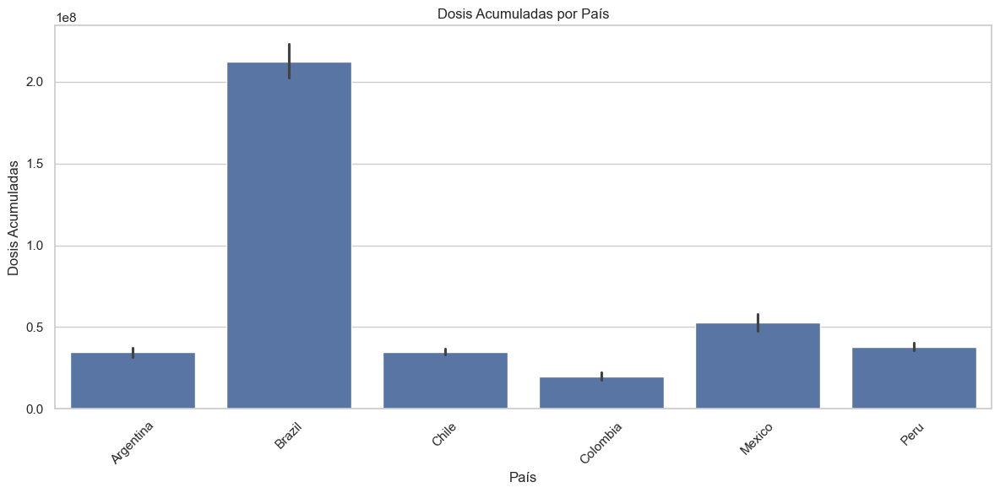

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x='country_name', y='cumulative_vaccine_doses_administered', data=data_lista)
plt.title('Dosis Acumuladas por País')
plt.xlabel('País')
plt.ylabel('Dosis Acumuladas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##### Casos Confirmados de COVID-19 a lo largo del Tiempo

Análisis temporal:

Para examinar cómo varían los casos confirmados, las muertes y las tasas de vacunación a lo largo del tiempo. Use gráficos de líneas o series temporales para visualizar estas tendencias.

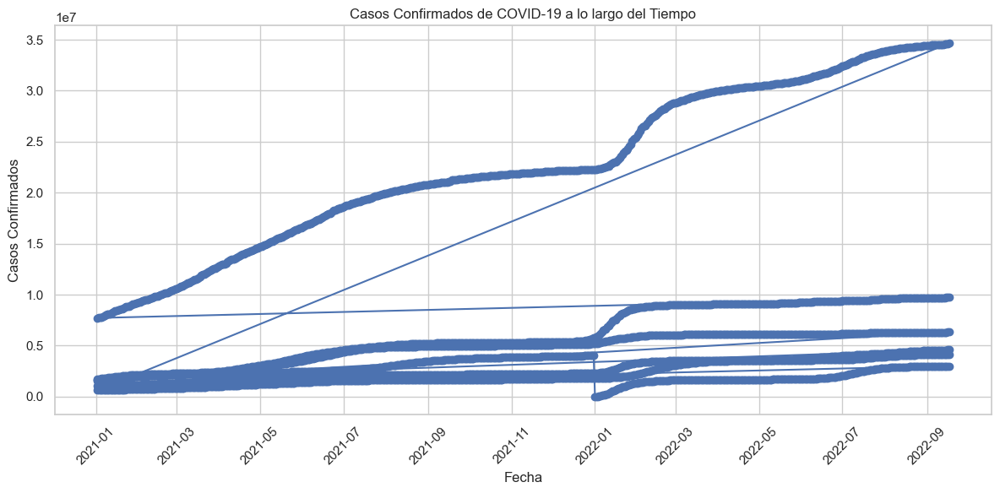

In [ ]:
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame data_lista tiene el índice de fecha
if not isinstance(data_lista.index, pd.DatetimeIndex):
    data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')
    data_lista.set_index('date', inplace=True)

# Gráfico de líneas para casos confirmados a lo largo del tiempo
plt.figure(figsize=(12, 6))
plt.plot(data_lista.index, data_lista['cumulative_confirmed'], marker='o', linestyle='-')
plt.title('Casos Confirmados de COVID-19 a lo largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Casos Confirmados')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


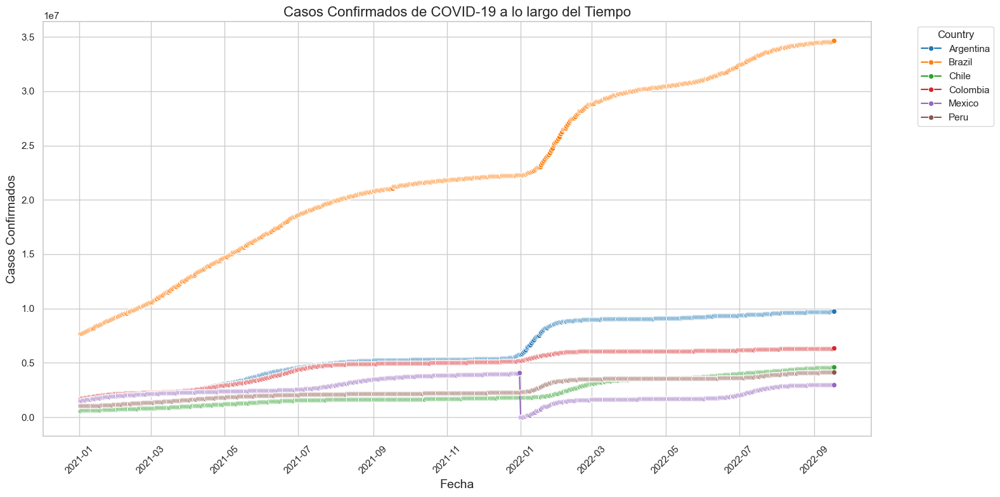

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración del tema de Seaborn
sns.set_theme(style="whitegrid")

# Crear la figura y el gráfico de líneas
plt.figure(figsize=(14, 8))
sns.lineplot(x='date', y='cumulative_confirmed', data=data_lista, marker='o', linestyle='-', hue='country_name', palette='tab10')

# Configuración del título y etiquetas
plt.title('Casos Confirmados de COVID-19 a lo largo del Tiempo', fontsize=16)
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Casos Confirmados', fontsize=14)

# Rotar las etiquetas del eje x
plt.xticks(rotation=45)

# Añadir una cuadrícula
plt.grid(True)

# Ajustar el diseño para que no se solapen los elementos
plt.tight_layout()

# Añadir leyenda
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Country')

# Mostrar el gráfico
plt.show()


##### Casos Confirmados por pais

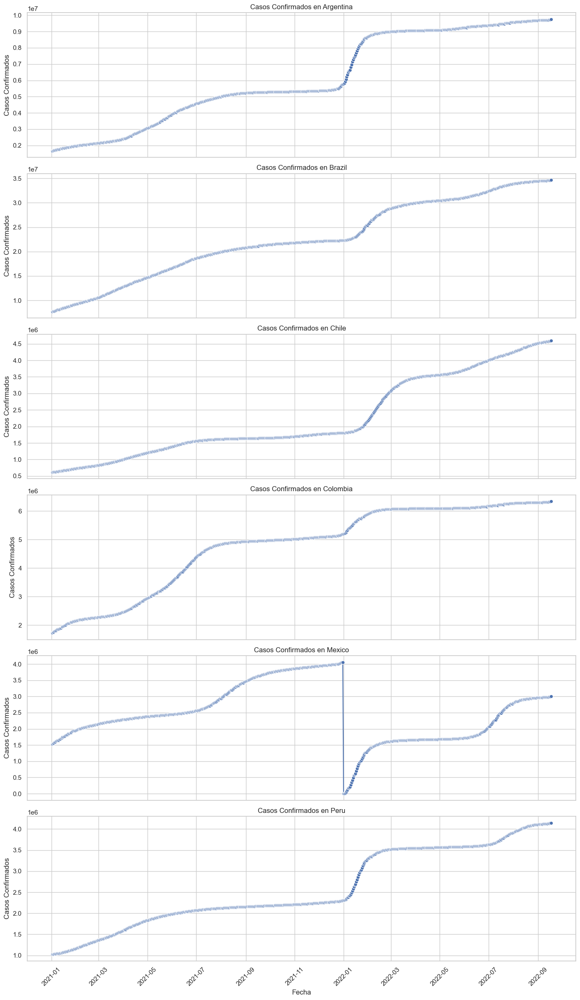

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración del tema de Seaborn
sns.set_theme(style="whitegrid")

# Número de países
num_countries = data_lista['country_name'].nunique()

# Crear la figura y los subplots
fig, axes = plt.subplots(num_countries, 1, figsize=(14, 4 * num_countries), sharex=True)

# Dibujar cada país en un subplot separado
for ax, country in zip(axes, data_lista['country_name'].unique()):
    country_data = data_lista[data_lista['country_name'] == country]
    sns.lineplot(x='date', y='cumulative_confirmed', data=country_data, marker='o', linestyle='-', ax=ax)
    ax.set_title(f'Casos Confirmados en {country}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Casos Confirmados')
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# Ajustar el diseño para que no se solapen los elementos
plt.tight_layout()

# Mostrar el gráfico
plt.show()


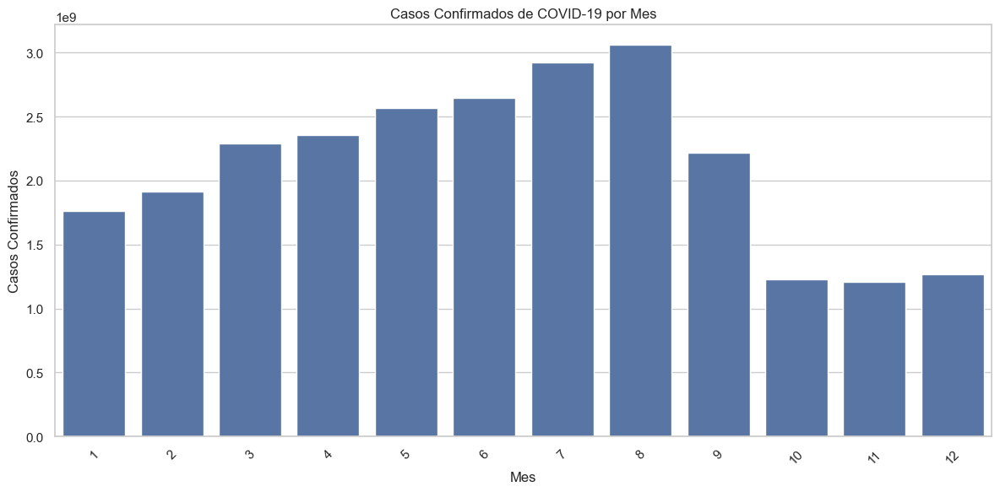

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Asegurarse de que el DataFrame data_lista tiene el índice de fecha
if 'date' not in data_lista.index.names:
    data_lista['date'] = pd.to_datetime(data_lista['date'], errors='coerce')
    data_lista.set_index('date', inplace=True)

# Crear una nueva columna 'month' para almacenar el mes de cada fecha
data_lista['month'] = data_lista.index.month

# Agrupar los datos por mes y calcular la suma de casos confirmados para cada mes
df_monthly_cases = data_lista.groupby('month')['cumulative_confirmed'].sum().reset_index()

# Crear el gráfico de barras agrupadas por mes
plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='cumulative_confirmed', data=df_monthly_cases)
plt.title('Casos Confirmados de COVID-19 por Mes')
plt.xlabel('Mes')
plt.ylabel('Casos Confirmados')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



#####  Gráfico de dispersión para correlación entre temperatura y casos confirmados

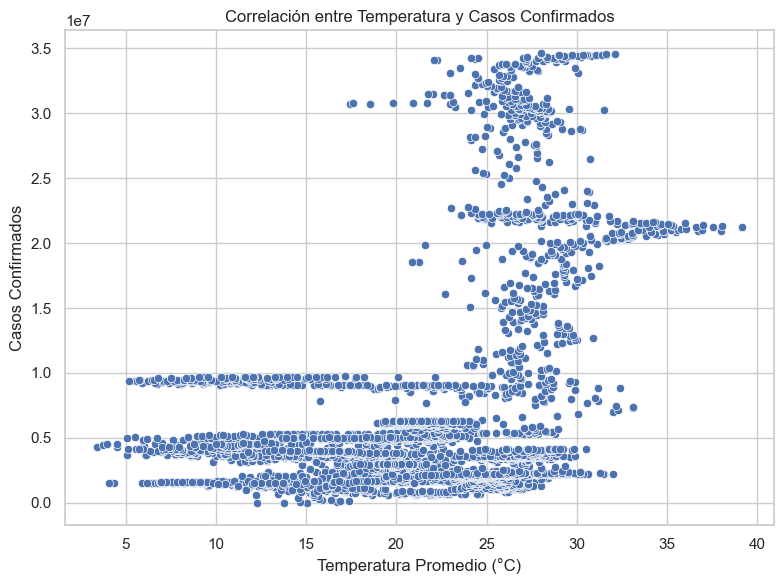

In [ ]:
# Gráfico de dispersión para correlación entre temperatura y casos confirmados:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='average_temperature_celsius', y='cumulative_confirmed', data=data_lista)
plt.title('Correlación entre Temperatura y Casos Confirmados')
plt.xlabel('Temperatura Promedio (°C)')
plt.ylabel('Casos Confirmados')
plt.tight_layout()
plt.show()


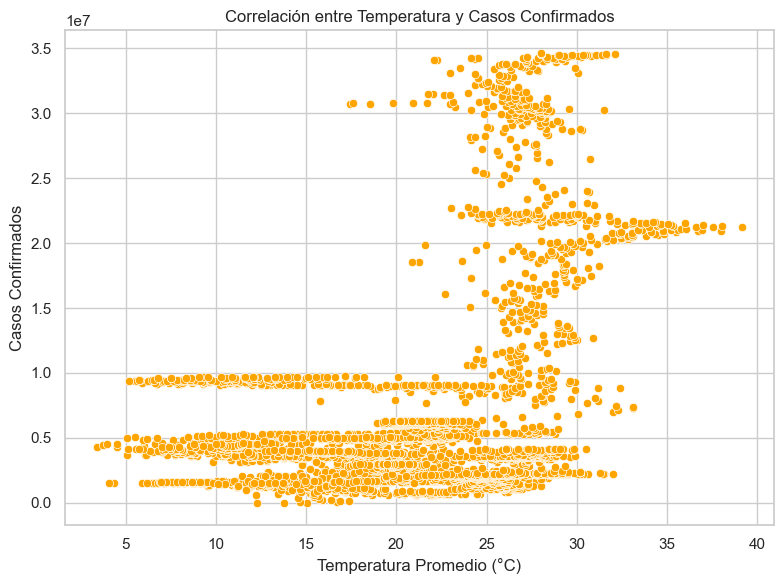

In [ ]:
# Gráfico de dispersión para correlación entre temperatura y casos confirmados:
plt.figure(figsize=(8, 6))

# Cambio de color del gráfico de dispersión
sns.scatterplot(x='average_temperature_celsius', y='cumulative_confirmed', data=data_lista, color='orange')

# Título y etiquetas de los ejes
plt.title('Correlación entre Temperatura y Casos Confirmados')
plt.xlabel('Temperatura Promedio (°C)')
plt.ylabel('Casos Confirmados')

# Ajuste del diseño y visualización del gráfico
plt.tight_layout()
plt.show()
